In [2]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from scipy.stats import levy_stable
import torchsde
#画热图
import seaborn as sns

In [3]:
def setup_seed(seed):
      torch.manual_seed(seed)
      torch.cuda.manual_seed_all(seed)
      np.random.seed(seed)
      # random.seed(seed)
      torch.backends.cudnn.deterministic = True

In [4]:
setup_seed(4)

In [5]:
data = pd.read_csv(".\Data set\shangzheng50.csv")

In [6]:
data=data[['date','code','open','close','high','low','volume']]

In [7]:
data

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0
...,...,...,...,...,...,...,...
4189,2021-03-31,sz50,3573.86,3539.37,3573.86,3518.17,29985299.0
4190,2021-04-01,sz50,3547.46,3582.65,3586.36,3545.09,21357739.0
4191,2021-04-02,sz50,3592.88,3616.76,3616.80,3583.04,23396735.0
4192,2021-04-06,sz50,3624.80,3594.71,3624.80,3581.76,17974469.0


In [8]:
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['date']= pd.to_datetime(data['date']) 
data.head()

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0


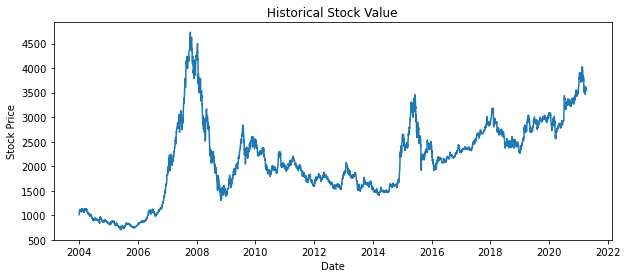

In [9]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['date'],data['close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# Data Cleaning and Splitting

In [10]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['date']
stk_data['Open'] = data['open']
stk_data['High'] = data['high']
stk_data['Low'] = data['low']
stk_data['Close'] = data['close']
stk_data.head()

,Date,Open,High,Low,Close
0,2004-01-02,997.00,1021.57,993.89,1011.35
1,2004-01-05,1008.28,1060.90,1008.28,1060.80
2,2004-01-06,1059.14,1086.69,1059.09,1075.66
3,2004-01-07,1075.56,1095.84,1070.98,1086.30
4,2004-01-08,1087.68,1108.29,1082.51,1102.66


In [11]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

In [12]:
#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

In [13]:
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (3356, 1) 
 Testing set shape: (838, 1)


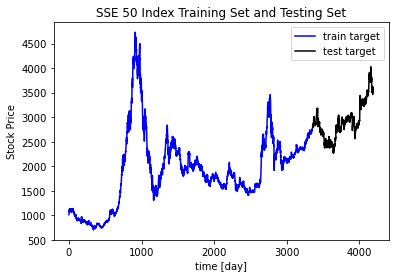

In [15]:
## show predictions
plt.figure(figsize=(6, 4))
plt.plot(np.arange(training_set.shape[0]), training_set, color='blue', label='train target')
plt.plot(np.arange(training_set.shape[0],training_set.shape[0]+testing_set.shape[0]),testing_set, color='black', label='test target')
plt.title('SSE 50 Index Training Set and Testing Set')
plt.xlabel('time [day]')
plt.ylabel('Stock Price')
plt.legend(loc='best');

In [14]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [15]:
#training data 处理
training_set_scaled1=training_set_scaled.flatten()#将数组降一维
training_set_scaled2=pd.DataFrame(columns=["closescale"],data=training_set_scaled1)#将array转为dataframe
training_set_scaled21=stk_data.loc[0:(len(training_set_scaled2)-1),'Date'].to_frame()#提取相应日期

In [16]:
training_set_scaled3= pd.concat([training_set_scaled21,training_set_scaled2],axis=1)

In [17]:
#testing data 处理
testing_set_scaled1=testing_set_scaled.flatten()#将数组降一维
testing_set_scaled2=pd.DataFrame(columns=["closescale"],data=testing_set_scaled1)#将array转为dataframe
testing_set_scaled21=stk_data.loc[len(training_set_scaled3):,'Date'].to_frame()#提取相应日期

In [18]:
testing_set_scaled21=pd.DataFrame(columns=["Date"],data=testing_set_scaled21.values)
testing_set_scaled3= pd.concat([testing_set_scaled21,testing_set_scaled2],axis=1)

# 利用相空间重构方法创建数据

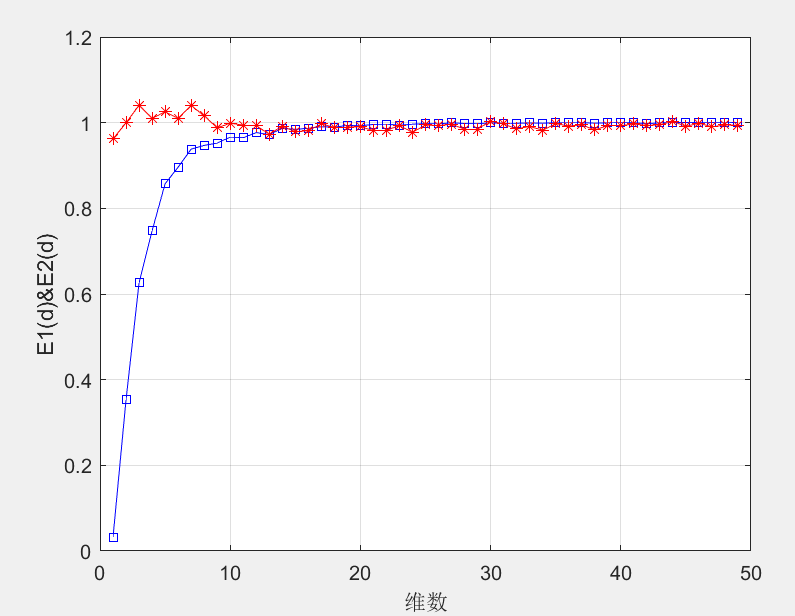

相空间重构数据

In [19]:
# data为时间序列，tau为重构的时延，d为重构的维数，T为直接预测的步数
def PhaSpaRecon(df,tau,d,T):
    data = np.array(df)[:, 1]
    date = np.array(df)[:, 0]
    lens = len(data)
    if (lens - T - (d-1) * tau) < 1:
        print("error: delay time or the embedding dimension is too large")
    else:
        Xn1 = np.zeros((d, lens-(d-1)*tau-1))
        for i in range(0, d):
            Xn1[i, :] = data[i*tau:i*tau+lens-(d-1)*tau-1]
            # for j in range(i*tau, i*tau+lens-(d-1)*tau-1):
            #     Xn[i, j] = data[j]
        Yn1 = data[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn1_date = date[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn = Yn1.reshape((len(Yn1), 1))
        Yn_date = Yn1_date.reshape((len(Yn1_date), 1))
        Yn = pd.DataFrame(Yn)
        Yn_date = pd.DataFrame(Yn_date)
        Y = pd.concat([Yn_date, Yn],axis=1)
        Xn = Xn1.T #reshape((Xn1.shape[1], Xn1.shape[0]))
        Xn = pd.DataFrame(Xn)
        X = pd.concat([Xn, Yn],axis=1)
    return Xn, Yn, Y, X

In [20]:
Xn, Yn,Y,X = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=1)

In [21]:
Xn

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-1.202782,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,...,-1.096278,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143
1,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,...,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851
2,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,...,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023
3,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,...,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524
4,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,-1.096278,...,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524,-1.055666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,1.024806,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,...,0.998027,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944
3329,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,...,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564
3330,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,...,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231
3331,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,0.983386,...,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231,1.105777


In [22]:
train= X.values
x_train1=train[:,0:23]
y_train1=train[:,23]

In [23]:
X1n, Y1n, Y1,X1 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=1)

In [24]:
test= X1.values
x_test1=test[:,0:23]
y_test1=test[:,23]

In [25]:
print('x_train1 shape:', x_train1.shape, '\n', 'x_test1 shape:', x_test1.shape, '\n', 'y_train1 shape:', y_train1.shape, '\n', 'y_test1 shape:', y_test1.shape)

x_train1 shape: (3333, 23) 
 x_test1 shape: (815, 23) 
 y_train1 shape: (3333,) 
 y_test1 shape: (815,)


In [26]:
ts_  = np.arange(0, y_train1.shape[0])
ts_ext_ = np.arange(y_train1.shape[0], y_train1.shape[0] + y_test1.shape[0])
ts_full_ = np.arange(0, y_train1.shape[0] + y_test1.shape[0])

In [27]:
# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

ts_ shape: (3333,) 
 ts_ext_ shape: (815,) 
 ts_full_ shape: (4148,)


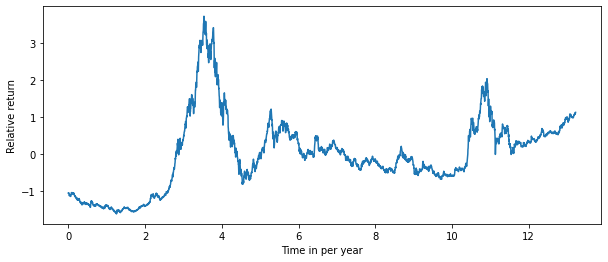

In [28]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train1)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [29]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train1.astype(np.float64)
ys_ = y_train1.astype(np.float64)
xs_ext_ = x_test1.astype(np.float64)
ys_ext_ = y_test1.astype(np.float64)#object转float
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext

In [30]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

In [31]:
X21n, Y21n,Y21,X21 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=2)
X22n, Y22n, Y22,X22 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=2)

In [32]:
train2= X21.values
train2=np.delete(train2,-1, axis=0)#减一是因为预测第二天T=2
x_train2=train2[:,0:23]
y_train2=train2[:,23]
test2= X22.values
test2=np.delete(test2,-1, axis=0)#减一是因为预测第二天T=2
x_test2=test2[:,0:23]
y_test2=test2[:,23]

In [33]:
X31n, Y31n,Y31,X31 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=3)
X32n, Y32n, Y32,X32 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=3)

In [34]:
train3= X31.values
train3=np.delete(train3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_train3=train3[:,0:23]
y_train3=train3[:,23]
test3= X32.values
test3=np.delete(test3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_test3=test3[:,0:23]
y_test3=test3[:,23]

In [35]:
X41n, Y41n,Y41,X41 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=4)
X42n, Y42n, Y42,X42 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=4)

In [36]:
train4= X41.values
train4=np.delete(train4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_train4=train4[:,0:23]
y_train4=train4[:,23]
test4= X42.values
test4=np.delete(test4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_test4=test4[:,0:23]
y_test4=test4[:,23]

# SDE Definition

In [37]:
sequence_length: int = 23
alpha, beta = 1.2, 0

In [38]:
__all__ = ['SDENet1']

class Drift1(nn.Module):
    def __init__(self):
        super(Drift1, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion1(nn.Module):
    def __init__(self):
        super(Diffusion1, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet1(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet1, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift1()
        self.diffusion = Diffusion1()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out1=out
            Drift1=self.drift(t, out)
            return Drift1,Out1
            
        else:
            t = 0
            final_out1 = self.diffusion(t, out.detach())  
            return final_out1

def test():
    model = SDENet1(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model1 = test()
    num_params = count_parameters(model1)
    print(num_params)

3605


In [39]:
__all__ = ['SDENet2']

class Drift2(nn.Module):
    def __init__(self):
        super(Drift2, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion2(nn.Module):
    def __init__(self):
        super(Diffusion2, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet2(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet2, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift2()
        self.diffusion = Diffusion2()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out1=Out1.detach().numpy()#减一是因为预测后一天T=1和T=2差一天
#        Out1=np.delete(Out1,-1, axis=0)
#        Out1=torch.from_numpy(Out1)
#        out=torch.cat((out,Out1), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out2=out
            Drift2=self.drift(t, out)
            return Drift2,Out2
            
        else:
            t = 0
            final_out2 = self.diffusion(t, out.detach())  
            return final_out2

def test():
    model2 = SDENet2(layer_depth=6)
    return model2  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model2 = test()
    num_params = count_parameters(model2)
    print(num_params)

3605


In [40]:
__all__ = ['SDENet3']

class Drift3(nn.Module):
    def __init__(self):
        super(Drift3, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion3(nn.Module):
    def __init__(self):
        super(Diffusion3, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet3(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet3, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift3()
        self.diffusion = Diffusion3()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out2=Out2.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out2=np.delete(Out2,-1, axis=0)
#        Out2=torch.from_numpy(Out2)
#        out=torch.cat((out,Out2), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out3=out
            Drift3=self.drift(t, out)
            return Drift3,Out3
            
        else:
            t = 0
            final_out3 = self.diffusion(t, out.detach())  
            return final_out3

def test():
    model3 = SDENet3(layer_depth=6)
    return model3  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model3 = test()
    num_params = count_parameters(model3)
    print(num_params)

3605


In [41]:
__all__ = ['SDENet4']

class Drift4(nn.Module):
    def __init__(self):
        super(Drift4, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion4(nn.Module):
    def __init__(self):
        super(Diffusion4, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet4(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet4, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift4()
        self.diffusion = Diffusion4()
#        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(sequence_length, 8))#将激活层与线性层连接一起
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out3=Out3.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out3=np.delete(Out3,-1, axis=0)
#        Out3=torch.from_numpy(Out3)
#        out=torch.cat((out,Out3), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out4=out
            Drift4=self.drift(t, out)
#            final_out4 = self.fc_layers(out) 
#            mean41 = final_out[:,0]
#            mean42 = final_out[:,1]
#            mean43 = final_out[:,2]
#            mean44 = final_out[:,3]
#            sigma41 = F.softplus(final_out[:,5])+1e-3
#            sigma42 = F.softplus(final_out[:,6])+1e-3
#            sigma43 = F.softplus(final_out[:,7])+1e-3
#            sigma44 = F.softplus(final_out[:,8])+1e-3
            return Drift4,Out4
            
        else:
            t = 0
            final_out4 = self.diffusion(t, out.detach())  
            return final_out4

def test():
    model4 = SDENet4(layer_depth=6)
    return model4  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model4 = test()
    num_params = count_parameters(model4)
    print(num_params)

3605


# SDE_Regression

DataSet loading

In [42]:
X_train1 = torch.from_numpy(x_train1.astype(np.float64)).float()
X_test1 = torch.from_numpy(x_test1.astype(np.float64)).float()
Y_train1 = torch.from_numpy(y_train1.astype(np.float64)).float()
Y_test1 = torch.from_numpy(y_test1.astype(np.float64)).float()
print('X_train1.shape:', X_train1.shape, '\nX_test1.shape:', X_test1.shape, '\nY_train1.shape:', Y_train1.shape, '\nY_test1.shape:', Y_test1.shape)

X_train1.shape: torch.Size([3333, 23]) 
X_test1.shape: torch.Size([815, 23]) 
Y_train1.shape: torch.Size([3333]) 
Y_test1.shape: torch.Size([815])


In [43]:
X_train2 = torch.from_numpy(x_train2.astype(np.float64)).float()
X_test2 = torch.from_numpy(x_test2.astype(np.float64)).float()
Y_train2 = torch.from_numpy(y_train2.astype(np.float64)).float()
Y_test2 = torch.from_numpy(y_test2.astype(np.float64)).float()
print('X_train2.shape:', X_train2.shape, '\nX_test2.shape:', X_test2.shape, '\nY_train2.shape:', Y_train2.shape, '\nY_test2.shape:', Y_test2.shape)

X_train2.shape: torch.Size([3332, 23]) 
X_test2.shape: torch.Size([814, 23]) 
Y_train2.shape: torch.Size([3332]) 
Y_test2.shape: torch.Size([814])


In [44]:
X_train3 = torch.from_numpy(x_train3.astype(np.float64)).float()
X_test3 = torch.from_numpy(x_test3.astype(np.float64)).float()
Y_train3 = torch.from_numpy(y_train3.astype(np.float64)).float()
Y_test3 = torch.from_numpy(y_test3.astype(np.float64)).float()
print('X_train3.shape:', X_train3.shape, '\nX_test3.shape:', X_test3.shape, '\nY_train3.shape:', Y_train3.shape, '\nY_test3.shape:', Y_test3.shape)

X_train3.shape: torch.Size([3331, 23]) 
X_test3.shape: torch.Size([813, 23]) 
Y_train3.shape: torch.Size([3331]) 
Y_test3.shape: torch.Size([813])


In [45]:
X_train4 = torch.from_numpy(x_train4.astype(np.float64)).float()
X_test4 = torch.from_numpy(x_test4.astype(np.float64)).float()
Y_train4 = torch.from_numpy(y_train4.astype(np.float64)).float()
Y_test4 = torch.from_numpy(y_test4.astype(np.float64)).float()
print('X_train4.shape:', X_train4.shape, '\nX_test4.shape:', X_test4.shape, '\nY_train4.shape:', Y_train4.shape, '\nY_test4.shape:', Y_test4.shape)

X_train4.shape: torch.Size([3330, 23]) 
X_test4.shape: torch.Size([812, 23]) 
Y_train4.shape: torch.Size([3330]) 
Y_test4.shape: torch.Size([812])


Arguments

In [46]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=100, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size1 = y_train1.squeeze().shape[0]
batch_size2 = y_train2.squeeze().shape[0]
batch_size3 = y_train3.squeeze().shape[0]
batch_size4 = y_train4.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=100, gpu=0, lr=0.0001, lr2=0.01, seed=0)


# Model

In [47]:
from sklearn.metrics import mean_squared_error
net1 = SDENet1(25)
net1 = net1.to(device)
net2 = SDENet2(25)
net2 = net2.to(device)
net3 = SDENet3(25)
net3 = net3.to(device)
net4 = SDENet4(25)
net4 = net4.to(device)
attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
criterion = nn.BCELoss()

real_label = 0
fake_label = 1
optimizer_F = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()},{'params': net2.downsampling_layers.parameters()},{'params': net2.drift.parameters()},{'params': net3.downsampling_layers.parameters()},{'params': net3.drift.parameters()} ,{'params': net4.downsampling_layers.parameters()},{'params': net4.drift.parameters()},{'params': attention.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F1 = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F2 = optim.SGD([ {'params': net2.downsampling_layers.parameters()}, {'params': net2.drift.parameters}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F3 = optim.SGD([ {'params': net3.downsampling_layers.parameters()}, {'params': net3.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F4 = optim.SGD([ {'params': net4.downsampling_layers.parameters()}, {'params': net4.drift.parameters()},{'params': net4.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
optimizer_G = optim.SGD([ {'params': net1.diffusion.parameters()},{'params': net2.diffusion.parameters()},{'params': net3.diffusion.parameters()},{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G1 = optim.SGD([ {'params': net1.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G2 = optim.SGD([ {'params': net2.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G3 = optim.SGD([{'params': net3.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G4 = optim.SGD([{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net1.train()
    net2.train()
    net3.train()
    net4.train()
#    if epoch == 0:
#        net.sigma = 0.1
#    if epoch == 30:
#        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs1, targets1 = X_train1, Y_train1[0:-3]
        inputs2, targets2 = X_train2, Y_train2[0:-2]
        inputs3, targets3 = X_train3, Y_train3[0:-1]
        inputs4, targets4 = X_train4, Y_train4
        # print(inputs.shape)
        inputs1, targets1 = inputs1.to(device), targets1.to(device)
        #optimizer_F1.zero_grad()
        inputs2, targets2 = inputs2.to(device), targets2.to(device)
        #optimizer_F2.zero_grad()
        inputs3, targets3 = inputs3.to(device), targets3.to(device)
        #optimizer_F3.zero_grad()
        inputs4, targets4 = inputs4.to(device), targets4.to(device)
        #optimizer_F4.zero_grad()
        optimizer_F.zero_grad()
        Drift1,Out1 = net1(inputs1)
        Drift2,Out2 = net2(inputs2)
        Drift3,Out3 = net3(inputs3)
        Drift4,Out4 = net4(inputs4)
        #print(Drift)
        #print(Out4.shape)
        Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
        #attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
        final_out=attention(Out)
        mean41 = final_out[:,0]
        mean42 = final_out[:,1]
        mean43 = final_out[:,2]
        mean44 = final_out[:,3]
        sigma41 = F.softplus(final_out[:,4])+1e-3
        sigma42 = F.softplus(final_out[:,5])+1e-3
        sigma43 = F.softplus(final_out[:,6])+1e-3
        sigma44 = F.softplus(final_out[:,7])+1e-3       
        loss1 = nll_loss(targets1, mean41, sigma41)
        loss2 = nll_loss(targets2, mean42, sigma42)
        loss3 = nll_loss(targets3, mean43, sigma43)
        loss4 = nll_loss(targets4, mean44, sigma44)
        loss=loss1+loss2+loss3+loss4
        loss.backward()
        optimizer_F.step()
        train_loss += loss.item()
        #loss1.backward()
        #nn.utils.clip_grad_norm_(net1.parameters(), 100.)
        #optimizer_F1.step()
        #loss2 = nll_loss(targets2, mean42, sigma42)
        #loss2.backward()
        #nn.utils.clip_grad_norm_(net2.parameters(), 100.)
        #optimizer_F2.step()
        #loss3 = nll_loss(targets3, mean43, sigma43)
        #loss3.backward()
        #nn.utils.clip_grad_norm_(net3.parameters(), 100.)
        #optimizer_F3.step()
        #loss4 = nll_loss(targets4, mean44, sigma44)
        # loss = criterion(targets, mean)
        #loss4.backward()
        #nn.utils.clip_grad_norm_(net4.parameters(), 100.)
        #optimizer_F4.step()
        

        label1 = torch.full((batch_size1,1), real_label, device=device)
        label2 = torch.full((batch_size2,1), real_label, device=device)
        label3 = torch.full((batch_size3,1), real_label, device=device)
        label4 = torch.full((batch_size4,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in1 = net1(inputs1, training_diffusion=True)
        predict_in2 = net2(inputs2, training_diffusion=True)
        predict_in3 = net3(inputs3, training_diffusion=True)
        predict_in4 = net4(inputs4, training_diffusion=True)
        loss_in = criterion(predict_in1, label1.float())+criterion(predict_in2, label2.float())+criterion(predict_in3, label3.float())+criterion(predict_in4, label4.float())
        loss_in.backward()
        label1.fill_(fake_label)
        label2.fill_(fake_label)
        label3.fill_(fake_label)
        label4.fill_(fake_label)

        inputs_out1 = 2 * torch.randn(batch_size1, sequence_length, device = device) + inputs1
        inputs_out2 = 2 * torch.randn(batch_size2, sequence_length, device = device) + inputs2
        inputs_out3 = 2 * torch.randn(batch_size3, sequence_length, device = device) + inputs3
        inputs_out4 = 2 * torch.randn(batch_size4, sequence_length, device = device) + inputs4
        predict_out1 = net1(inputs_out1, training_diffusion=True)
        predict_out2 = net2(inputs_out2, training_diffusion=True)
        predict_out3 = net3(inputs_out3, training_diffusion=True)
        predict_out4 = net4(inputs_out4, training_diffusion=True)
        loss_out = criterion(predict_out1, label1.float())+criterion(predict_out2, label2.float())+criterion(predict_out3, label3.float())+criterion(predict_out4, label4.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
#    plt.figure(figsize = (5, 4))
#    plt.subplot(221)
    plt.figure(1,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean41.cpu().detach().numpy()),label = 'prediction(t+1)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean41.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), scaler.inverse_transform(mean41.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(222)
    plt.figure(2,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean42.cpu().detach().numpy()),label = 'prediction(t+2)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean42.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), scaler.inverse_transform(mean42.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)    
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(223)
    plt.figure(3,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean43.cpu().detach().numpy()),label = 'prediction(t+3)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean43.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), scaler.inverse_transform(mean43.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(224)
    plt.figure(4,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean44.cpu().detach().numpy()),label = 'prediction(t+4)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean44.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), scaler.inverse_transform(mean44.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
    plt.ylim(700,5000)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.legend()
    plt.show()
    loss11=mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy())
    loss22=mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy())
    loss33=mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy())
    loss44=mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    #return mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy()),mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy()),mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy()),mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    #return mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    return loss11,loss22,loss33,loss44

In [48]:
# Testing
def test(epoch):
    net1.eval()
    net2.eval()
    net3.eval()
    net4.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs1, targets1 = X_test1, Y_test1[0:-3]
            inputs2, targets2 = X_test2, Y_test2[0:-2]
            inputs3, targets3 = X_test3, Y_test3[0:-1]
            inputs4, targets4 = X_test4, Y_test4
            inputs1, targets1 = inputs1.to(device), targets1.to(device)
            inputs2, targets2 = inputs2.to(device), targets2.to(device)
            inputs3, targets3 = inputs3.to(device), targets3.to(device)
            inputs4, targets4 = inputs4.to(device), targets4.to(device)
            current_mean1 = 0
            current_mean2 = 0
            current_mean3 = 0
            current_mean4 = 0
            current_sigma1 = 0
            current_sigma2 = 0
            current_sigma3 = 0
            current_sigma4 = 0
            for i in range(1):
                #mean, sigma ,Drift= net(inputs)
                Drift1,Out1 = net1(inputs1)
                Drift2,Out2 = net2(inputs2)
                Drift3,Out3 = net3(inputs3)
                Drift4,Out4 = net4(inputs4)
                Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
                final_out=attention(Out)
                mean41 = final_out[:,0]
                mean42 = final_out[:,1]
                mean43 = final_out[:,2]
                mean44 = final_out[:,3]
                sigma41 = F.softplus(final_out[:,4])+1e-3
                sigma42 = F.softplus(final_out[:,5])+1e-3
                sigma43 = F.softplus(final_out[:,6])+1e-3
                sigma44 = F.softplus(final_out[:,7])+1e-3 
                current_mean1 = current_mean1 + mean41
                current_mean2 = current_mean2 + mean42
                current_mean3 = current_mean3 + mean43
                current_mean4 = current_mean4 + mean44
                current_sigma1= current_sigma1+ sigma41
                current_sigma2= current_sigma2+ sigma42
                current_sigma3= current_sigma3+ sigma43
                current_sigma4= current_sigma4+ sigma44
            current_mean1 = current_mean1/1
            current_mean2 = current_mean2/1
            current_mean3 = current_mean3/1
            current_mean4 = current_mean4/1
            current_sigma1 = current_sigma1/1
            current_sigma2 = current_sigma2/1
            current_sigma3 = current_sigma3/1
            current_sigma4 = current_sigma4/1            
            loss1 = mse(targets1, current_mean1)
            loss2 = mse(targets2, current_mean2)
            loss3 = mse(targets3, current_mean3)
            loss4 = mse(targets4, current_mean4)
            loss=loss1+loss2+loss3+loss4
#            plt.figure(figsize = (8, 4))
#            plt.subplot(221)
            plt.figure(1,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean1.cpu().detach().numpy()),label = 'prediction(t+1)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean1.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean1.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(222)
            plt.figure(2,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean2.cpu().detach().numpy()),label = 'prediction(t+2)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean2.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean2.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(223)
            plt.figure(3,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean3.cpu().detach().numpy()),label = 'prediction(t+3)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean3.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean3.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(224)
            plt.figure(4,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean4.cpu().detach().numpy()),label = 'prediction(t+4)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean4.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean4.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
            plt.ylim(2000,4800)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.legend()
            plt.show()
            test_loss += loss.item()
    
            loss11 = mean_squared_error(Y_test1.numpy()[0:-3], current_mean1.cpu().detach().numpy()) 
            loss22 = mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy())
            loss33 = mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())
            loss44 = mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return loss11,loss22,loss33,loss44
    #return loss11, current_mean1.cpu().detach().numpy()), mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy()),mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy()),mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    #return mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())

# Run Epochs


Epoch: 1


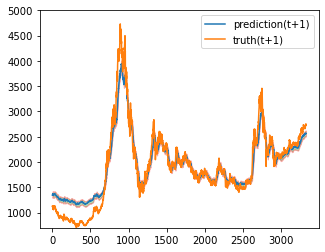

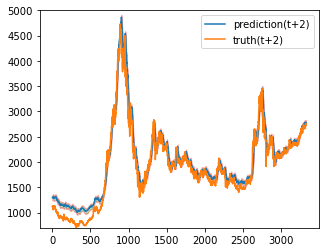

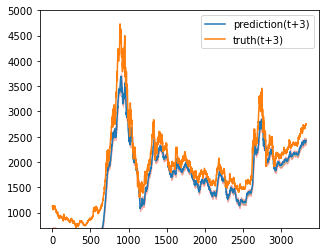

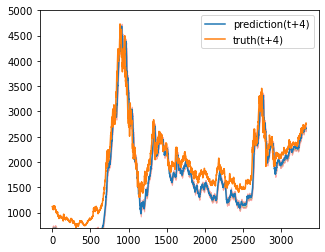

Train epoch:1 	Loss: 2.437301| Loss_in: 2.381054| Loss_out: 1.343649


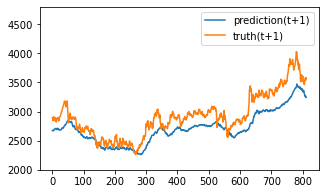

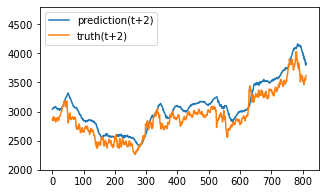

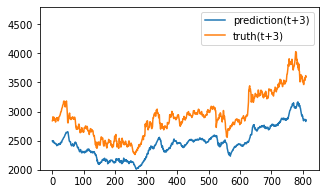

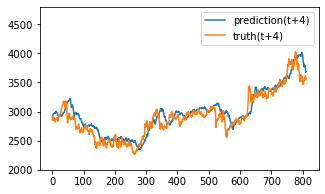

Test epoch:1 	Loss: 0.783923

Epoch: 2


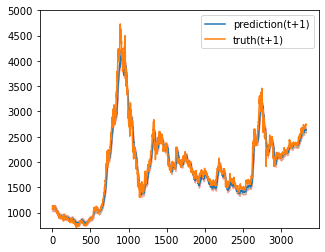

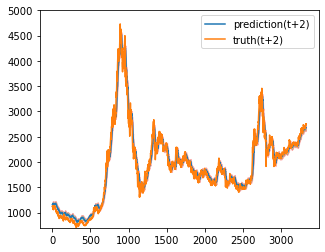

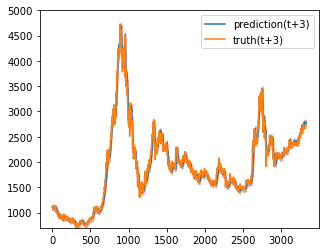

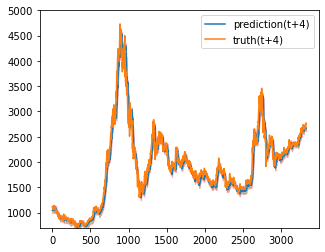

Train epoch:2 	Loss: -1.373109| Loss_in: 0.834465| Loss_out: 0.417660


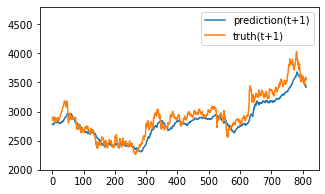

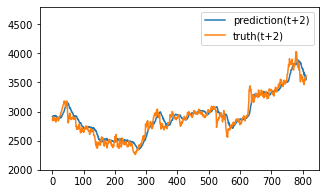

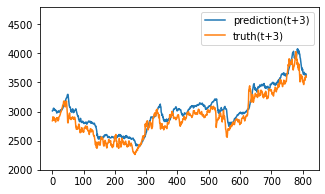

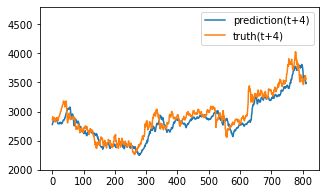

Test epoch:2 	Loss: 0.368655

Epoch: 3


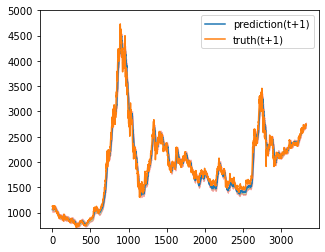

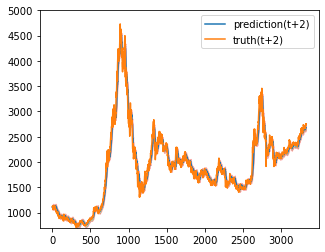

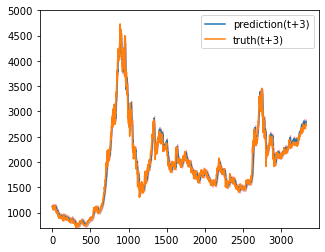

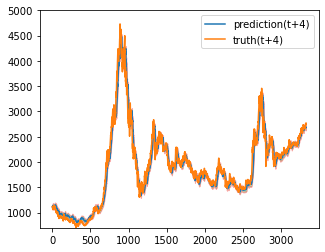

Train epoch:3 	Loss: -4.848663| Loss_in: 0.401518| Loss_out: 0.209297


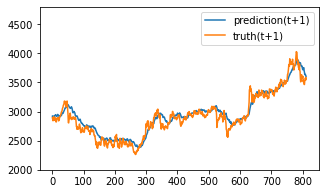

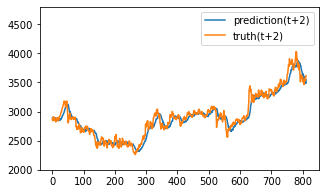

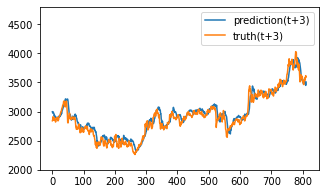

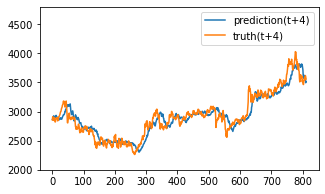

Test epoch:3 	Loss: 0.279072

Epoch: 4


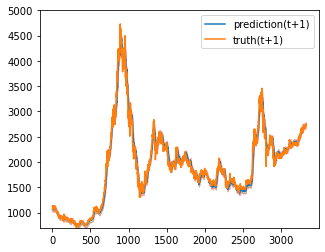

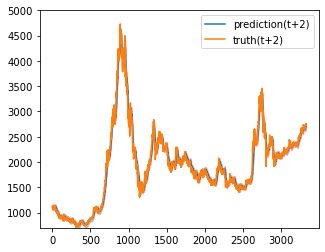

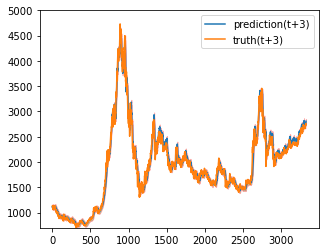

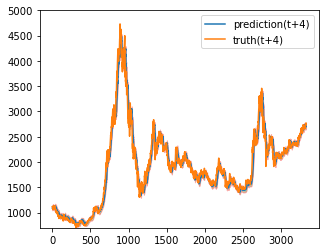

Train epoch:4 	Loss: -8.031014| Loss_in: 0.249542| Loss_out: 0.139870


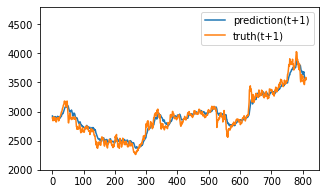

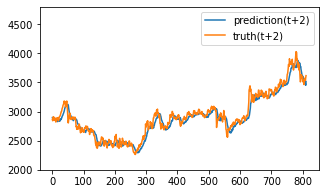

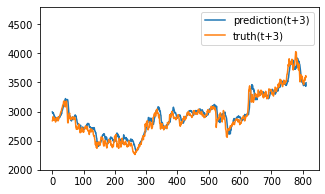

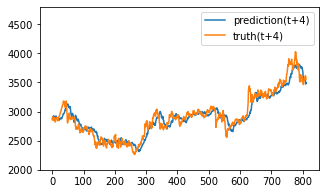

Test epoch:4 	Loss: 0.258111

Epoch: 5


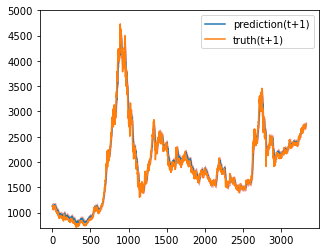

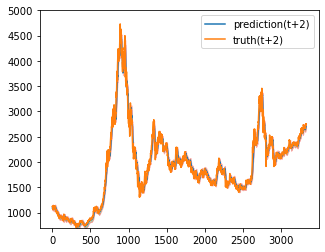

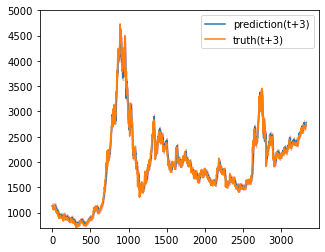

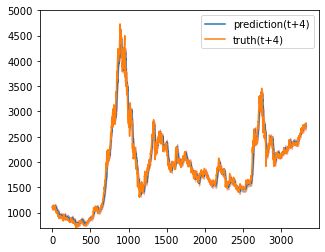

Train epoch:5 	Loss: -10.005210| Loss_in: 0.176812| Loss_out: 0.103257


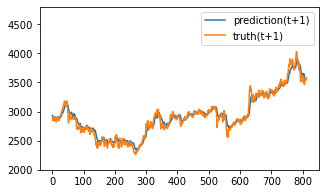

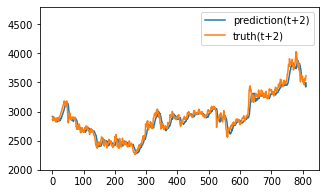

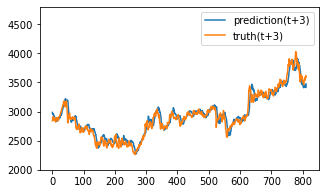

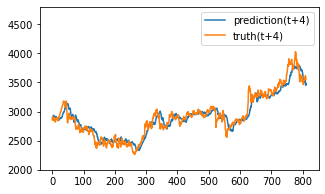

Test epoch:5 	Loss: 0.240854

Epoch: 6


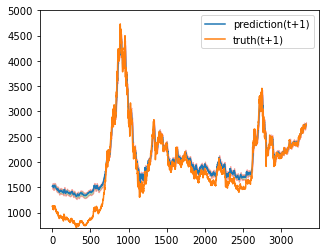

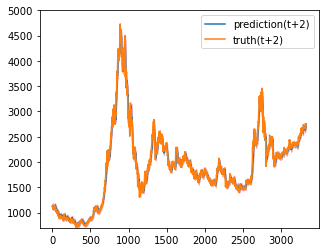

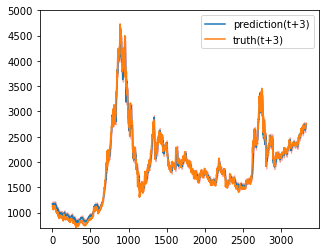

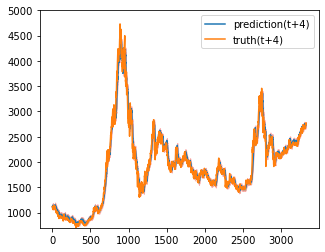

Train epoch:6 	Loss: -9.723265| Loss_in: 0.144248| Loss_out: 0.082103


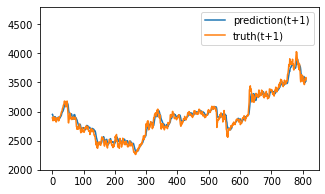

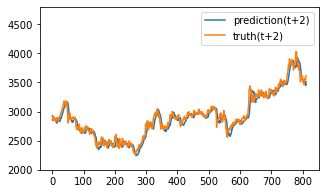

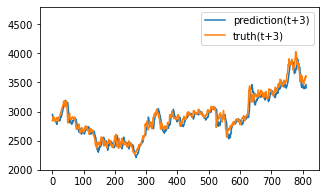

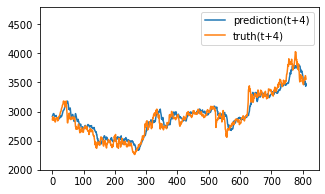

Test epoch:6 	Loss: 0.234142

Epoch: 7


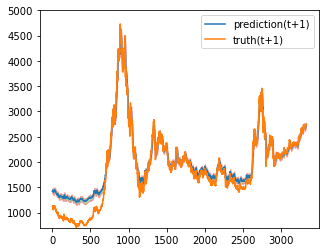

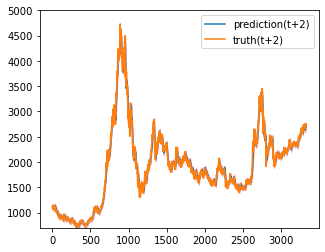

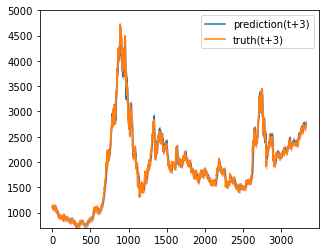

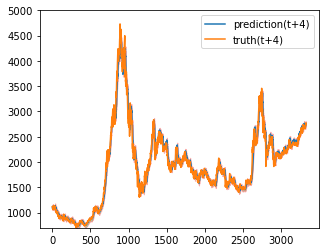

Train epoch:7 	Loss: -9.524969| Loss_in: 0.114888| Loss_out: 0.078394


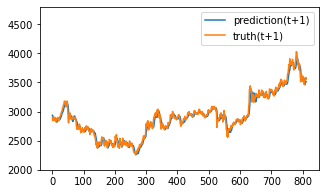

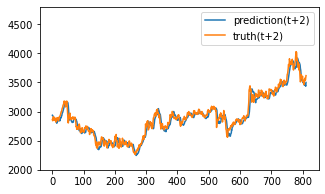

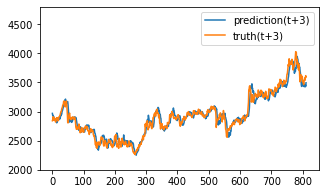

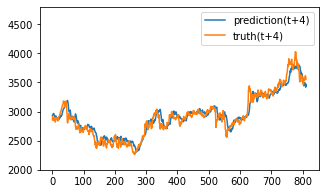

Test epoch:7 	Loss: 0.222886

Epoch: 8


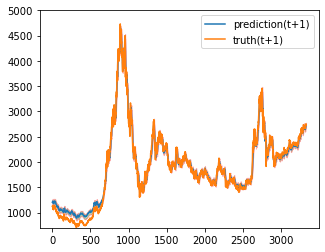

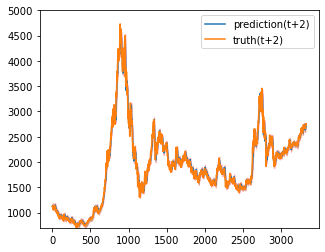

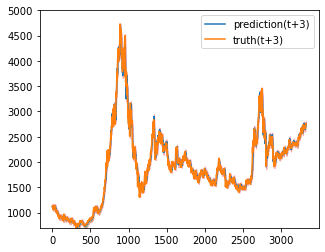

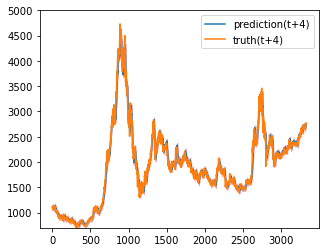

Train epoch:8 	Loss: -10.720060| Loss_in: 0.089811| Loss_out: 0.063150


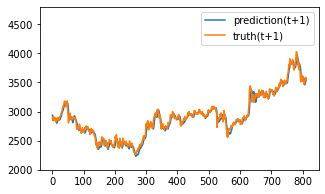

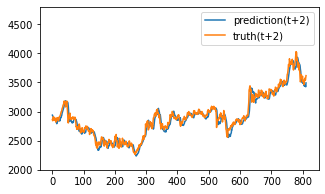

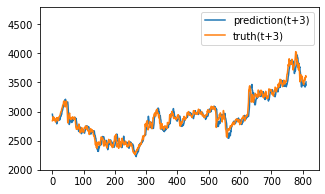

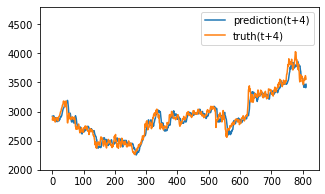

Test epoch:8 	Loss: 0.214821

Epoch: 9


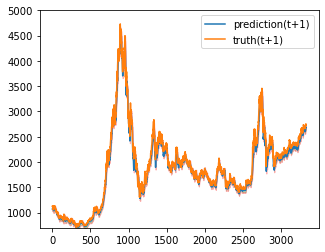

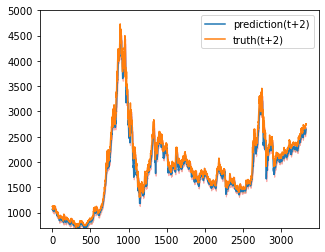

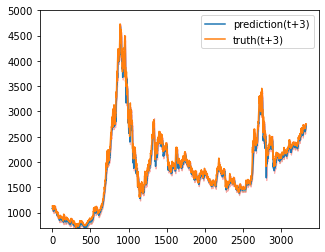

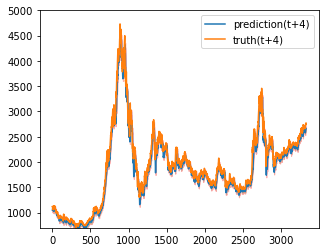

Train epoch:9 	Loss: -12.985397| Loss_in: 0.075695| Loss_out: 0.054186


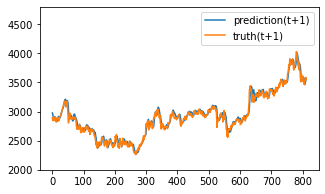

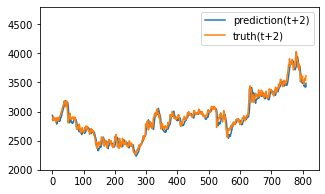

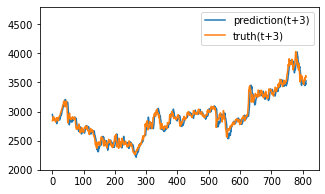

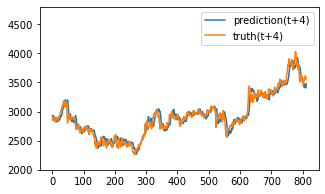

Test epoch:9 	Loss: 0.211248

Epoch: 10


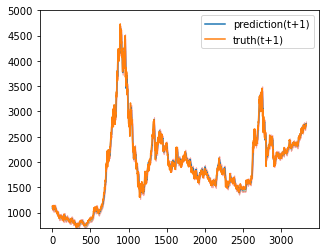

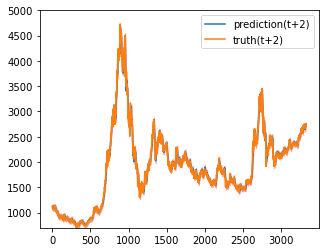

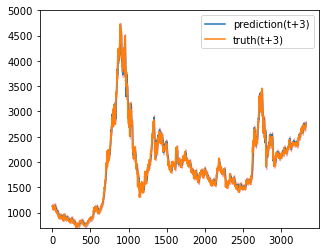

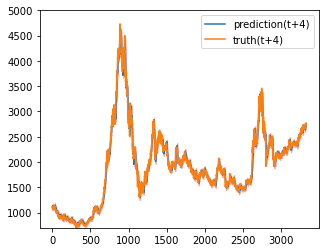

Train epoch:10 	Loss: -12.632473| Loss_in: 0.074440| Loss_out: 0.050650


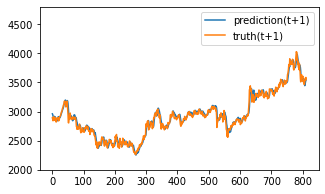

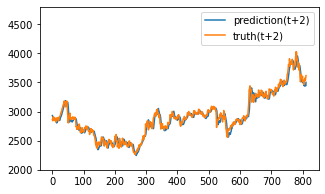

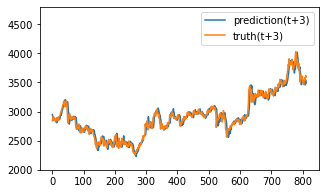

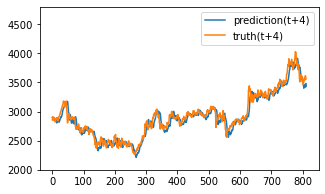

Test epoch:10 	Loss: 0.204798

Epoch: 11


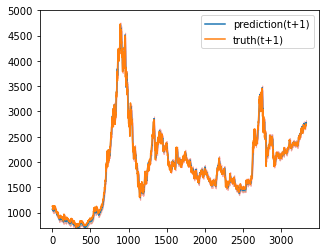

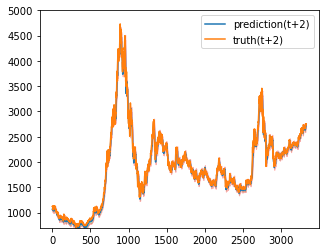

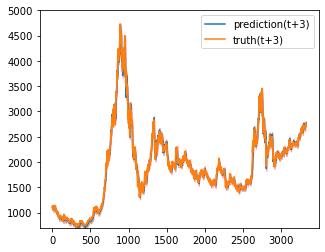

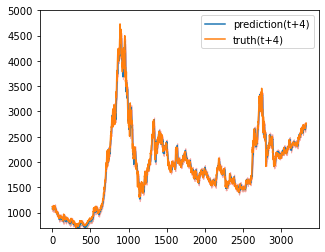

Train epoch:11 	Loss: -15.387086| Loss_in: 0.057696| Loss_out: 0.046313


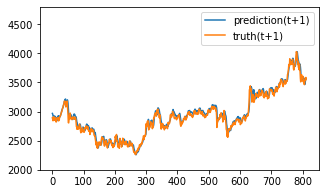

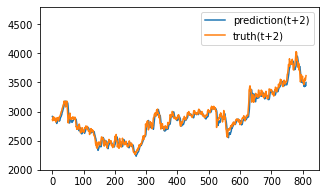

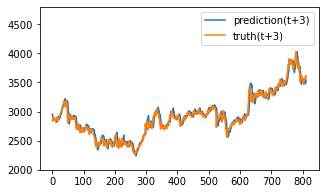

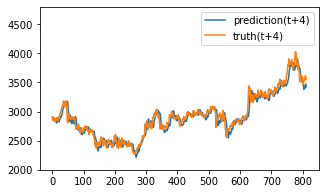

Test epoch:11 	Loss: 0.203639

Epoch: 12


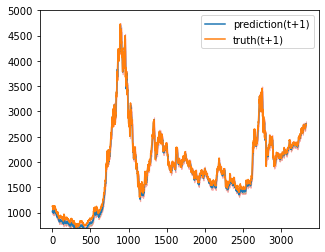

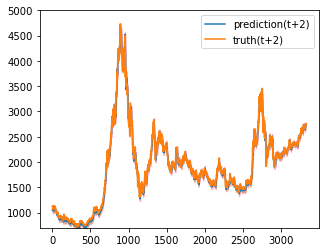

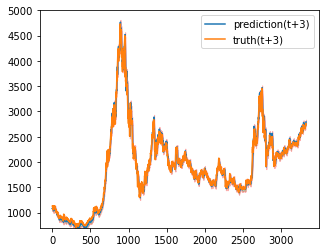

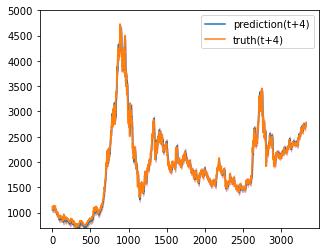

Train epoch:12 	Loss: -16.052261| Loss_in: 0.051580| Loss_out: 0.040114


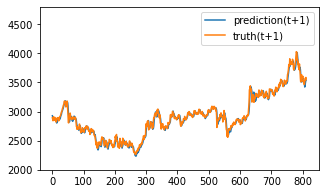

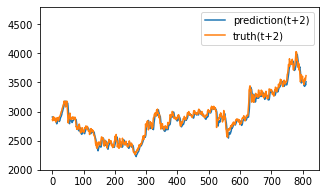

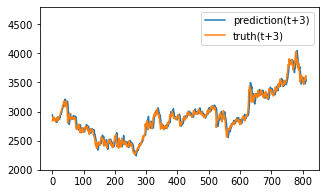

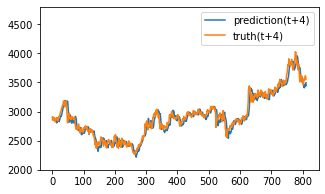

Test epoch:12 	Loss: 0.195729

Epoch: 13


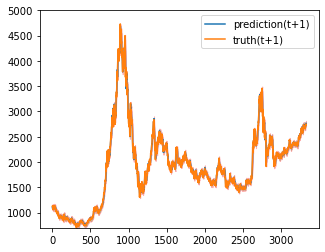

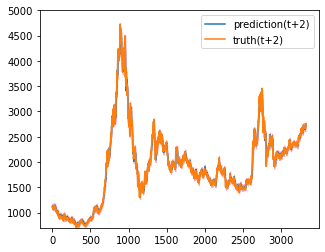

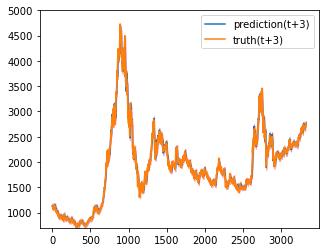

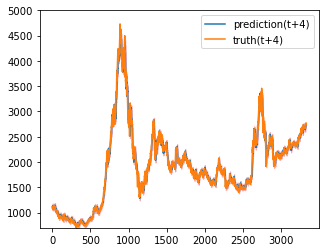

Train epoch:13 	Loss: -16.152624| Loss_in: 0.049922| Loss_out: 0.036971


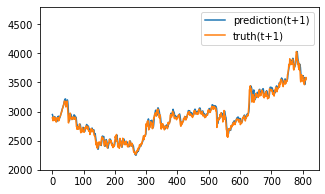

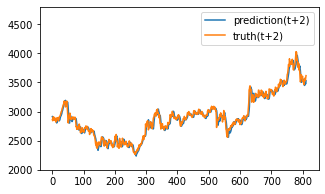

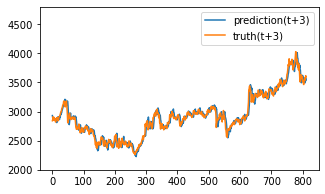

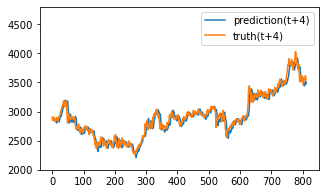

Test epoch:13 	Loss: 0.190998

Epoch: 14


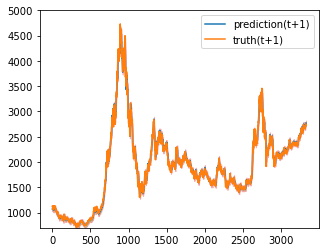

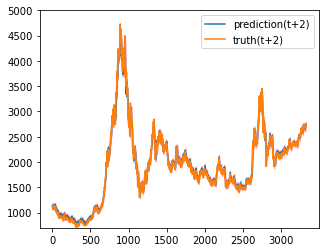

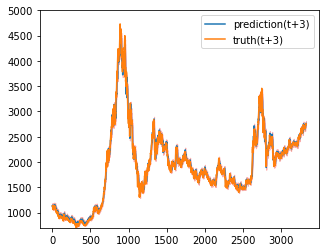

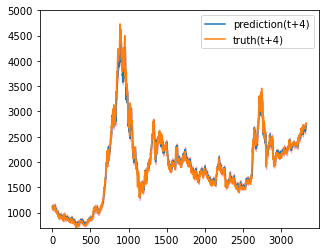

Train epoch:14 	Loss: -16.033591| Loss_in: 0.043926| Loss_out: 0.034339


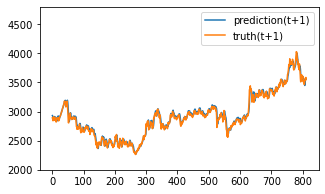

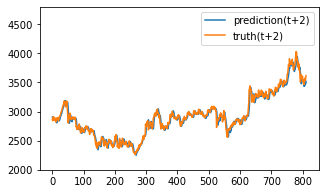

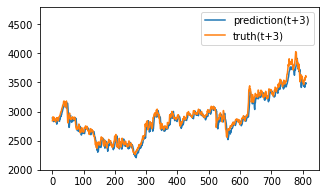

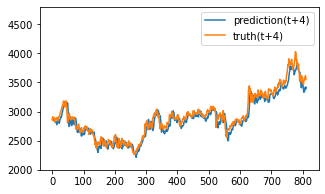

Test epoch:14 	Loss: 0.204094

Epoch: 15


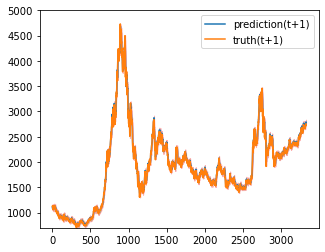

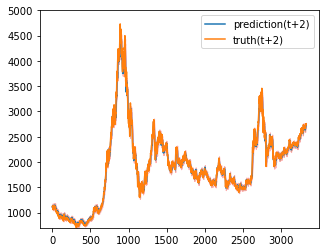

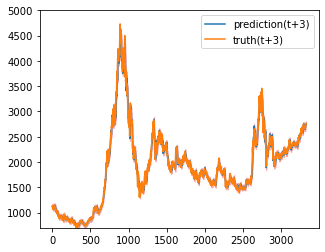

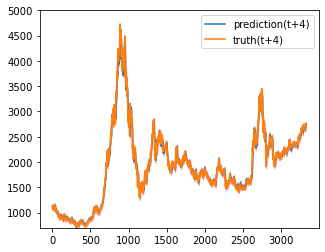

Train epoch:15 	Loss: -16.231989| Loss_in: 0.042021| Loss_out: 0.033246


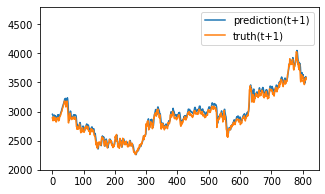

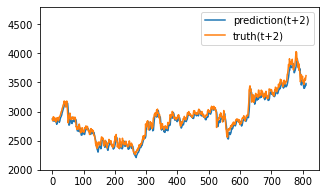

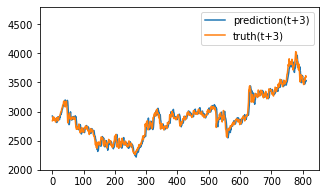

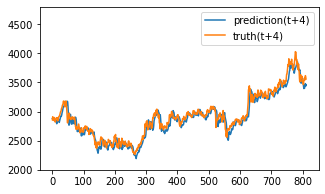

Test epoch:15 	Loss: 0.205436

Epoch: 16


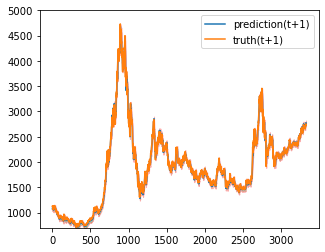

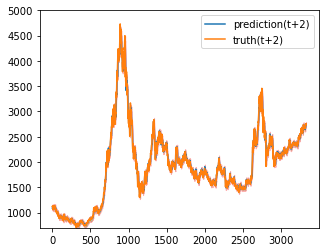

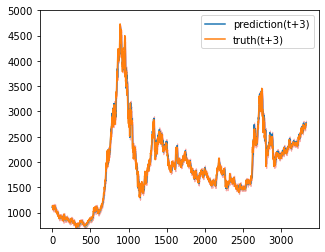

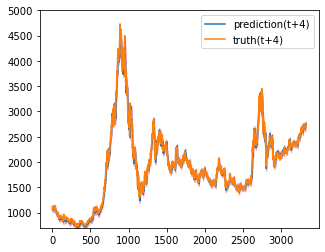

Train epoch:16 	Loss: -17.027297| Loss_in: 0.036465| Loss_out: 0.030301


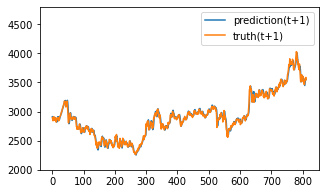

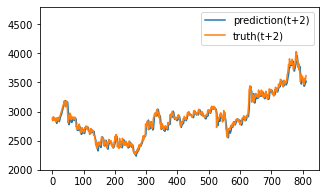

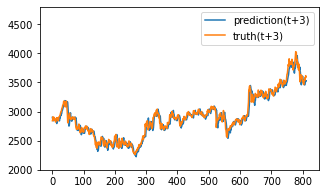

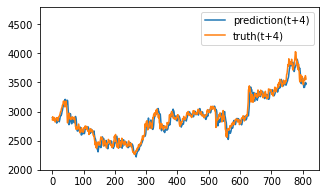

Test epoch:16 	Loss: 0.186950

Epoch: 17


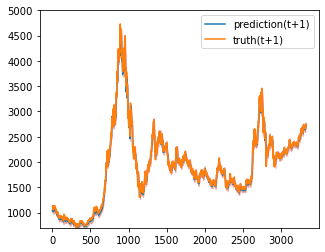

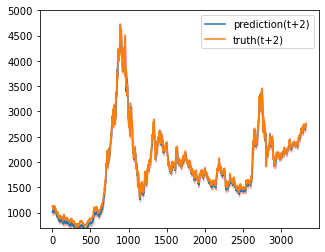

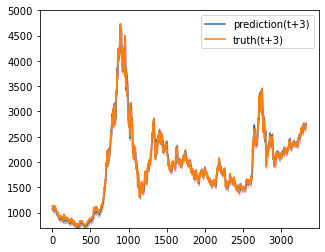

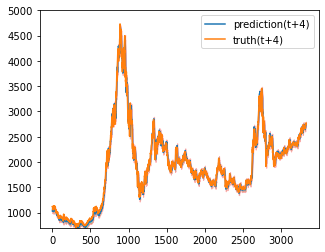

Train epoch:17 	Loss: -16.608936| Loss_in: 0.034845| Loss_out: 0.027563


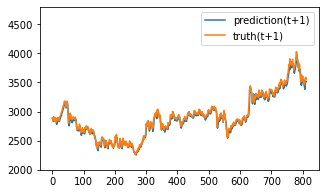

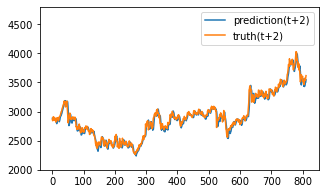

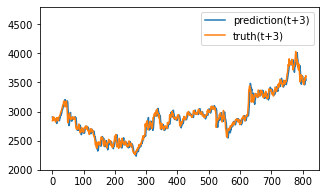

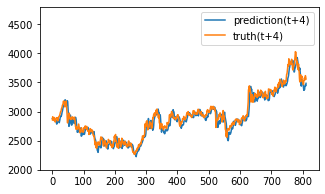

Test epoch:17 	Loss: 0.193353

Epoch: 18


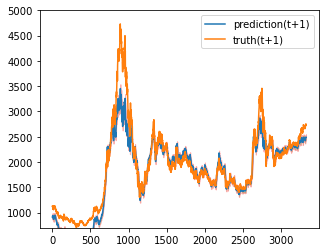

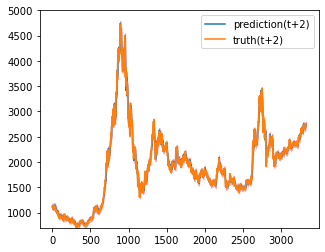

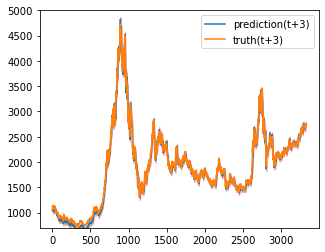

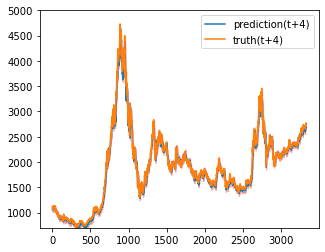

Train epoch:18 	Loss: -5.920007| Loss_in: 0.250784| Loss_out: 0.108763


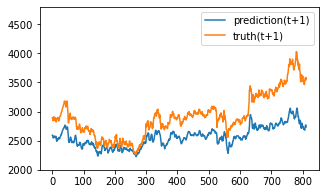

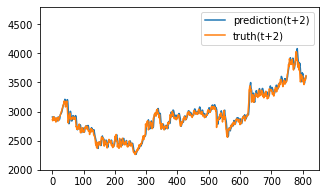

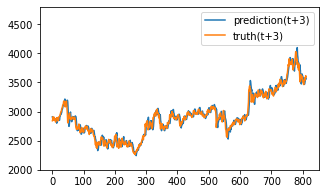

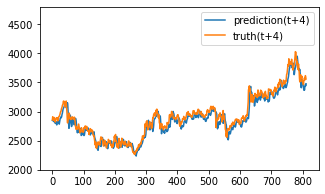

Test epoch:18 	Loss: 0.576801

Epoch: 19


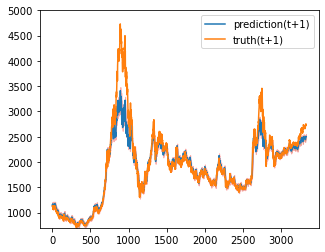

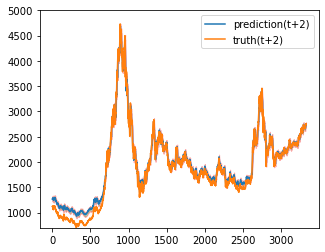

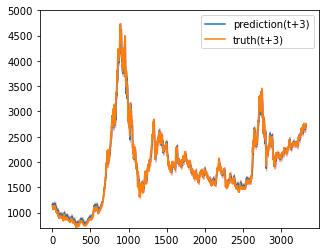

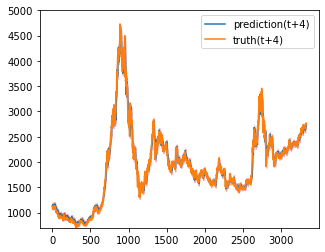

Train epoch:19 	Loss: -11.123446| Loss_in: 0.038153| Loss_out: 0.046519


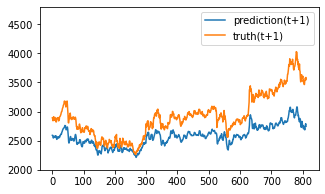

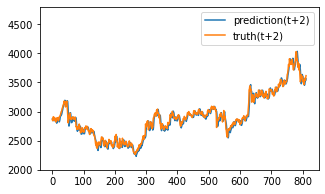

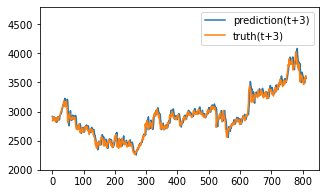

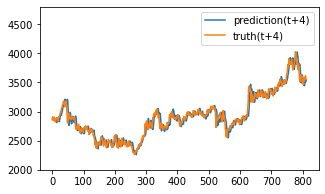

Test epoch:19 	Loss: 0.561190

Epoch: 20


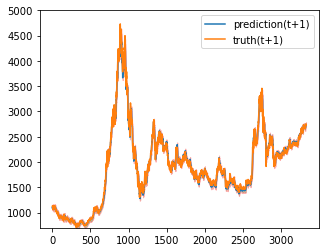

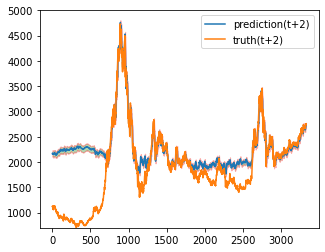

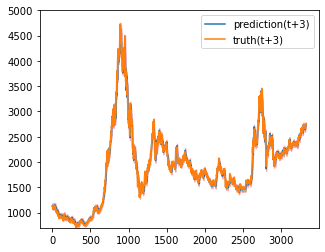

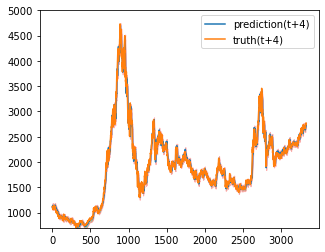

Train epoch:20 	Loss: -9.352446| Loss_in: 0.053774| Loss_out: 0.039942


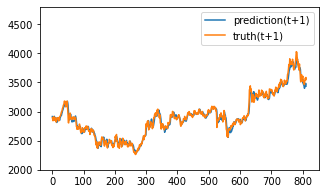

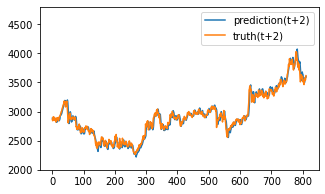

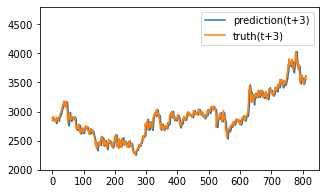

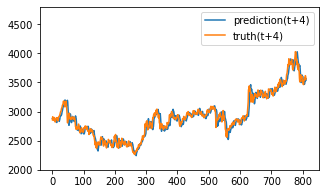

Test epoch:20 	Loss: 0.186570

Epoch: 21


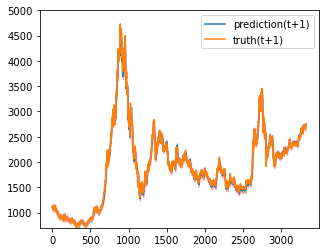

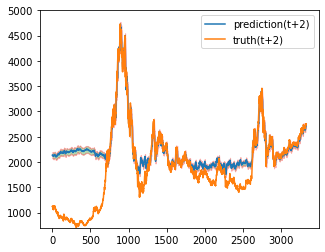

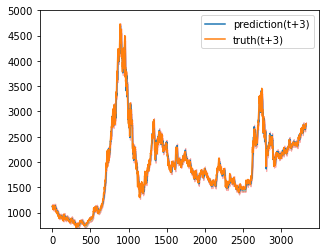

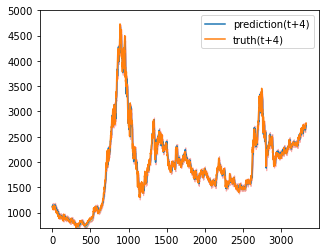

Train epoch:21 	Loss: -12.243331| Loss_in: 0.030780| Loss_out: 0.034388


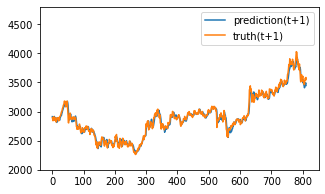

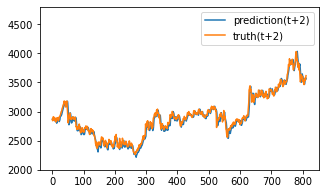

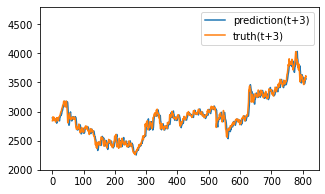

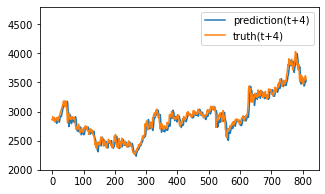

Test epoch:21 	Loss: 0.187451

Epoch: 22


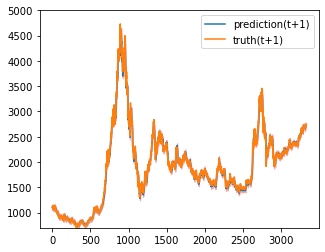

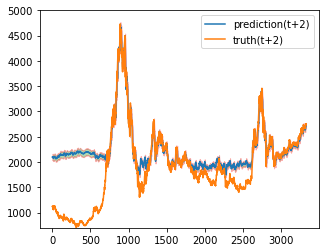

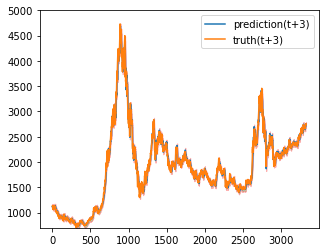

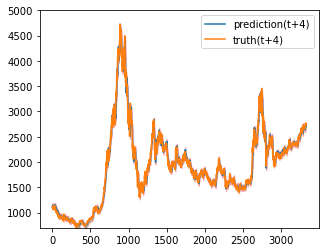

Train epoch:22 	Loss: -12.585331| Loss_in: 0.028547| Loss_out: 0.027793


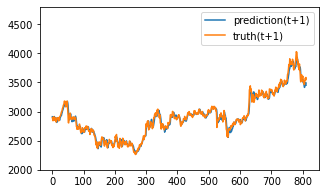

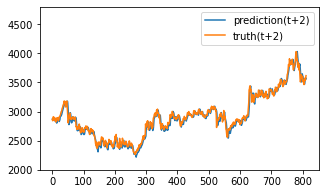

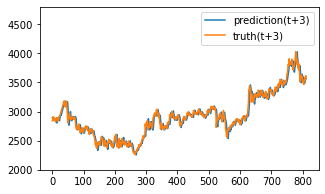

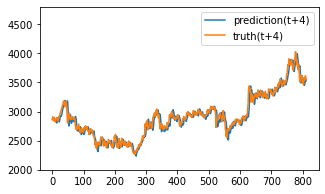

Test epoch:22 	Loss: 0.185536

Epoch: 23


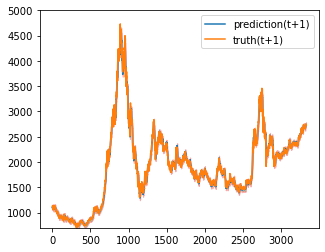

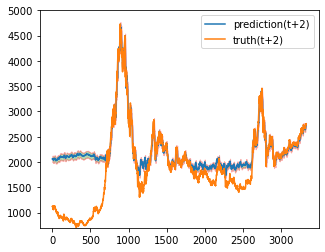

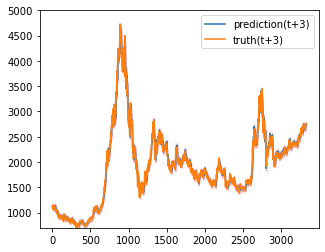

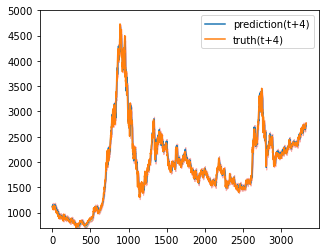

Train epoch:23 	Loss: -12.925318| Loss_in: 0.027024| Loss_out: 0.024801


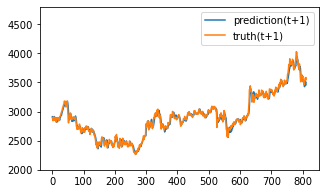

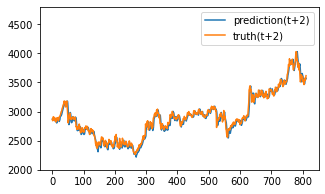

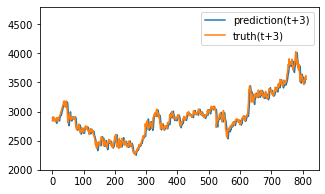

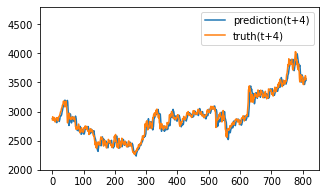

Test epoch:23 	Loss: 0.184721

Epoch: 24


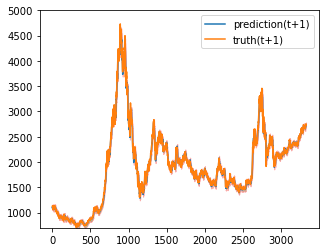

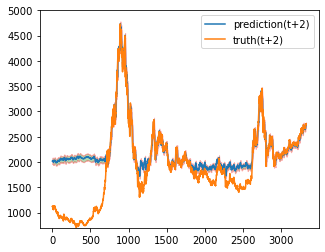

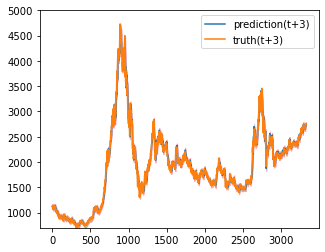

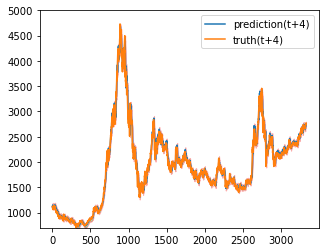

Train epoch:24 	Loss: -13.251621| Loss_in: 0.025738| Loss_out: 0.023012


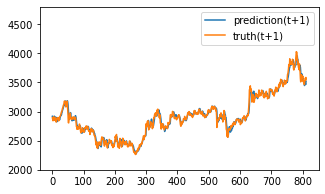

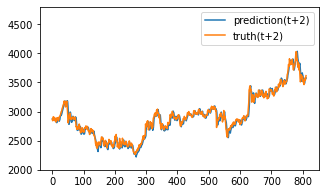

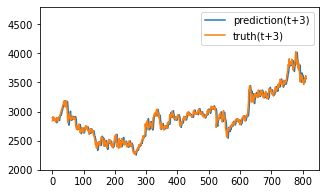

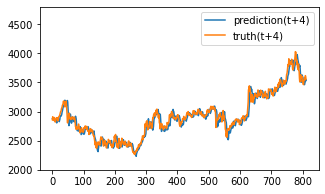

Test epoch:24 	Loss: 0.183584

Epoch: 25


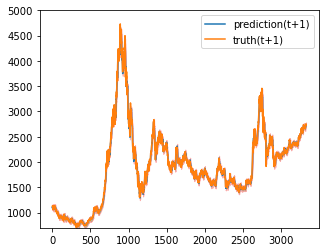

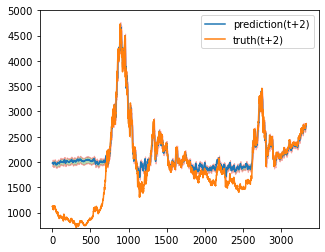

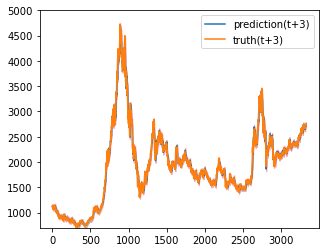

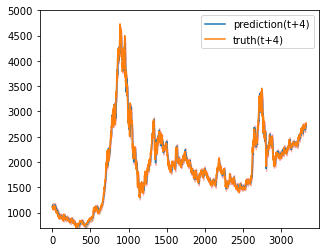

Train epoch:25 	Loss: -13.542966| Loss_in: 0.024455| Loss_out: 0.021826


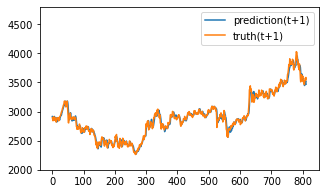

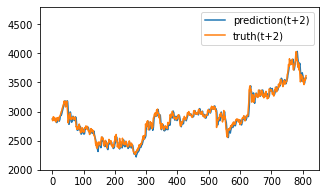

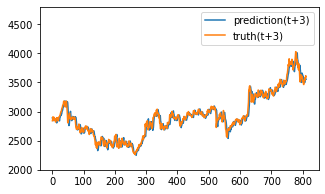

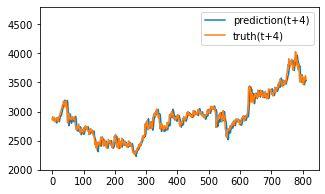

Test epoch:25 	Loss: 0.183559

Epoch: 26


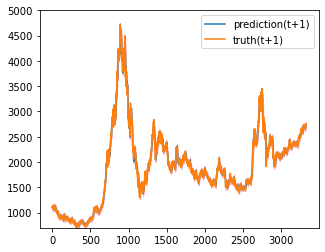

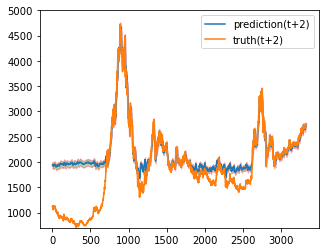

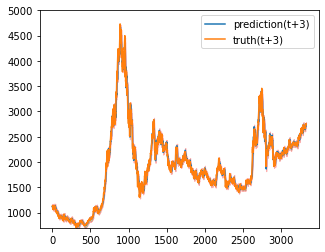

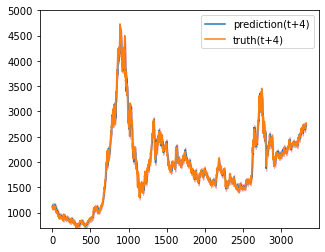

Train epoch:26 	Loss: -13.798882| Loss_in: 0.023426| Loss_out: 0.020452


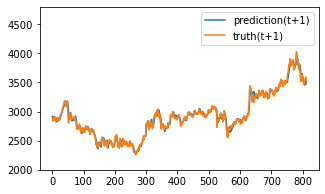

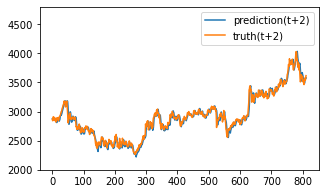

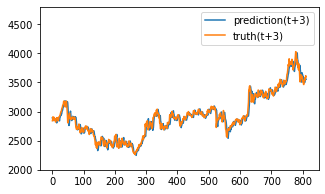

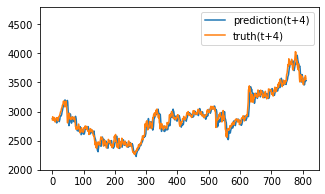

Test epoch:26 	Loss: 0.183089

Epoch: 27


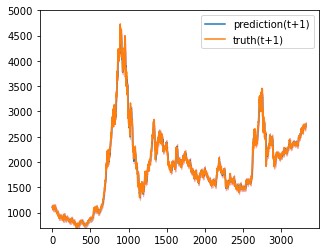

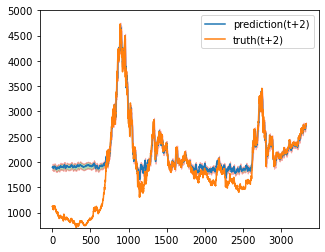

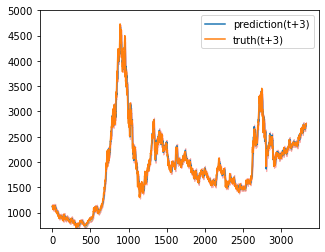

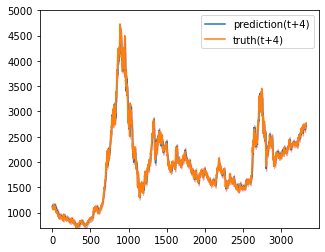

Train epoch:27 	Loss: -14.032865| Loss_in: 0.022442| Loss_out: 0.019565


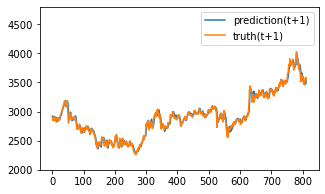

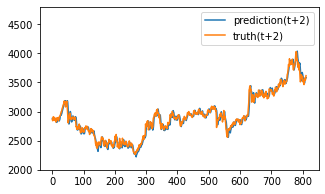

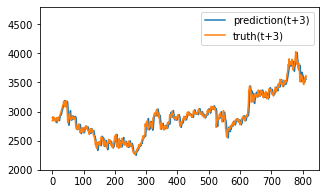

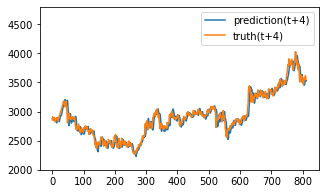

Test epoch:27 	Loss: 0.182607

Epoch: 28


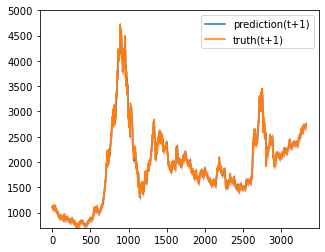

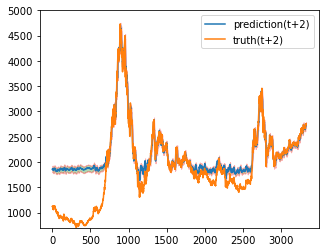

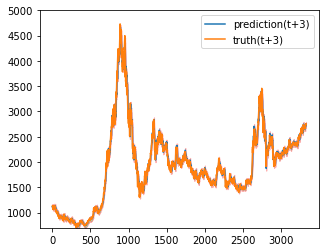

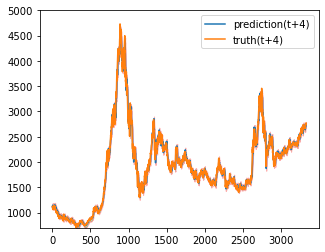

Train epoch:28 	Loss: -14.245025| Loss_in: 0.021681| Loss_out: 0.018954


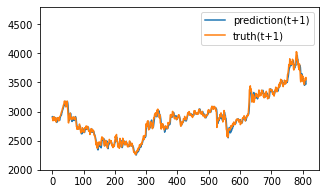

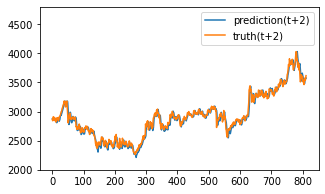

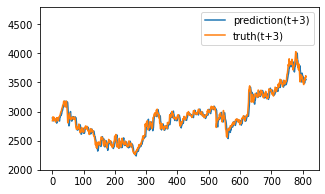

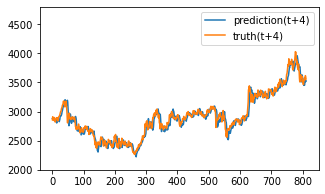

Test epoch:28 	Loss: 0.184090

Epoch: 29


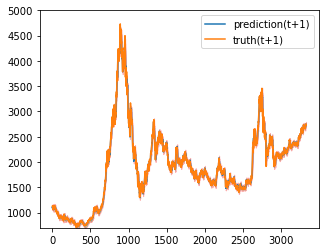

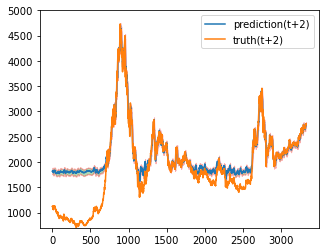

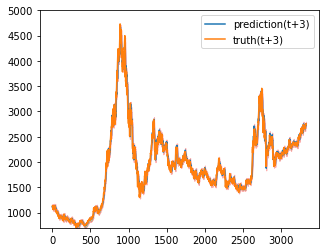

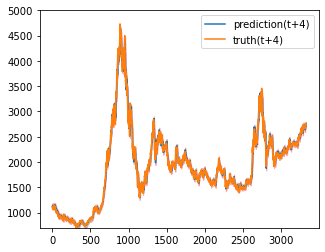

Train epoch:29 	Loss: -14.426085| Loss_in: 0.020879| Loss_out: 0.017843


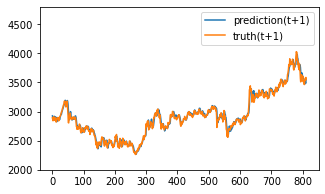

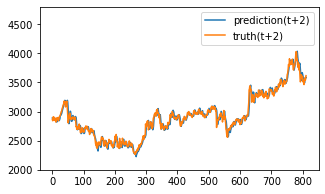

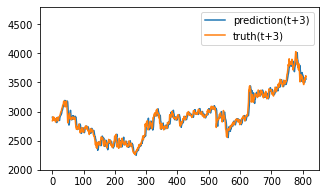

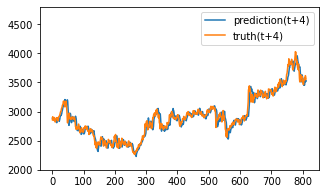

Test epoch:29 	Loss: 0.181795

Epoch: 30


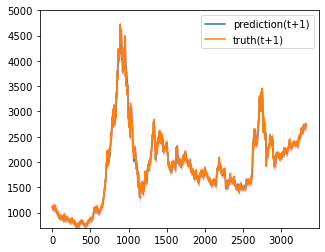

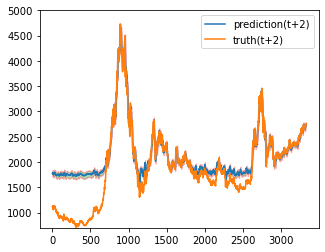

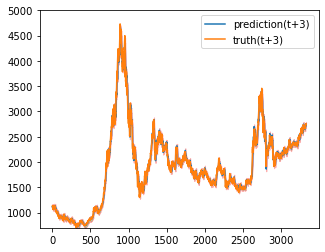

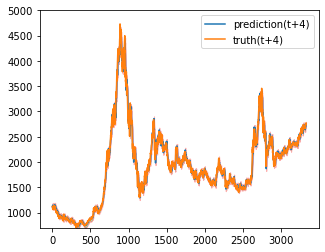

Train epoch:30 	Loss: -14.587594| Loss_in: 0.020173| Loss_out: 0.017374


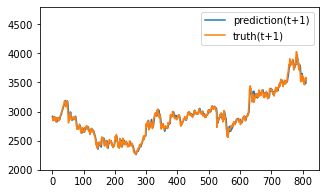

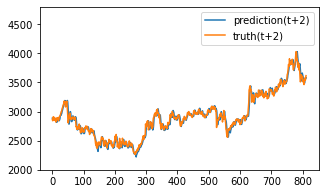

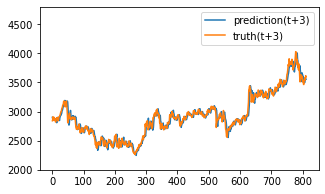

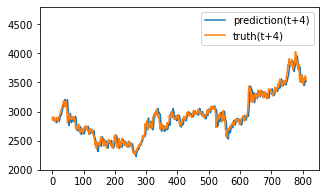

Test epoch:30 	Loss: 0.181434

Epoch: 31


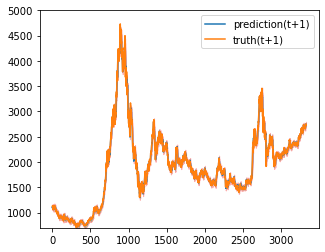

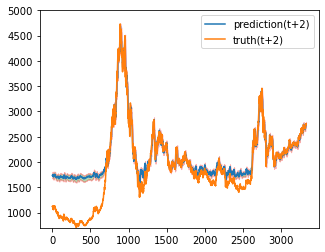

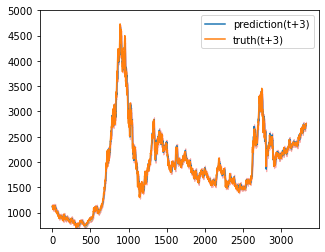

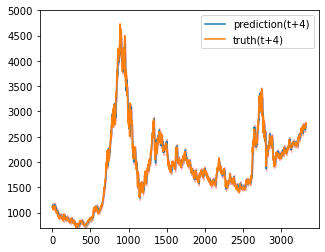

Train epoch:31 	Loss: -14.730704| Loss_in: 0.019582| Loss_out: 0.016924


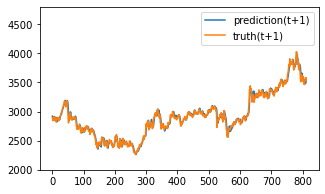

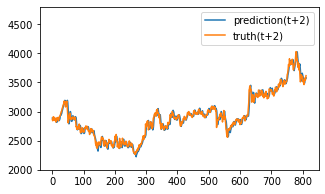

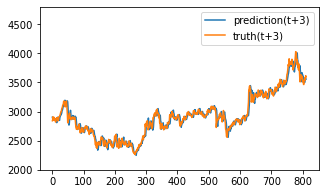

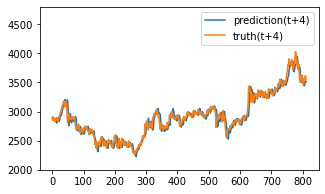

Test epoch:31 	Loss: 0.181480

Epoch: 32


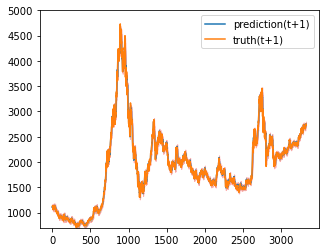

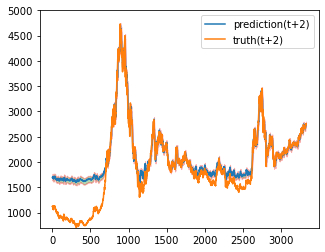

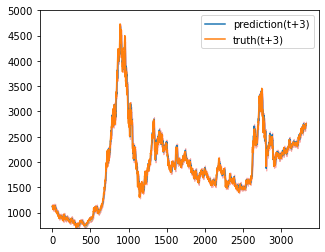

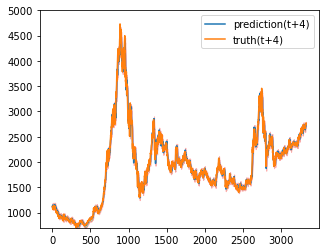

Train epoch:32 	Loss: -14.850015| Loss_in: 0.019117| Loss_out: 0.016057


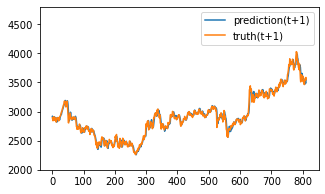

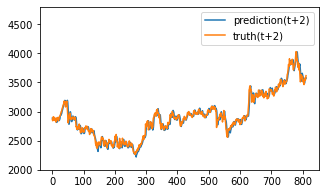

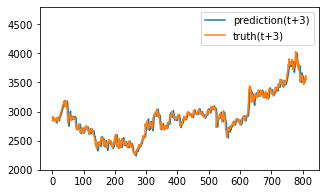

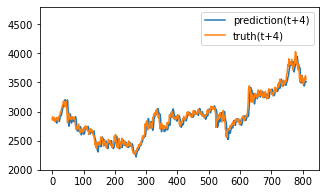

Test epoch:32 	Loss: 0.182113

Epoch: 33


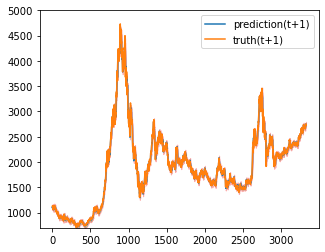

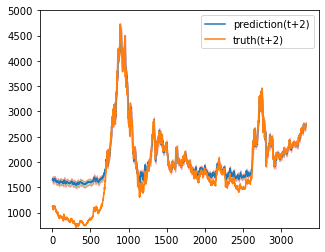

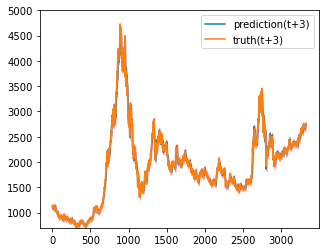

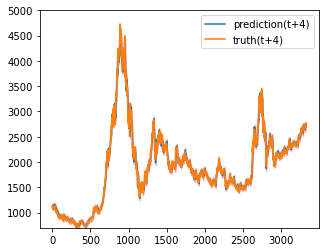

Train epoch:33 	Loss: -14.935464| Loss_in: 0.018584| Loss_out: 0.016077


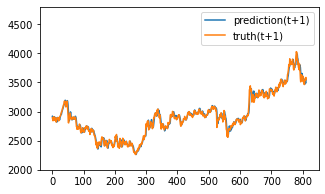

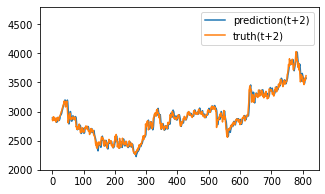

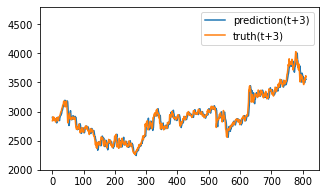

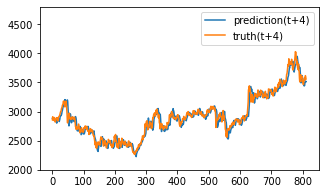

Test epoch:33 	Loss: 0.181187

Epoch: 34


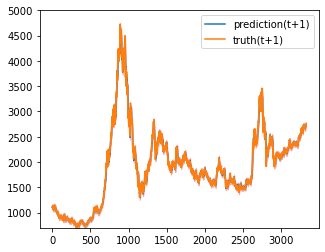

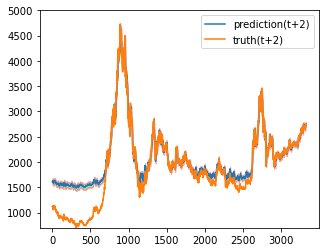

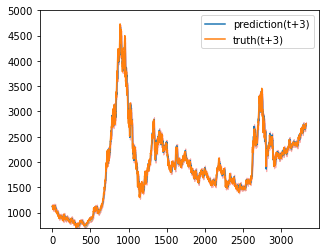

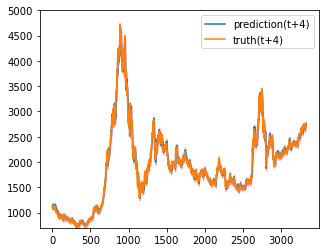

Train epoch:34 	Loss: -15.038776| Loss_in: 0.018146| Loss_out: 0.015469


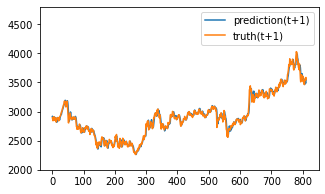

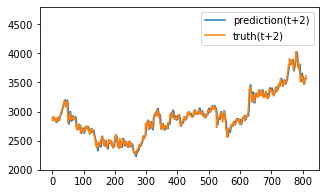

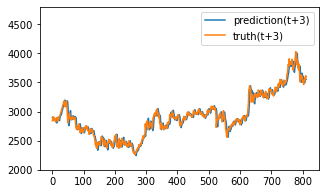

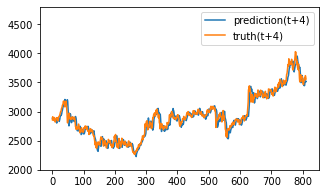

Test epoch:34 	Loss: 0.180709

Epoch: 35


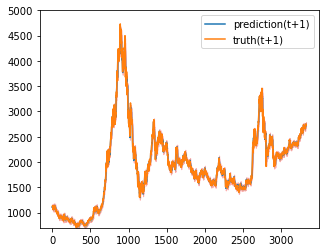

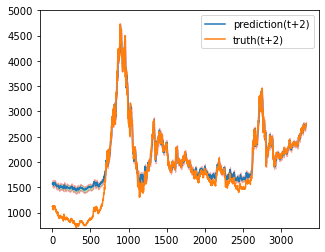

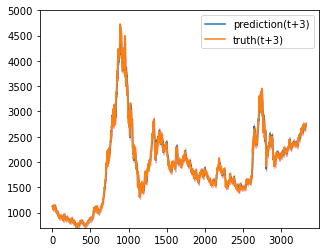

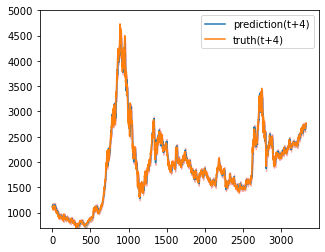

Train epoch:35 	Loss: -15.174985| Loss_in: 0.017686| Loss_out: 0.015149


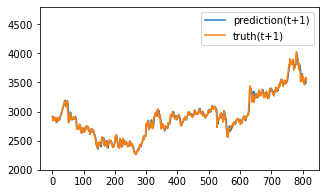

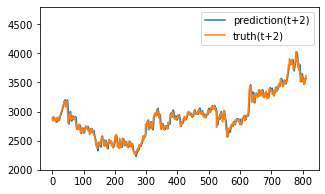

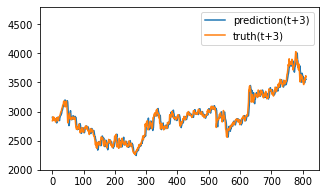

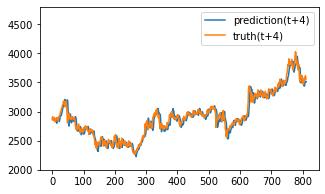

Test epoch:35 	Loss: 0.180751

Epoch: 36


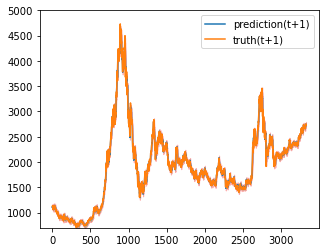

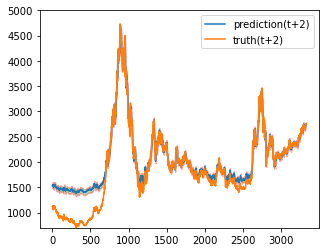

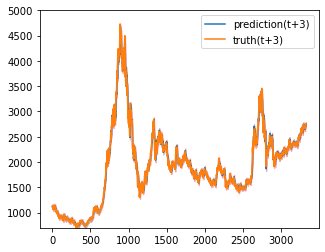

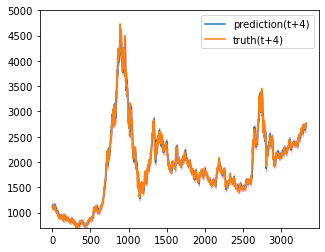

Train epoch:36 	Loss: -15.288259| Loss_in: 0.017336| Loss_out: 0.014972


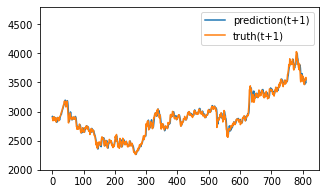

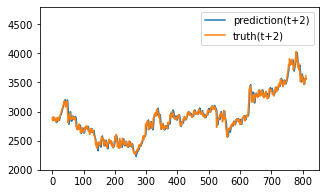

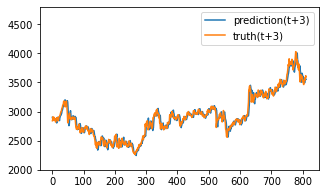

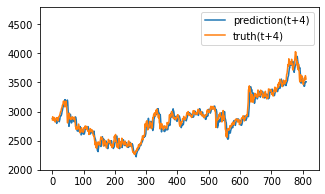

Test epoch:36 	Loss: 0.181089

Epoch: 37


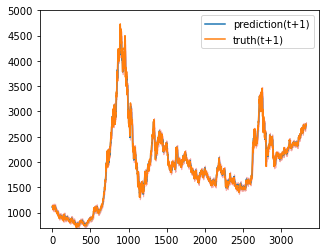

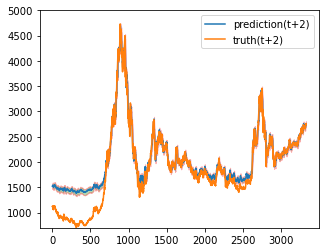

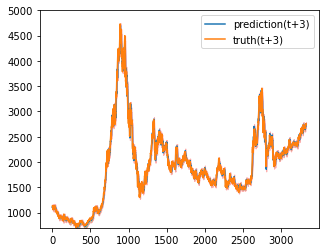

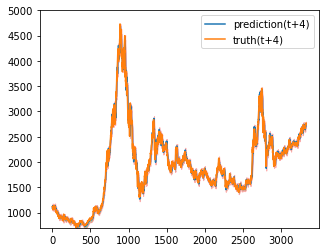

Train epoch:37 	Loss: -12.216286| Loss_in: 0.017980| Loss_out: 0.014362


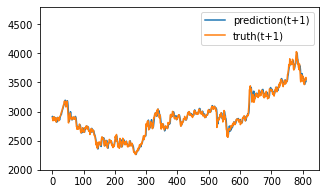

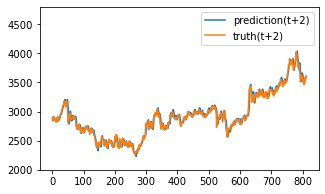

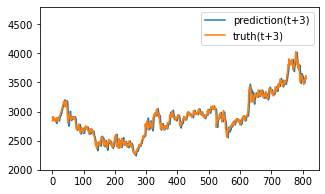

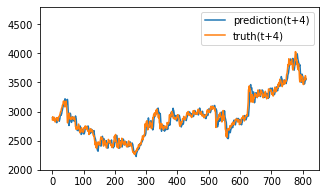

Test epoch:37 	Loss: 0.181437

Epoch: 38


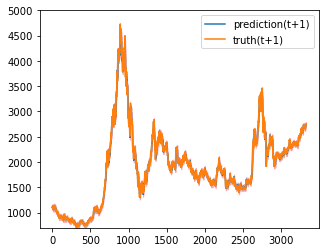

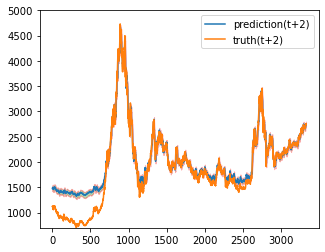

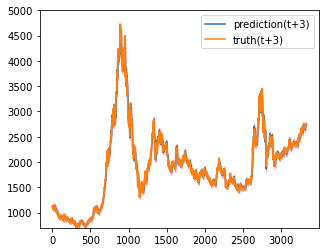

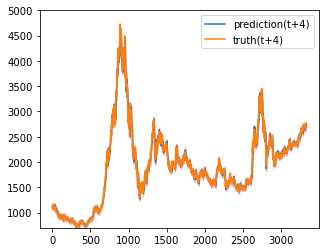

Train epoch:38 	Loss: -14.890101| Loss_in: 0.016610| Loss_out: 0.014615


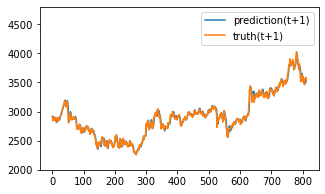

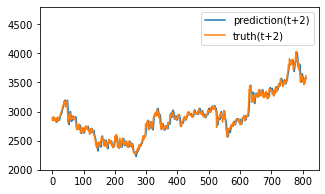

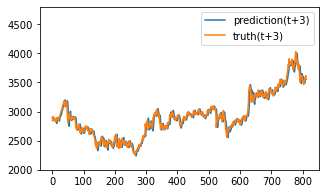

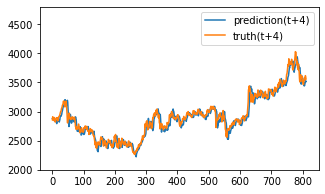

Test epoch:38 	Loss: 0.181551

Epoch: 39


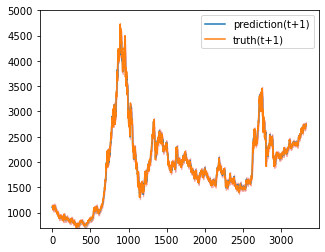

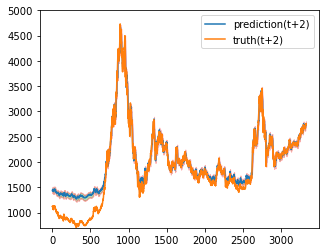

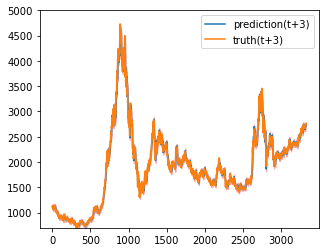

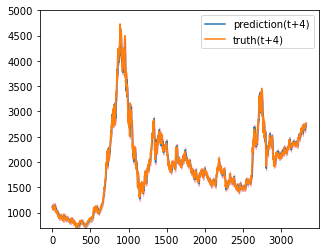

Train epoch:39 	Loss: -15.097142| Loss_in: 0.015974| Loss_out: 0.014191


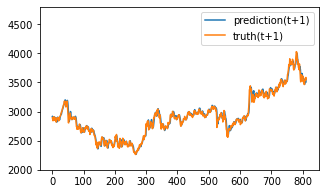

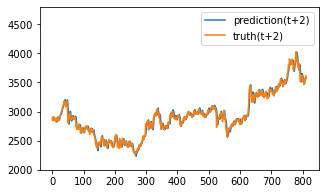

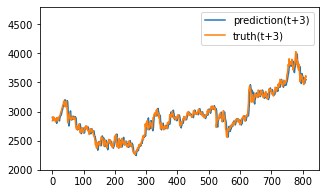

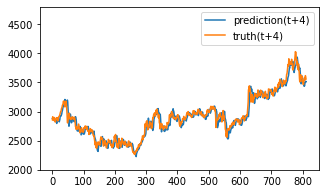

Test epoch:39 	Loss: 0.180986

Epoch: 40


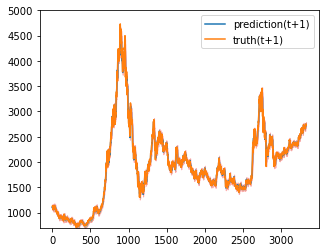

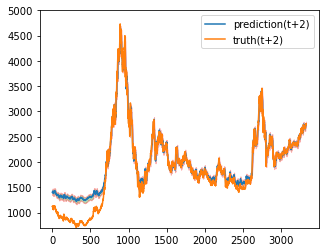

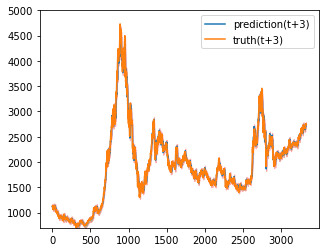

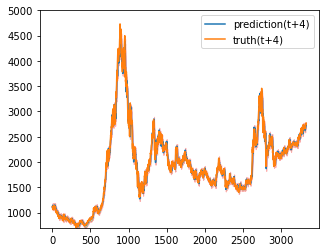

Train epoch:40 	Loss: -15.293122| Loss_in: 0.015765| Loss_out: 0.013856


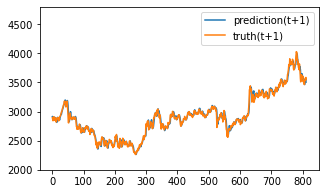

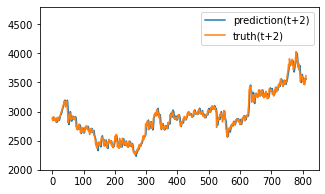

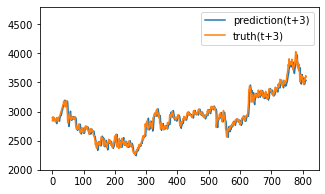

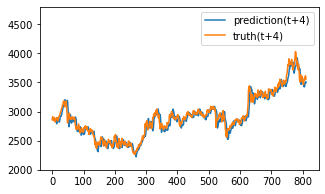

Test epoch:40 	Loss: 0.182465

Epoch: 41


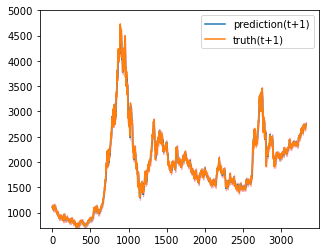

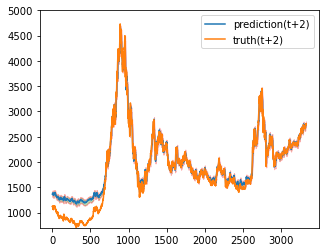

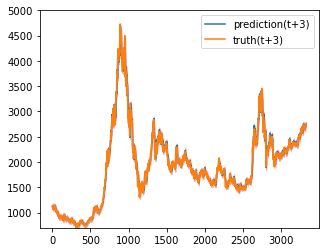

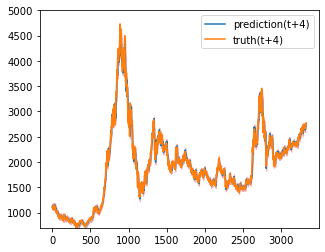

Train epoch:41 	Loss: -15.522372| Loss_in: 0.015581| Loss_out: 0.013476


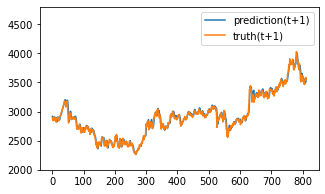

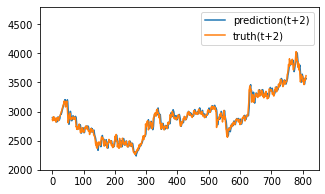

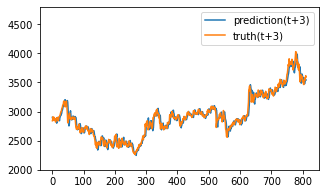

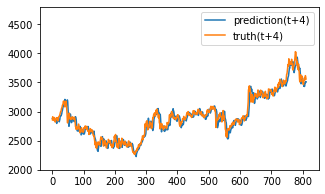

Test epoch:41 	Loss: 0.181112

Epoch: 42


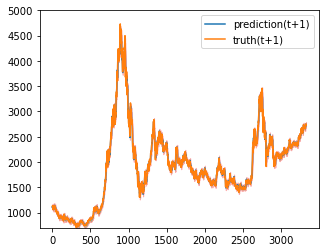

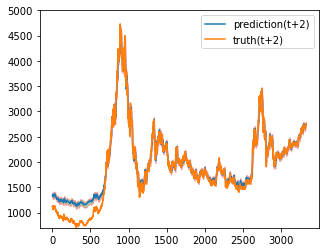

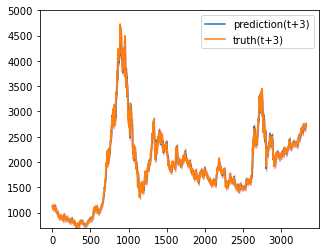

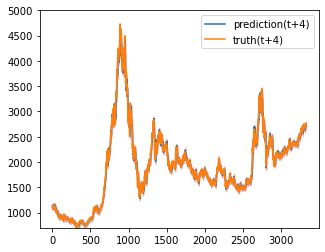

Train epoch:42 	Loss: -15.672728| Loss_in: 0.015295| Loss_out: 0.013304


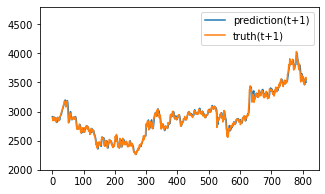

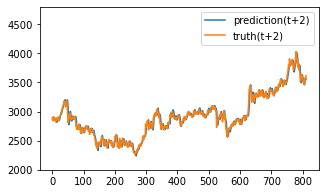

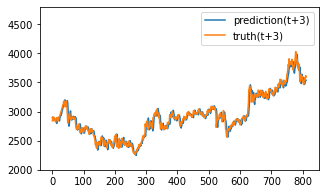

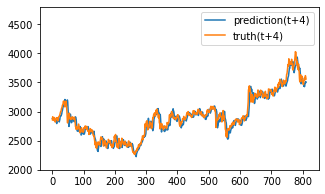

Test epoch:42 	Loss: 0.181196

Epoch: 43


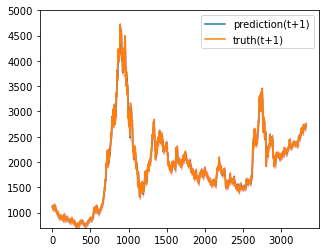

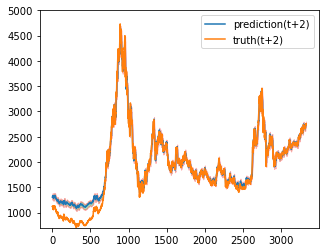

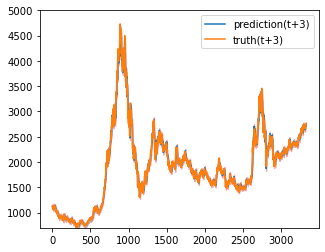

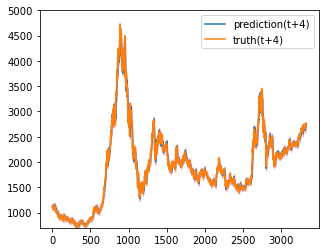

Train epoch:43 	Loss: -15.824119| Loss_in: 0.015039| Loss_out: 0.013055


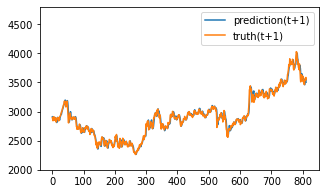

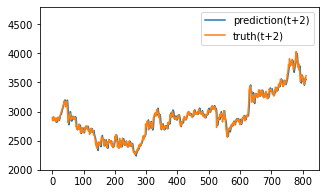

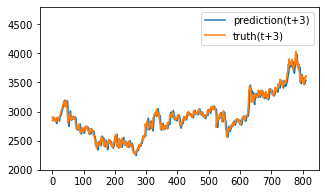

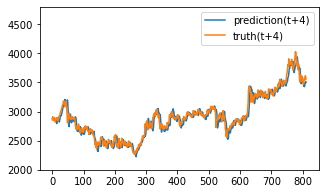

Test epoch:43 	Loss: 0.181477

Epoch: 44


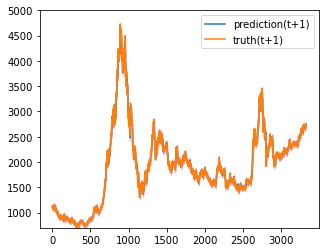

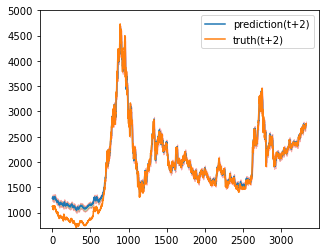

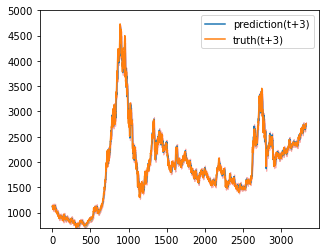

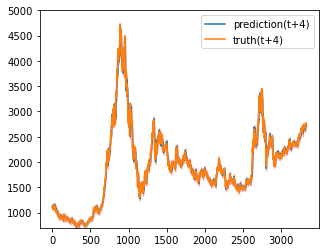

Train epoch:44 	Loss: -15.959413| Loss_in: 0.014843| Loss_out: 0.012910


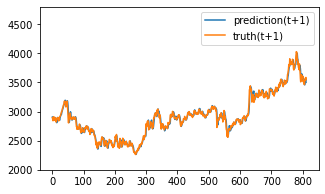

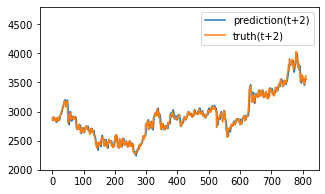

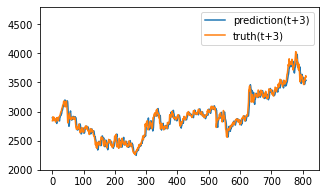

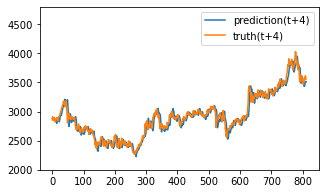

Test epoch:44 	Loss: 0.180592

Epoch: 45


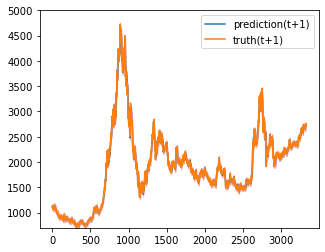

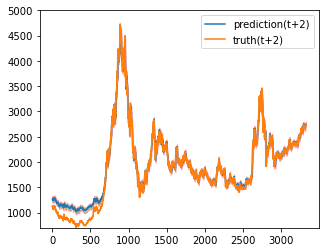

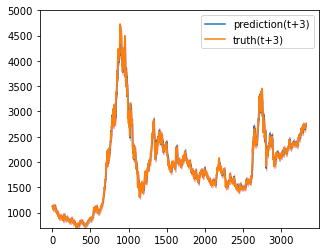

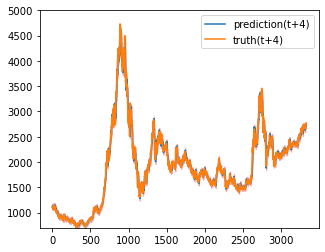

Train epoch:45 	Loss: -16.065583| Loss_in: 0.014553| Loss_out: 0.012718


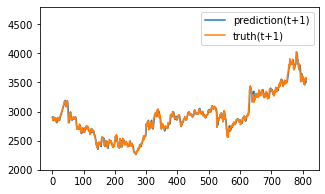

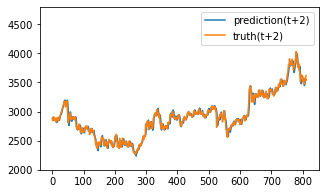

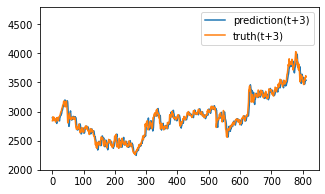

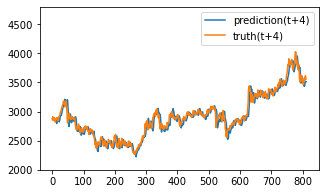

Test epoch:45 	Loss: 0.180609

Epoch: 46


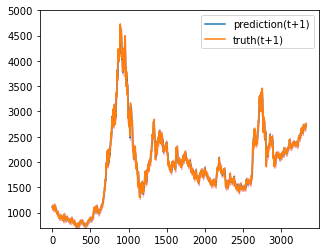

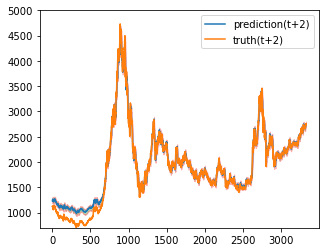

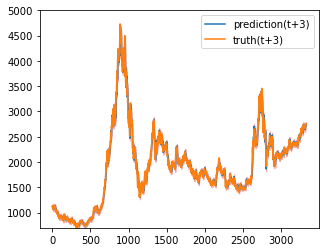

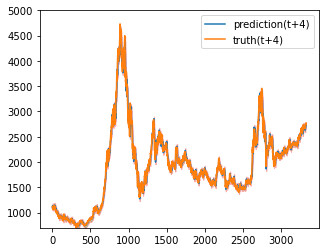

Train epoch:46 	Loss: -16.173248| Loss_in: 0.014423| Loss_out: 0.012756


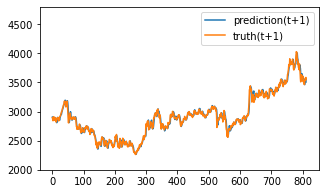

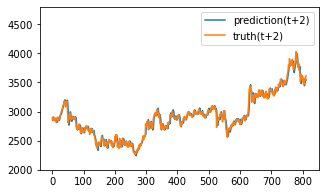

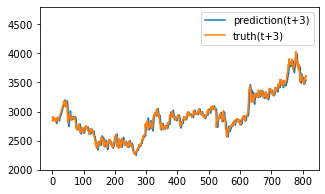

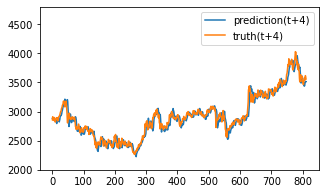

Test epoch:46 	Loss: 0.180457

Epoch: 47


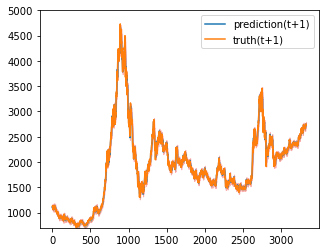

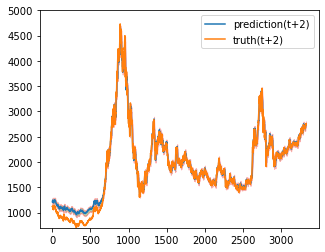

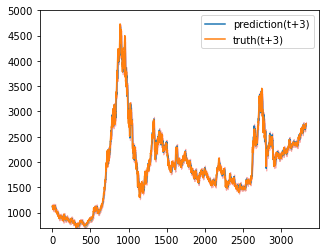

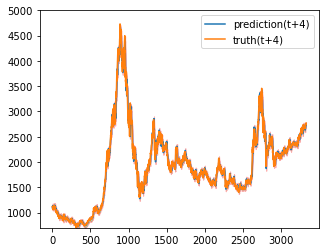

Train epoch:47 	Loss: -16.248776| Loss_in: 0.014208| Loss_out: 0.012240


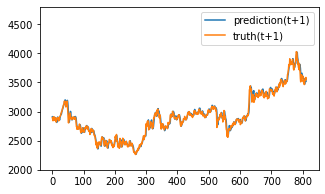

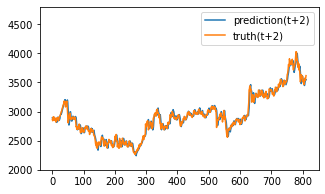

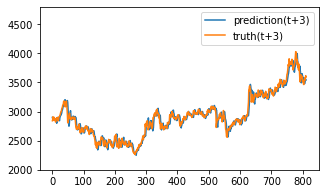

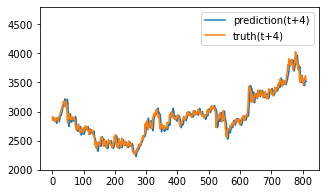

Test epoch:47 	Loss: 0.179970

Epoch: 48


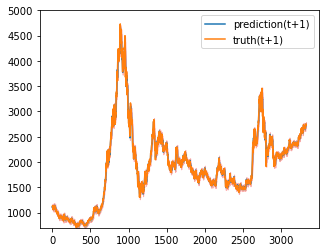

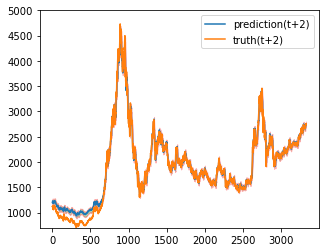

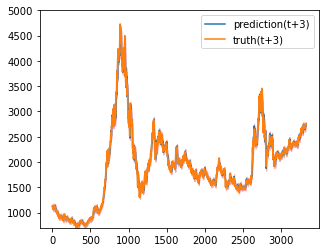

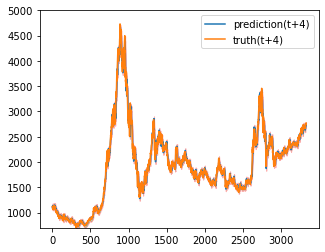

Train epoch:48 	Loss: -16.332893| Loss_in: 0.014006| Loss_out: 0.012229


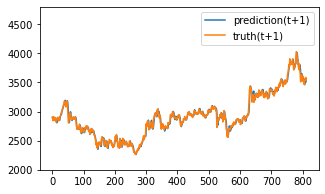

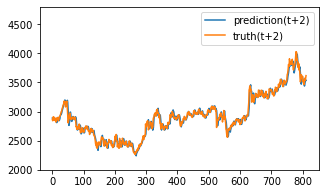

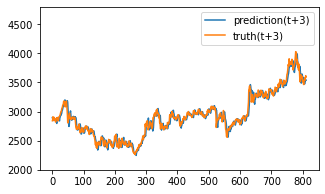

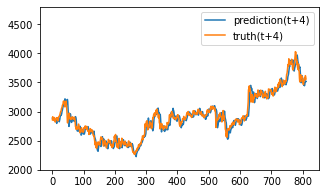

Test epoch:48 	Loss: 0.180049

Epoch: 49


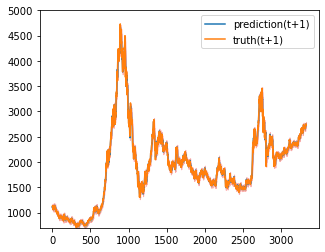

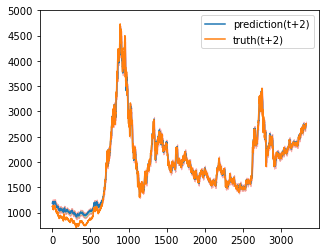

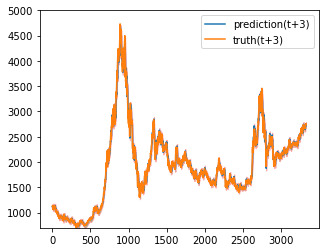

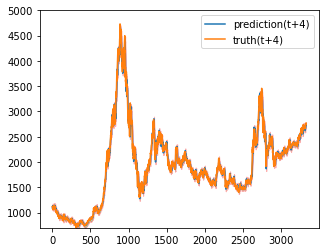

Train epoch:49 	Loss: -16.401457| Loss_in: 0.013844| Loss_out: 0.011990


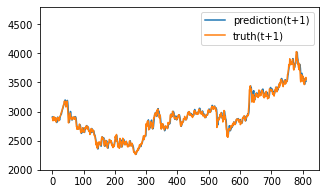

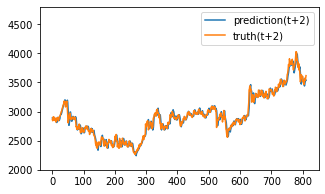

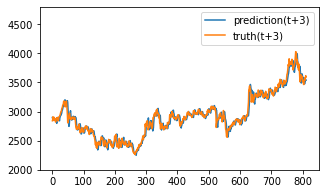

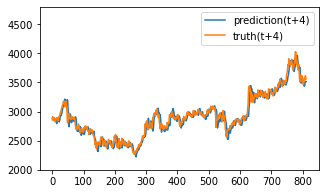

Test epoch:49 	Loss: 0.180563

Epoch: 50


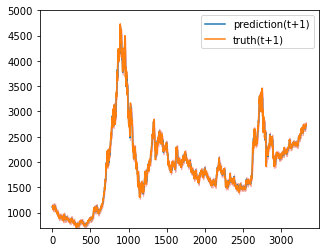

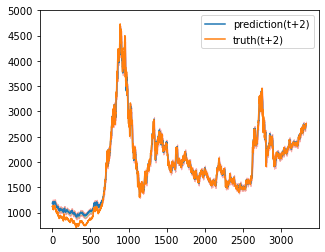

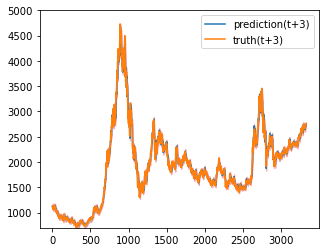

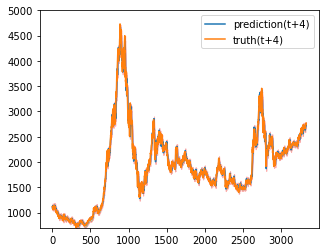

Train epoch:50 	Loss: -15.916298| Loss_in: 0.013705| Loss_out: 0.011922


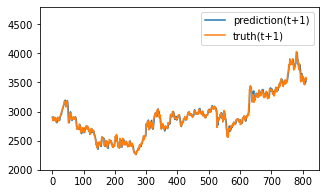

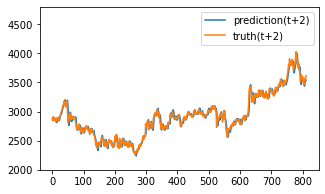

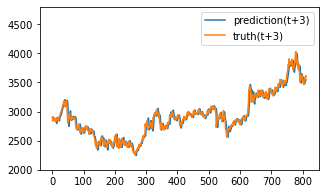

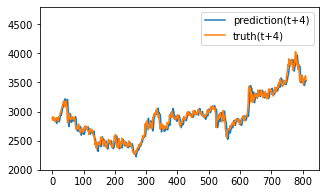

Test epoch:50 	Loss: 0.180029

Epoch: 51


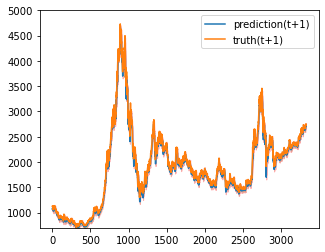

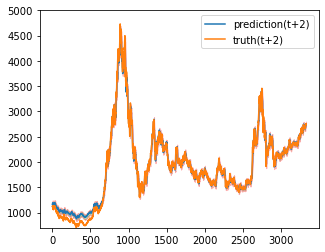

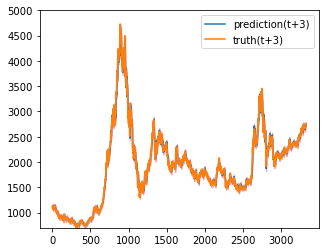

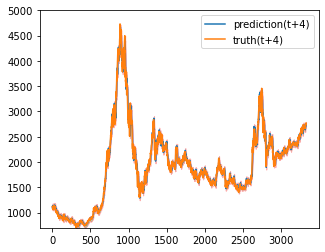

Train epoch:51 	Loss: -16.512340| Loss_in: 0.013499| Loss_out: 0.011757


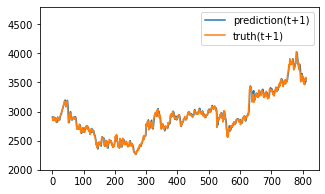

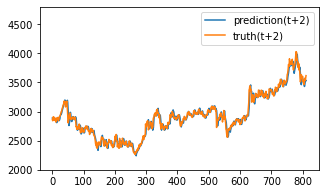

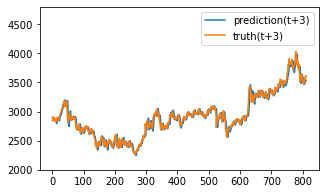

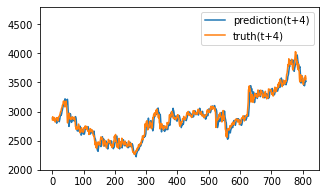

Test epoch:51 	Loss: 0.180173

Epoch: 52


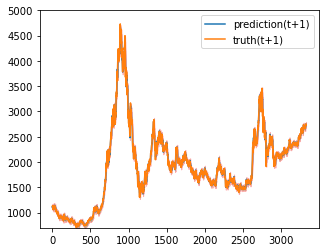

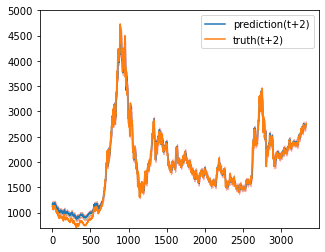

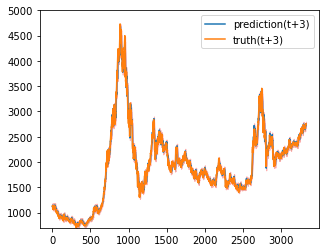

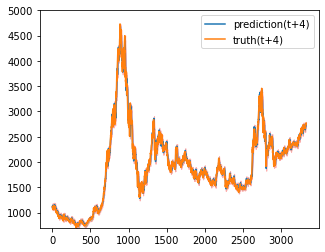

Train epoch:52 	Loss: -16.557585| Loss_in: 0.013338| Loss_out: 0.011672


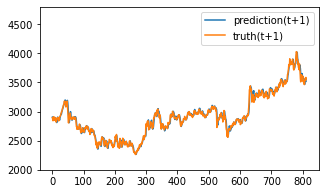

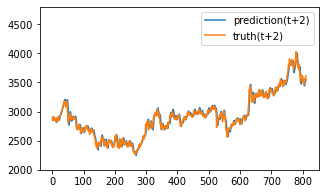

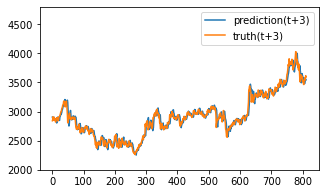

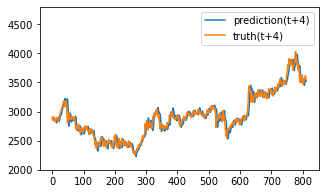

Test epoch:52 	Loss: 0.179264

Epoch: 53


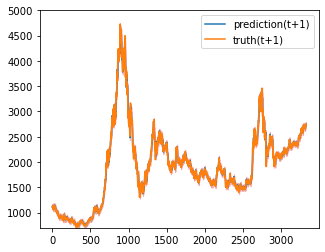

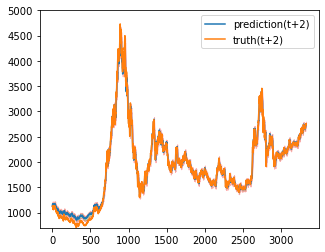

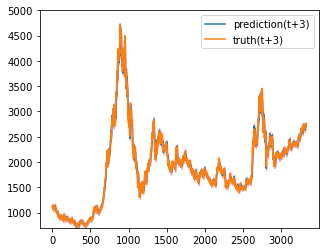

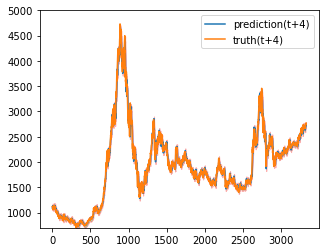

Train epoch:53 	Loss: -16.439108| Loss_in: 0.013221| Loss_out: 0.011432


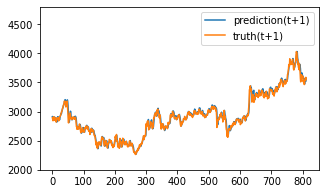

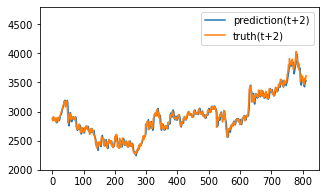

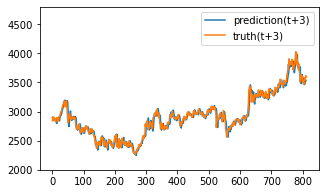

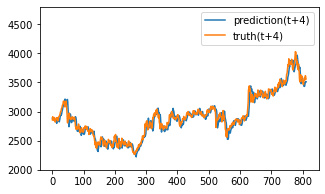

Test epoch:53 	Loss: 0.181370

Epoch: 54


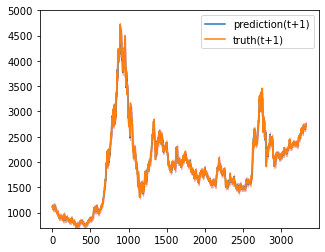

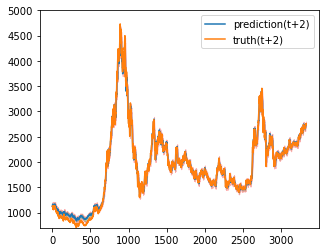

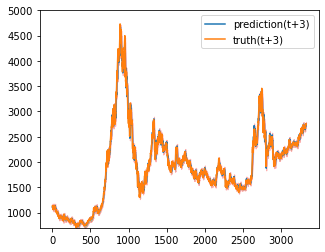

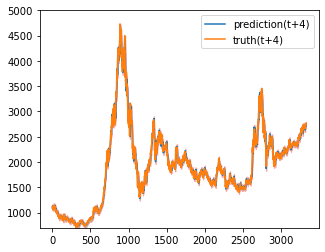

Train epoch:54 	Loss: -16.782921| Loss_in: 0.013116| Loss_out: 0.011555


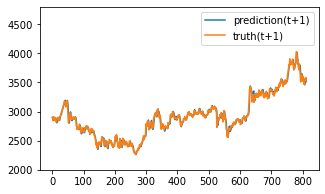

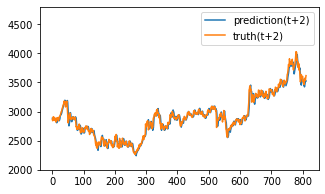

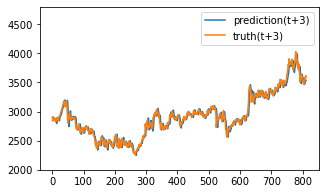

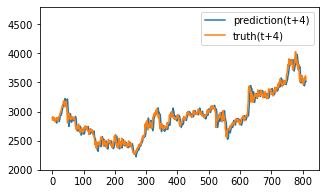

Test epoch:54 	Loss: 0.179861

Epoch: 55


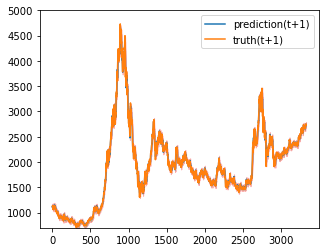

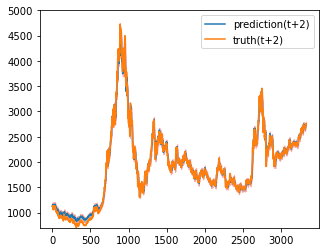

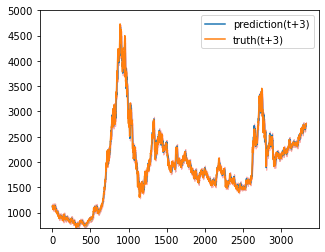

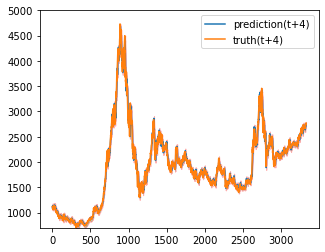

Train epoch:55 	Loss: -16.873805| Loss_in: 0.012990| Loss_out: 0.011138


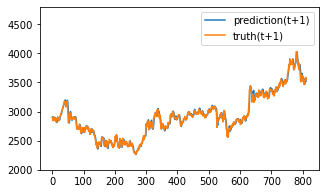

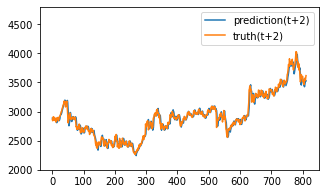

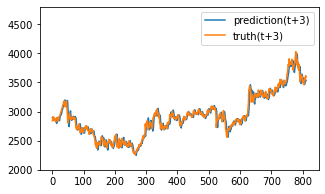

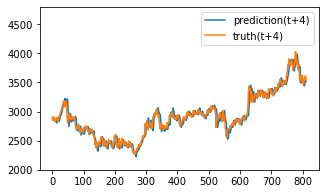

Test epoch:55 	Loss: 0.179850

Epoch: 56


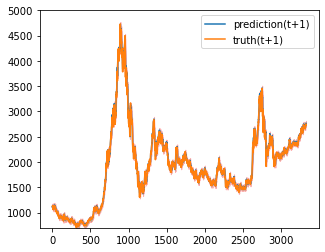

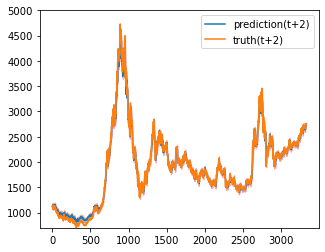

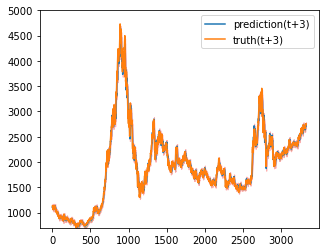

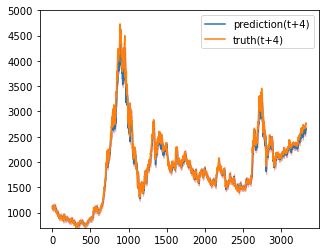

Train epoch:56 	Loss: -16.666069| Loss_in: 0.012856| Loss_out: 0.011444


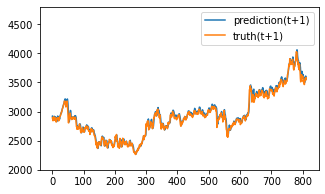

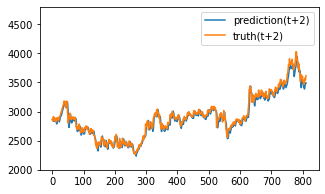

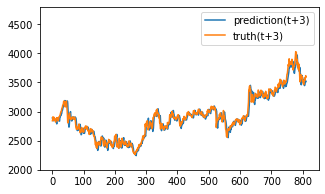

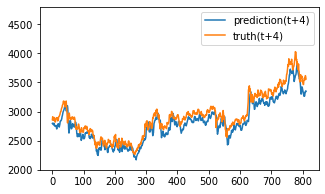

Test epoch:56 	Loss: 0.240831

Epoch: 57


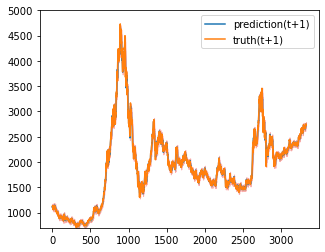

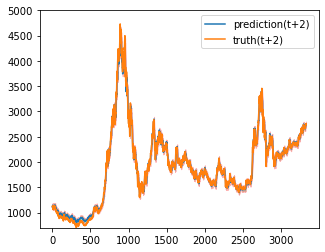

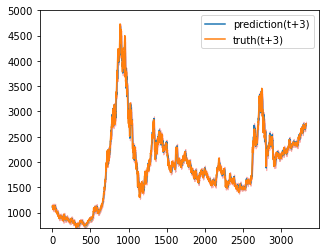

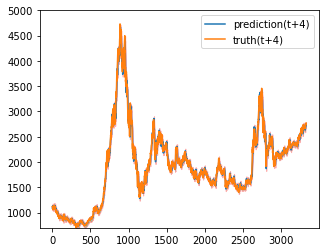

Train epoch:57 	Loss: -16.956980| Loss_in: 0.012774| Loss_out: 0.011067


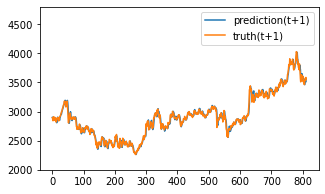

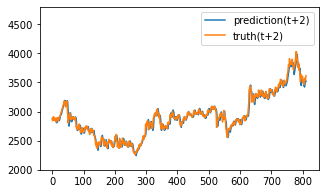

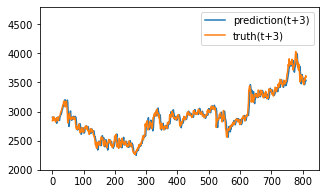

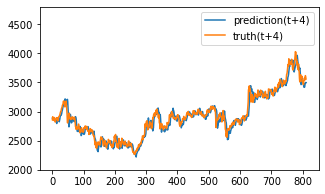

Test epoch:57 	Loss: 0.181153

Epoch: 58


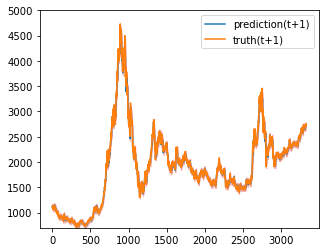

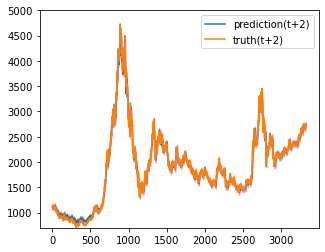

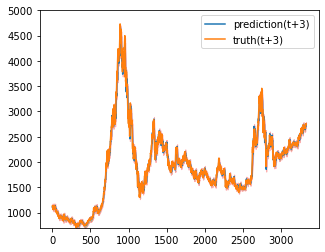

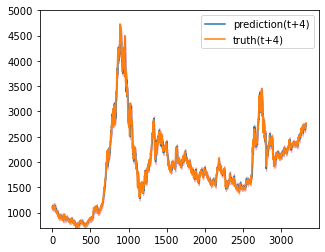

Train epoch:58 	Loss: -17.099308| Loss_in: 0.012577| Loss_out: 0.010809


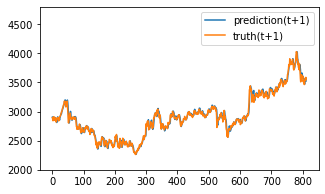

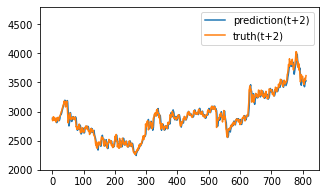

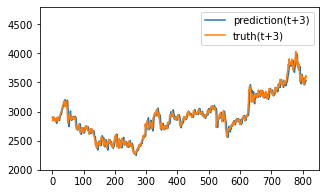

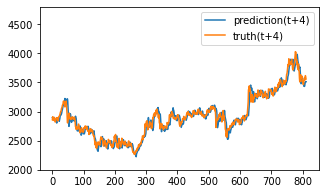

Test epoch:58 	Loss: 0.180276

Epoch: 59


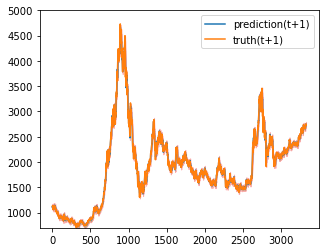

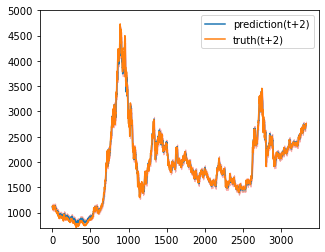

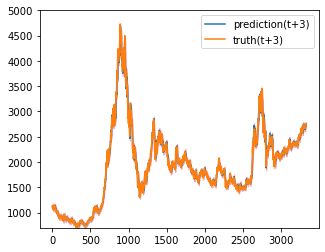

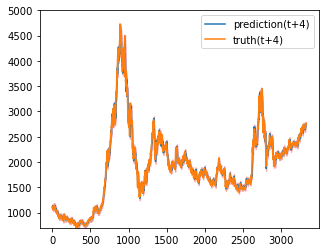

Train epoch:59 	Loss: -17.181710| Loss_in: 0.012449| Loss_out: 0.010911


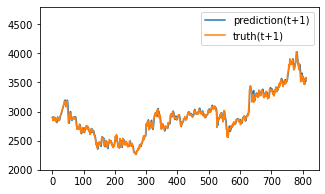

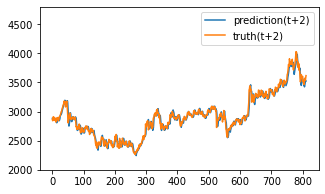

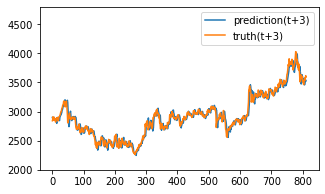

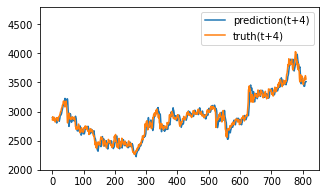

Test epoch:59 	Loss: 0.180296

Epoch: 60


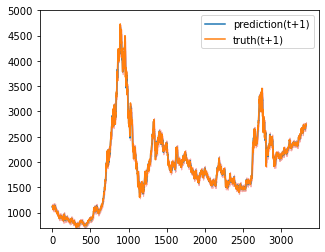

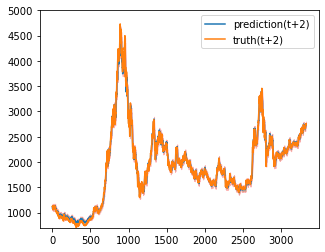

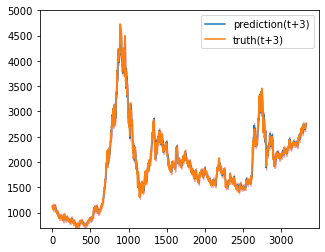

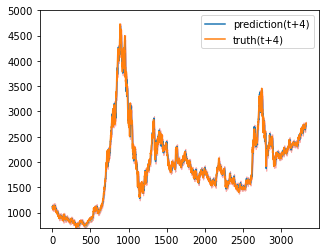

Train epoch:60 	Loss: -17.246484| Loss_in: 0.012361| Loss_out: 0.011027


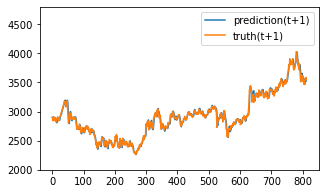

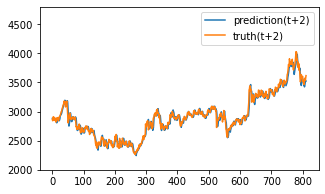

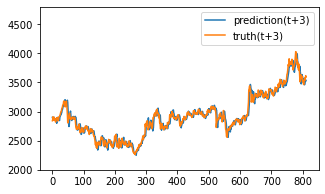

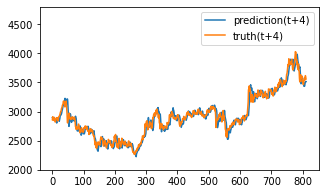

Test epoch:60 	Loss: 0.180121

Epoch: 61


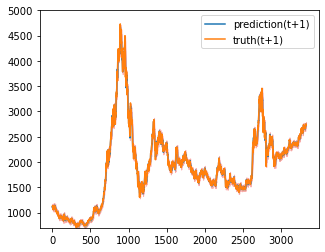

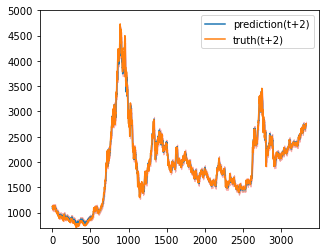

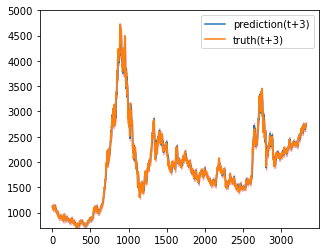

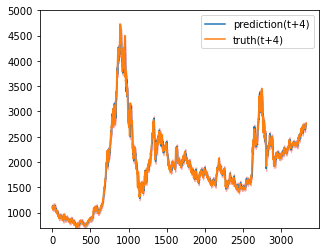

Train epoch:61 	Loss: -17.313588| Loss_in: 0.012299| Loss_out: 0.010768


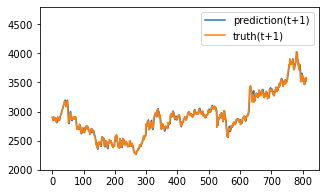

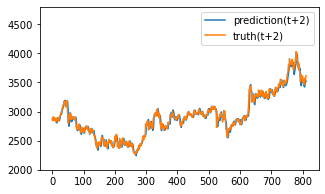

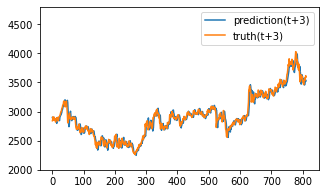

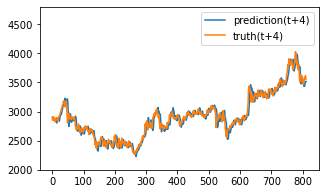

Test epoch:61 	Loss: 0.180297

Epoch: 62


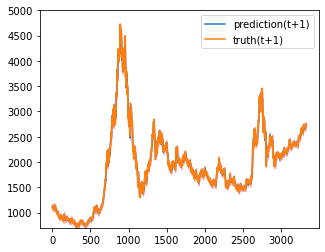

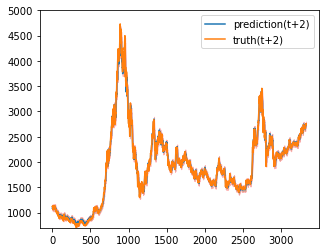

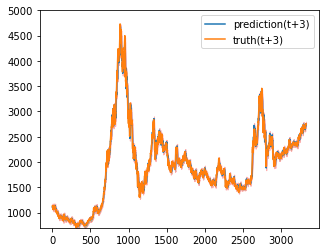

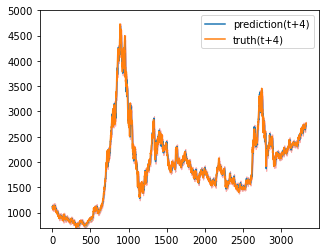

Train epoch:62 	Loss: -17.382423| Loss_in: 0.012226| Loss_out: 0.010484


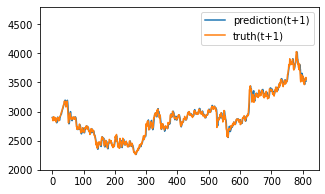

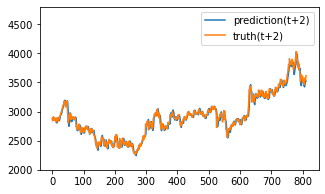

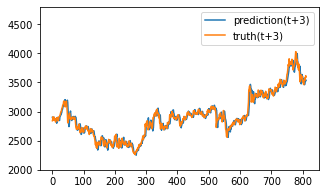

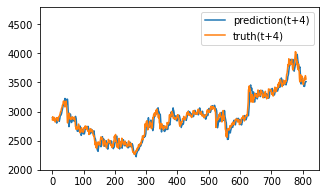

Test epoch:62 	Loss: 0.180276

Epoch: 63


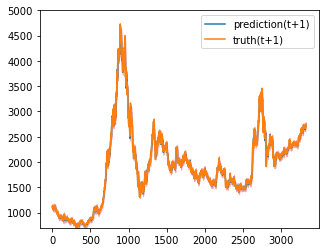

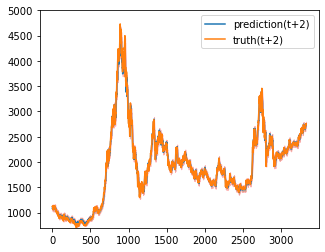

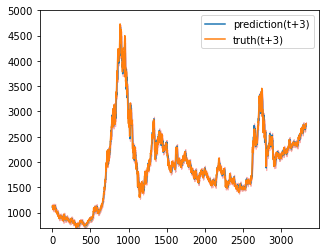

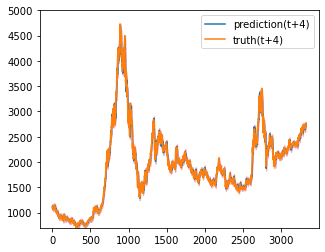

Train epoch:63 	Loss: -17.420967| Loss_in: 0.012101| Loss_out: 0.010566


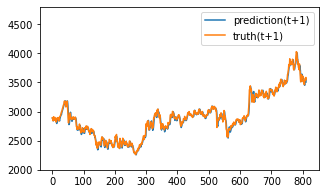

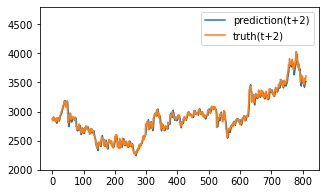

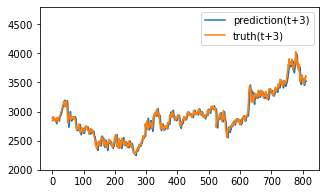

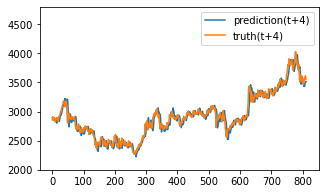

Test epoch:63 	Loss: 0.182094

Epoch: 64


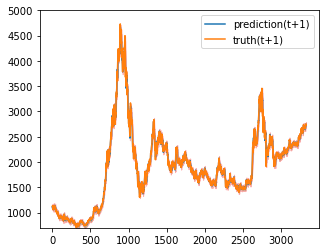

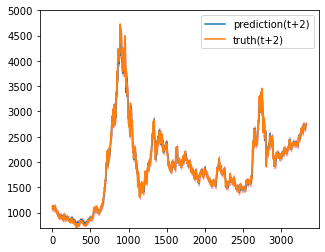

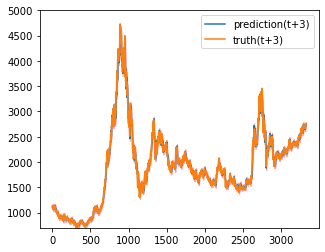

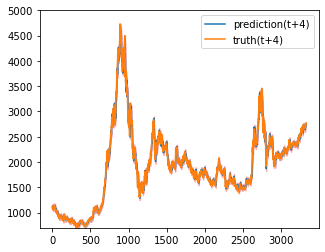

Train epoch:64 	Loss: -17.480564| Loss_in: 0.011992| Loss_out: 0.010691


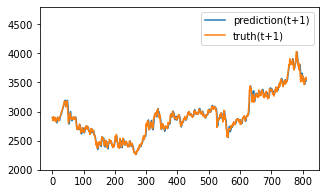

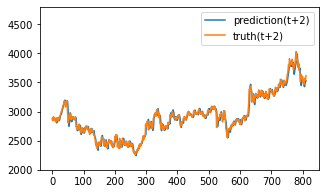

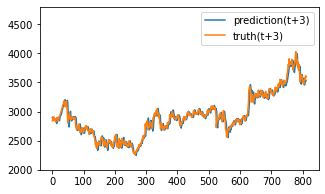

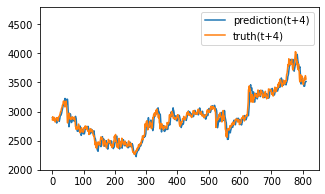

Test epoch:64 	Loss: 0.180223

Epoch: 65


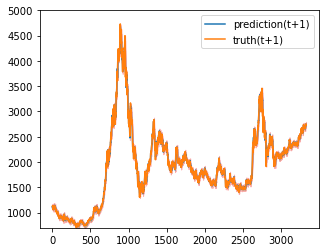

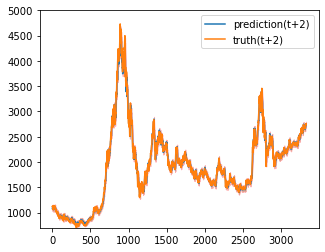

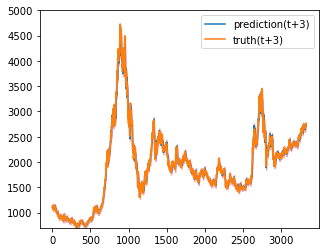

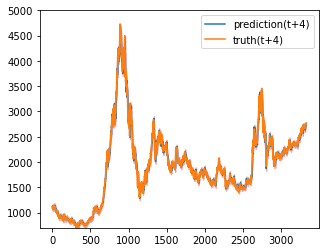

Train epoch:65 	Loss: -17.543912| Loss_in: 0.011935| Loss_out: 0.010489


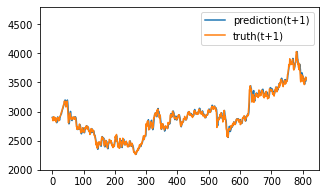

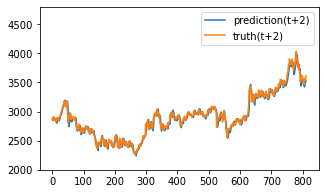

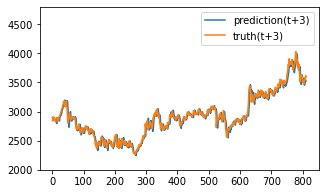

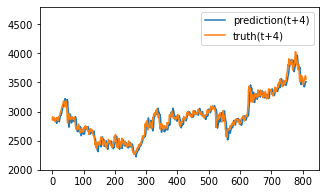

Test epoch:65 	Loss: 0.181899

Epoch: 66


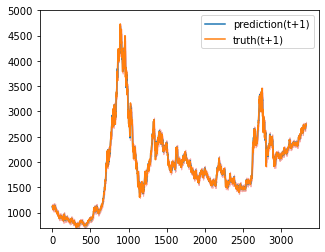

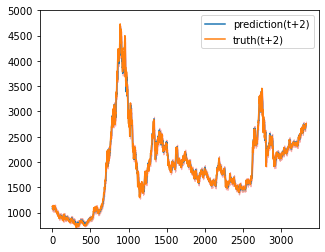

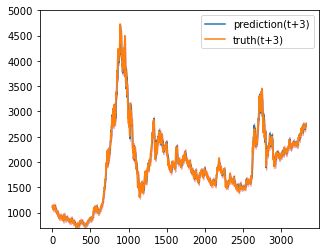

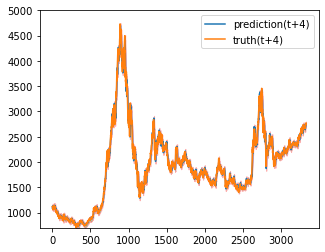

Train epoch:66 	Loss: -17.604839| Loss_in: 0.011859| Loss_out: 0.010399


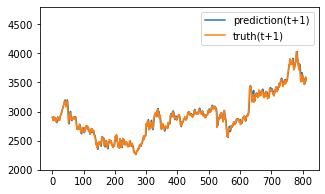

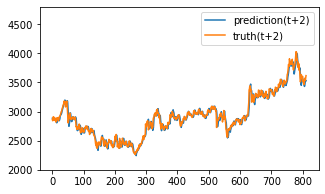

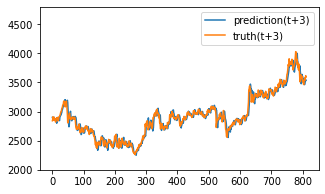

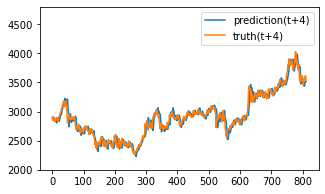

Test epoch:66 	Loss: 0.179919

Epoch: 67


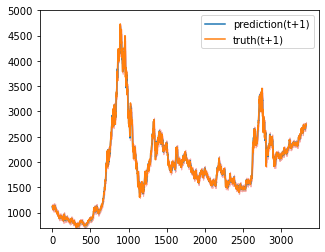

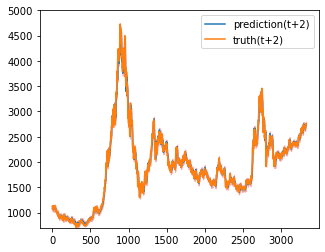

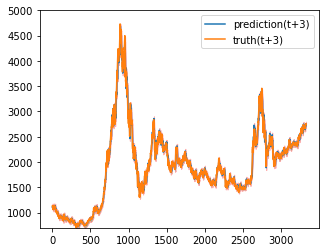

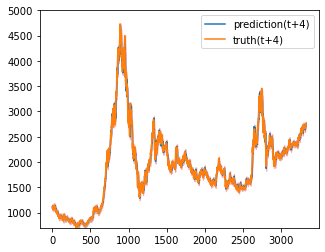

Train epoch:67 	Loss: -17.661768| Loss_in: 0.011777| Loss_out: 0.010302


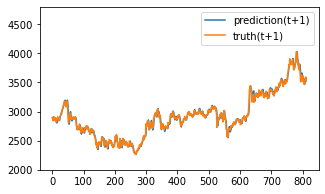

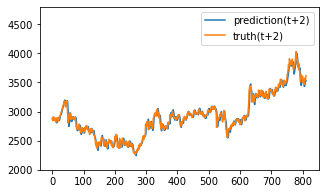

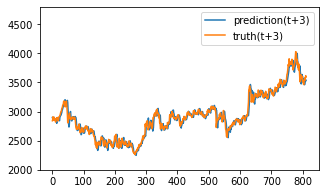

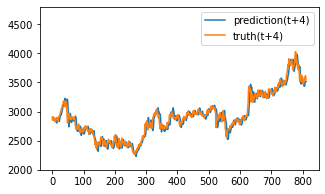

Test epoch:67 	Loss: 0.179925

Epoch: 68


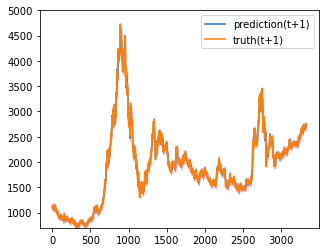

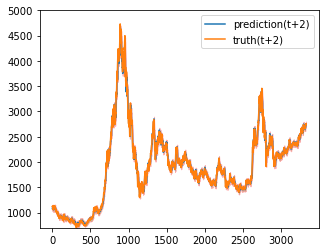

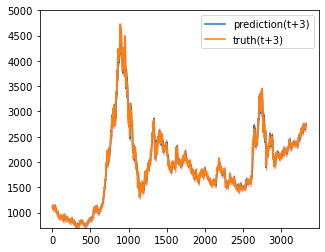

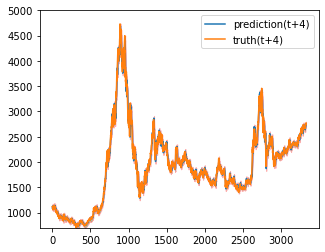

Train epoch:68 	Loss: -17.711997| Loss_in: 0.011742| Loss_out: 0.010415


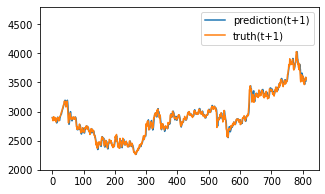

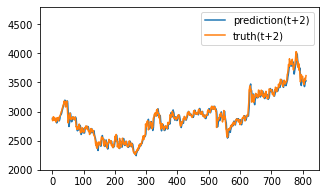

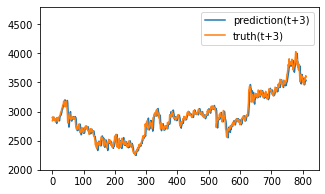

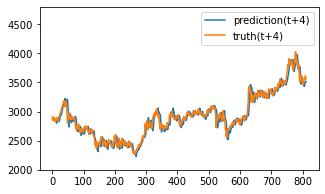

Test epoch:68 	Loss: 0.180307

Epoch: 69


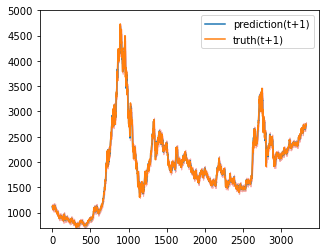

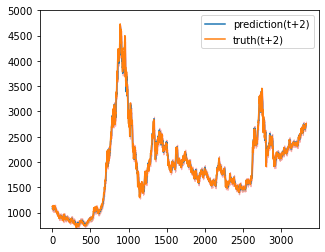

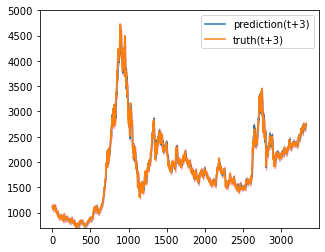

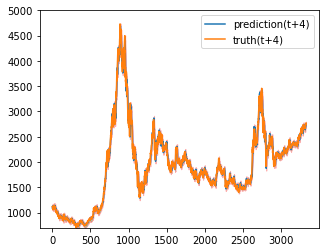

Train epoch:69 	Loss: -17.754011| Loss_in: 0.011683| Loss_out: 0.010325


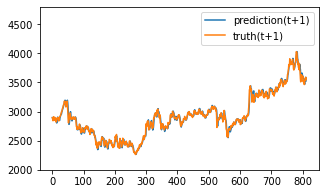

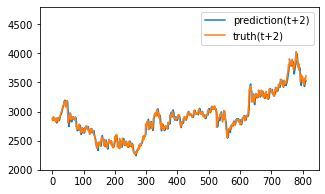

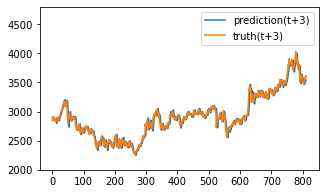

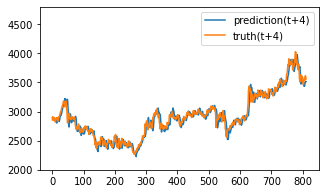

Test epoch:69 	Loss: 0.180033

Epoch: 70


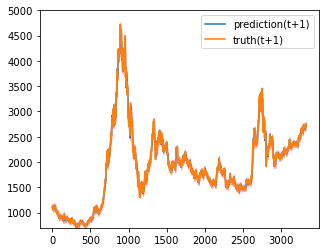

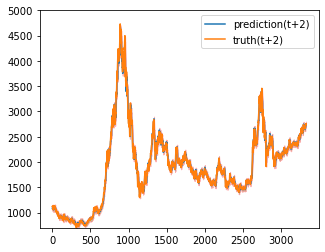

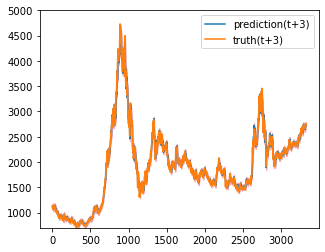

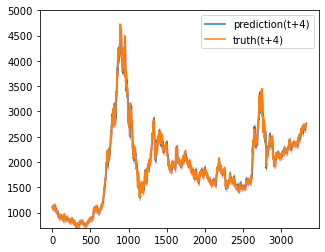

Train epoch:70 	Loss: -17.687658| Loss_in: 0.011605| Loss_out: 0.010121


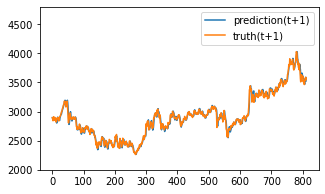

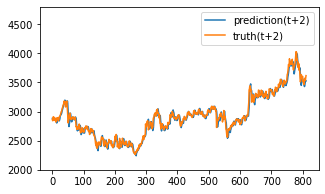

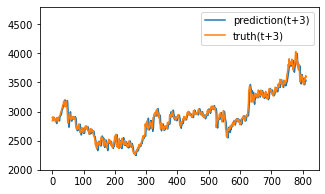

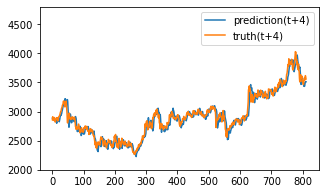

Test epoch:70 	Loss: 0.180622

Epoch: 71


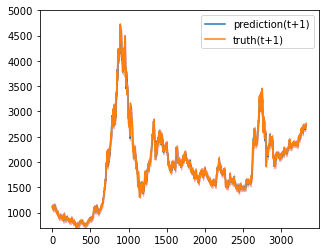

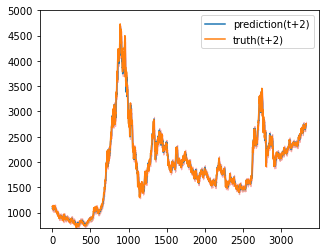

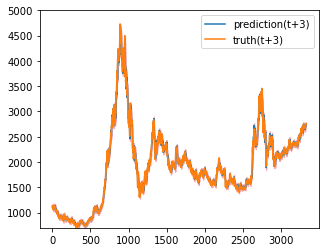

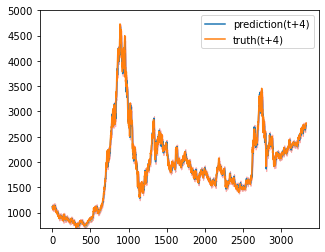

Train epoch:71 	Loss: -17.828425| Loss_in: 0.011528| Loss_out: 0.010260


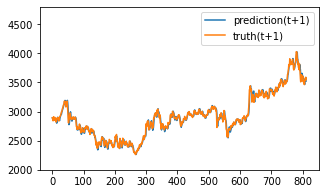

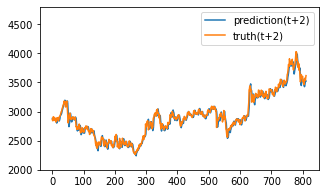

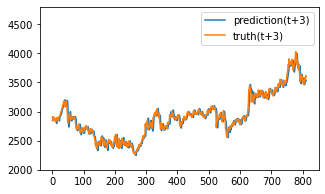

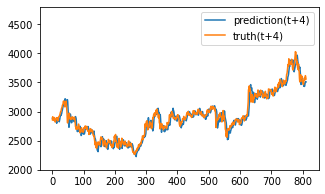

Test epoch:71 	Loss: 0.180685

Epoch: 72


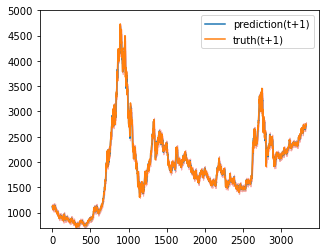

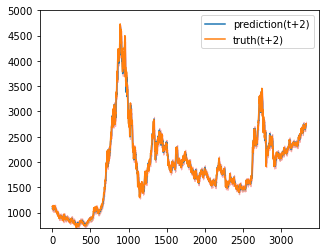

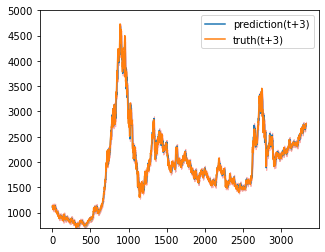

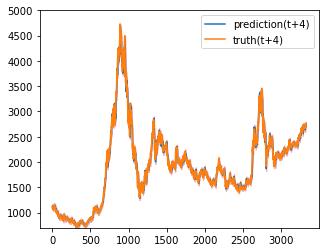

Train epoch:72 	Loss: -17.839057| Loss_in: 0.011457| Loss_out: 0.009899


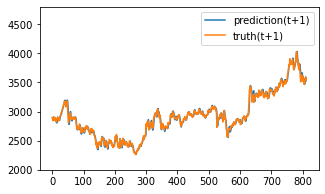

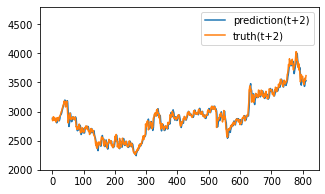

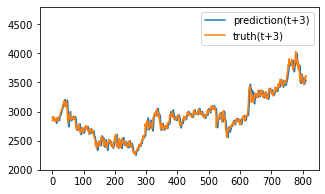

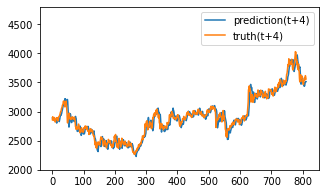

Test epoch:72 	Loss: 0.179839

Epoch: 73


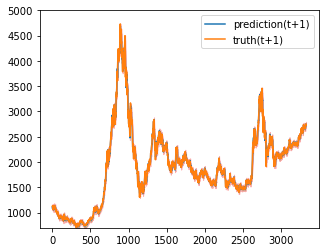

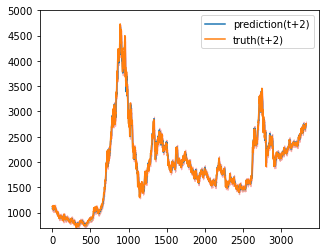

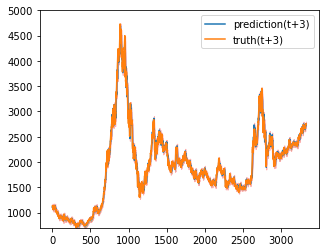

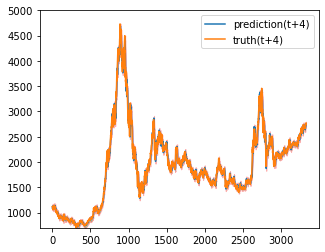

Train epoch:73 	Loss: -17.904453| Loss_in: 0.011346| Loss_out: 0.009939


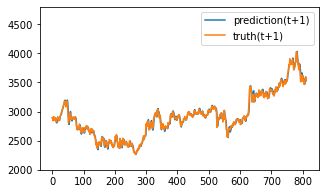

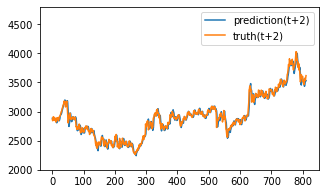

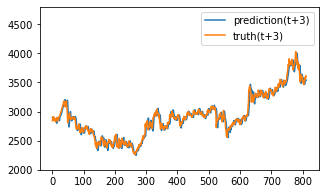

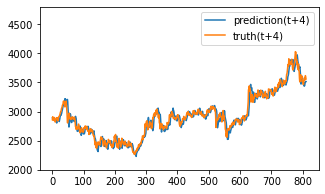

Test epoch:73 	Loss: 0.179523

Epoch: 74


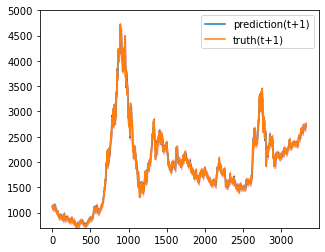

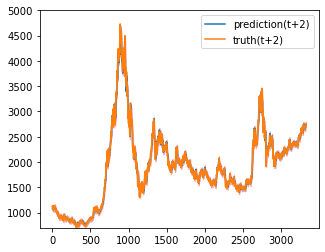

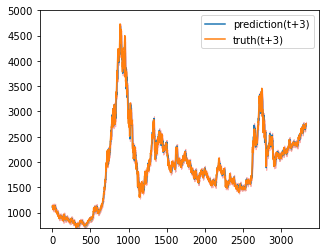

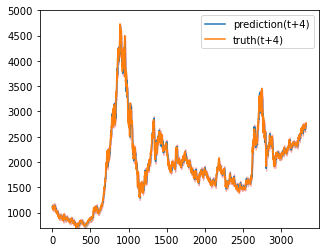

Train epoch:74 	Loss: -17.843588| Loss_in: 0.011296| Loss_out: 0.010045


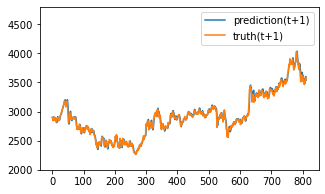

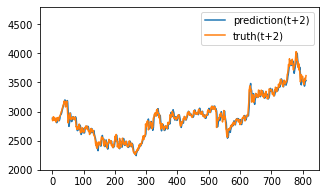

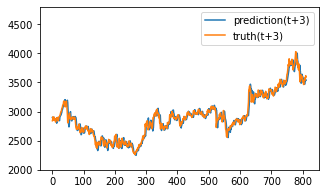

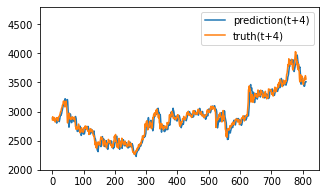

Test epoch:74 	Loss: 0.179914

Epoch: 75


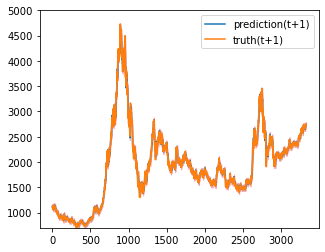

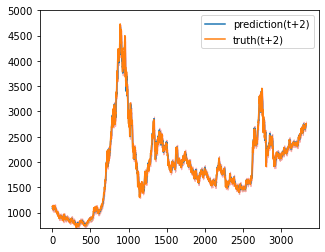

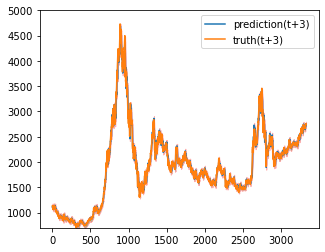

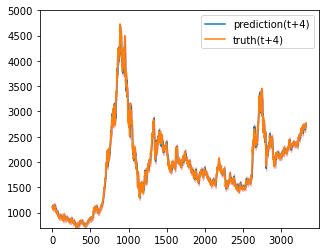

Train epoch:75 	Loss: -17.905284| Loss_in: 0.011241| Loss_out: 0.009948


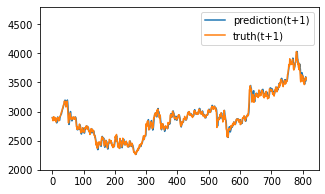

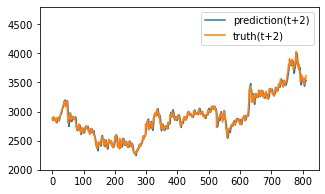

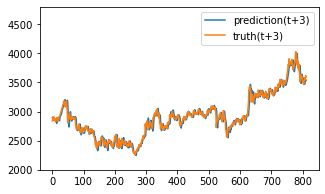

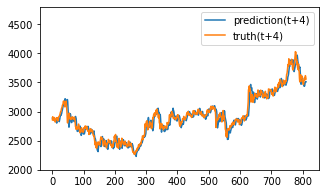

Test epoch:75 	Loss: 0.179689

Epoch: 76


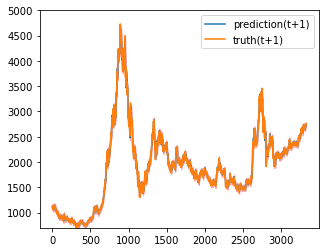

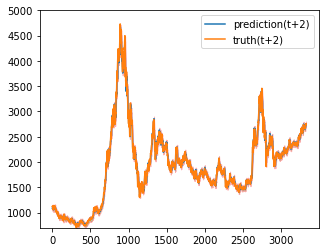

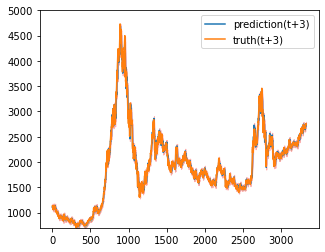

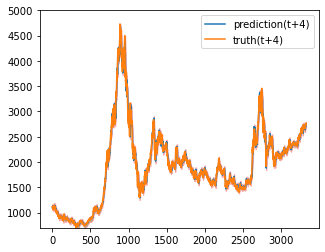

Train epoch:76 	Loss: -17.723304| Loss_in: 0.011159| Loss_out: 0.009781


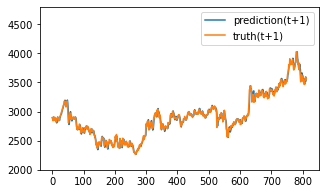

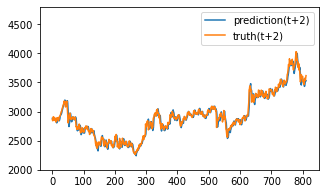

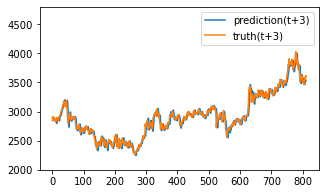

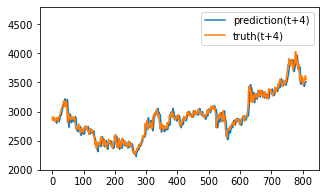

Test epoch:76 	Loss: 0.179983

Epoch: 77


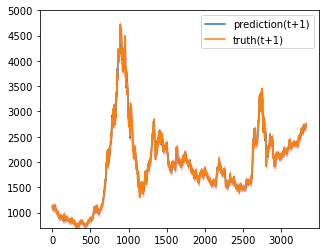

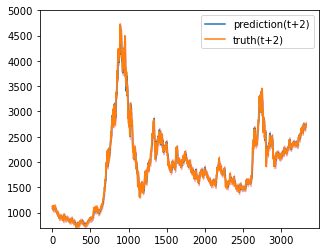

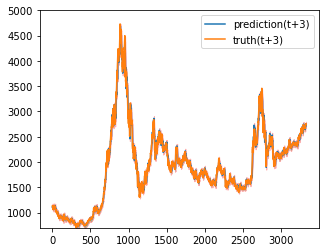

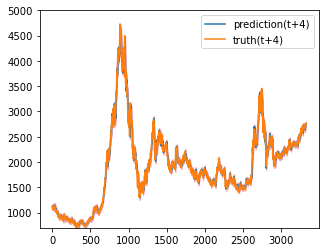

Train epoch:77 	Loss: -18.019471| Loss_in: 0.011098| Loss_out: 0.009778


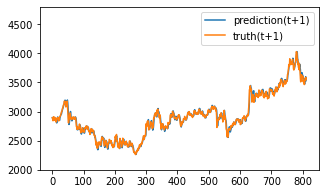

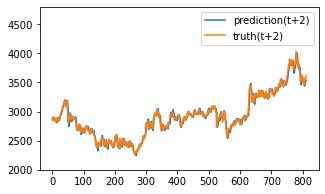

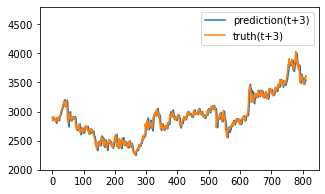

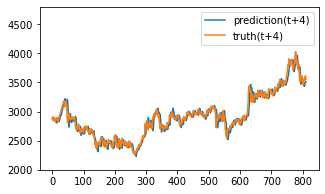

Test epoch:77 	Loss: 0.179519

Epoch: 78


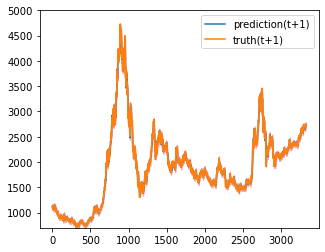

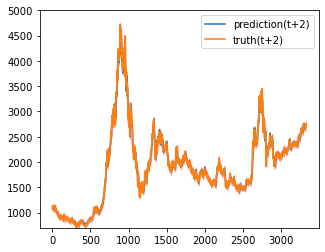

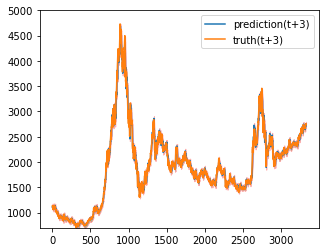

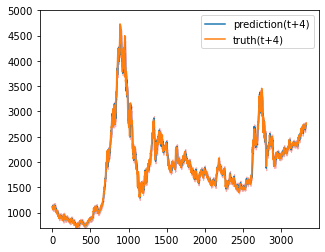

Train epoch:78 	Loss: -18.054853| Loss_in: 0.011088| Loss_out: 0.009842


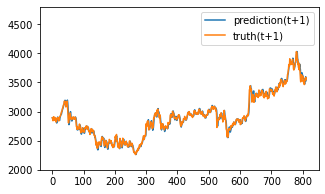

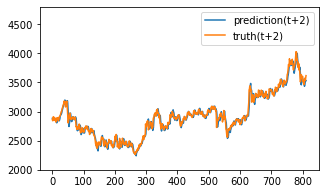

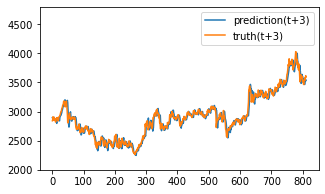

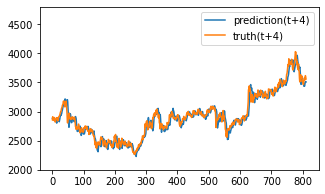

Test epoch:78 	Loss: 0.179837

Epoch: 79


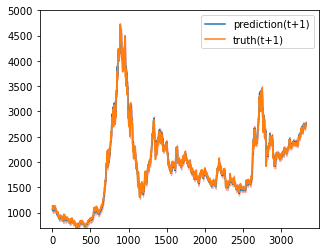

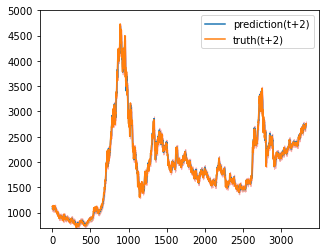

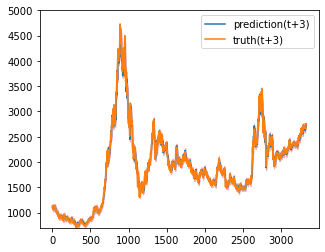

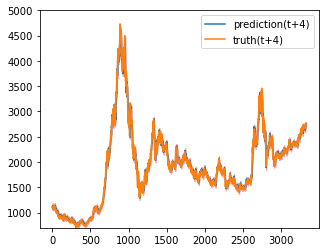

Train epoch:79 	Loss: -9.960954| Loss_in: 0.018910| Loss_out: 0.010720


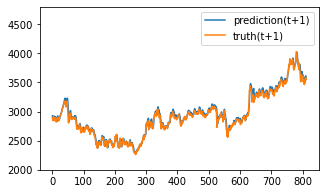

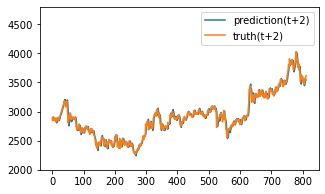

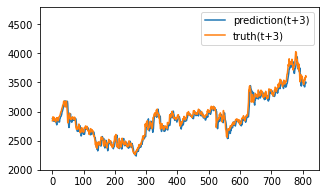

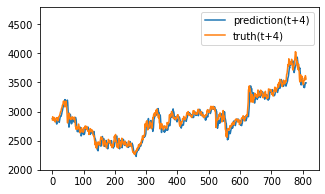

Test epoch:79 	Loss: 0.187976

Epoch: 80


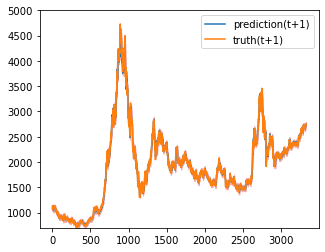

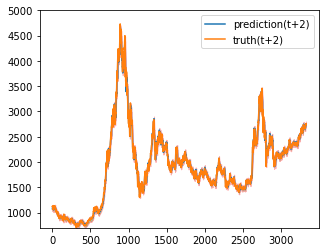

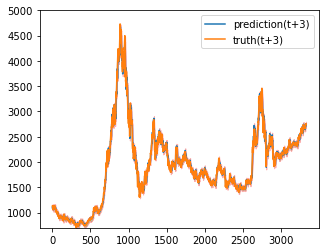

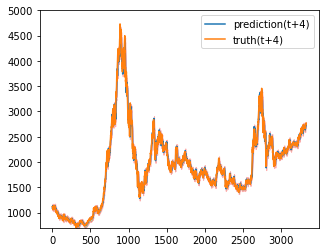

Train epoch:80 	Loss: -16.219752| Loss_in: 0.012063| Loss_out: 0.011659


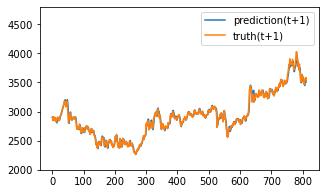

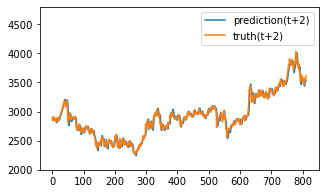

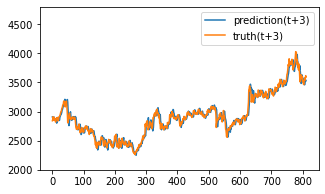

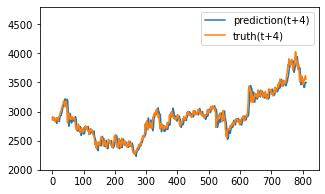

Test epoch:80 	Loss: 0.179716

Epoch: 81


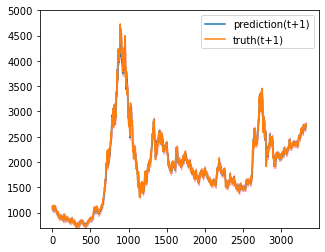

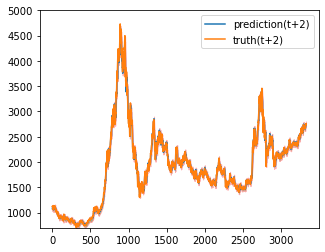

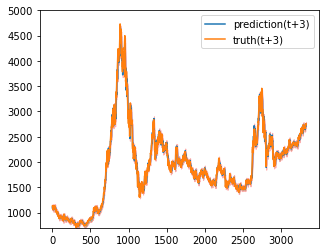

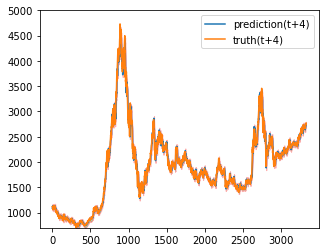

Train epoch:81 	Loss: -16.651078| Loss_in: 0.010836| Loss_out: 0.011117


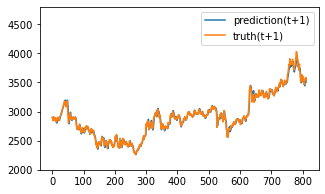

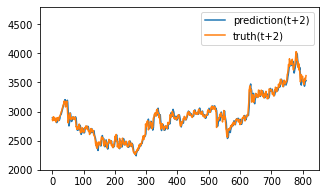

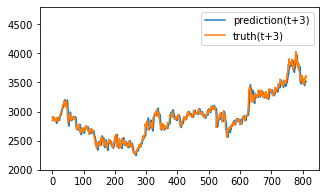

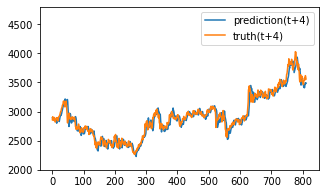

Test epoch:81 	Loss: 0.181065

Epoch: 82


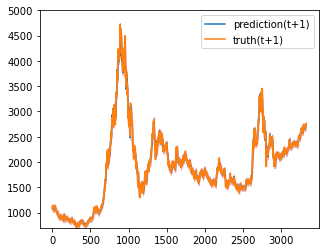

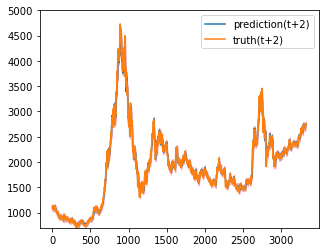

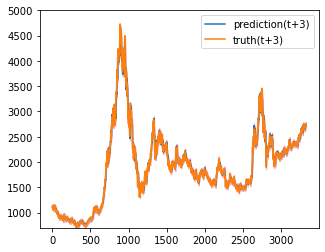

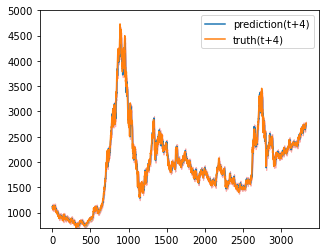

Train epoch:82 	Loss: -17.013336| Loss_in: 0.010717| Loss_out: 0.010366


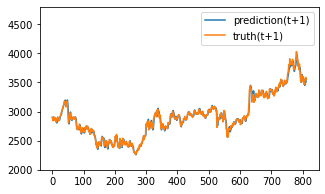

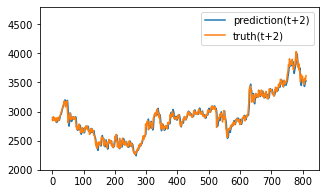

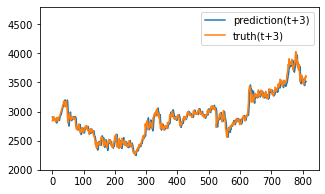

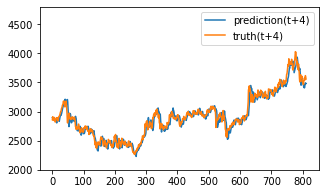

Test epoch:82 	Loss: 0.180976

Epoch: 83


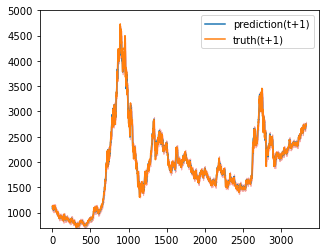

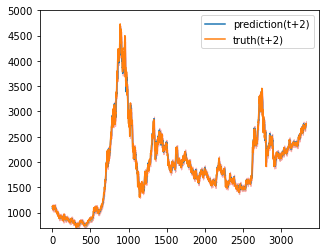

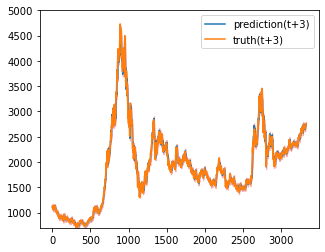

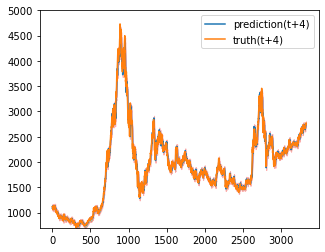

Train epoch:83 	Loss: -17.344284| Loss_in: 0.010771| Loss_out: 0.010204


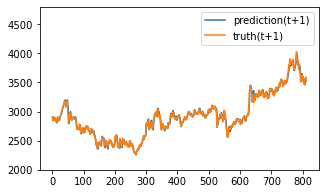

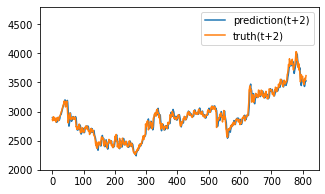

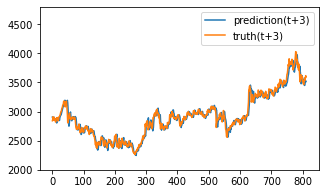

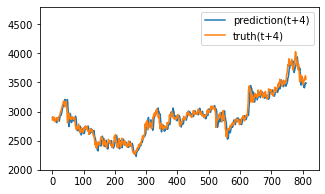

Test epoch:83 	Loss: 0.180454

Epoch: 84


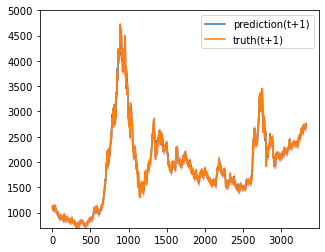

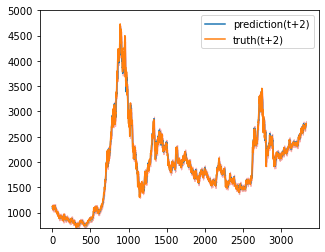

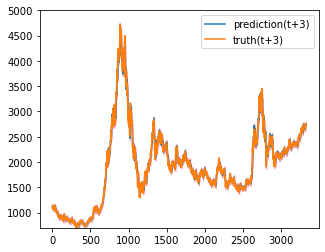

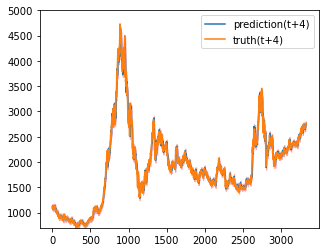

Train epoch:84 	Loss: -17.604173| Loss_in: 0.010796| Loss_out: 0.009922


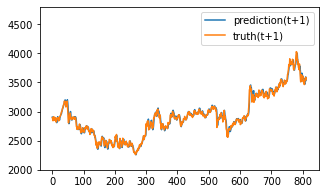

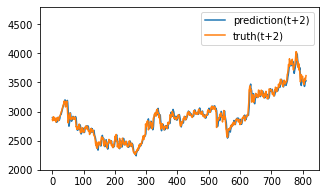

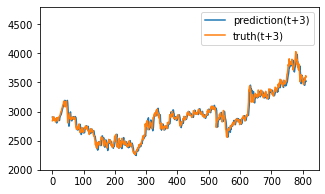

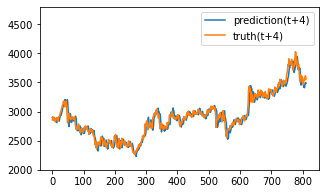

Test epoch:84 	Loss: 0.180184

Epoch: 85


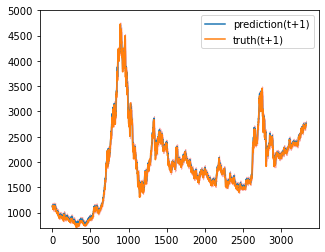

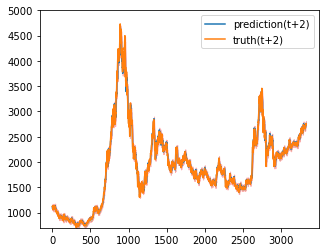

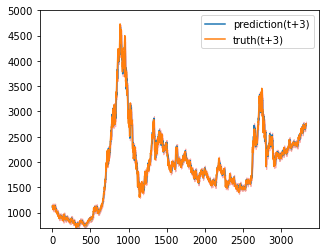

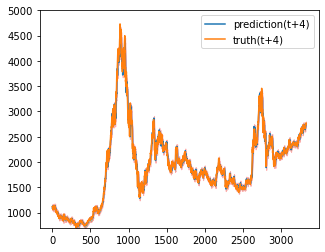

Train epoch:85 	Loss: -17.605764| Loss_in: 0.010789| Loss_out: 0.009910


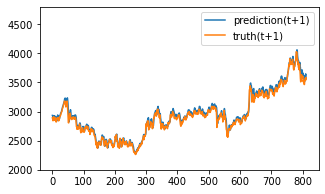

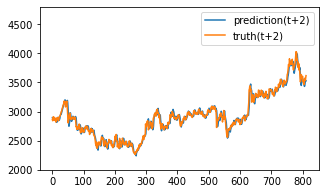

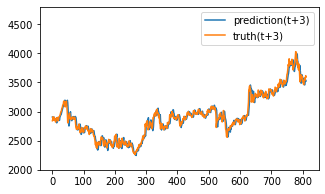

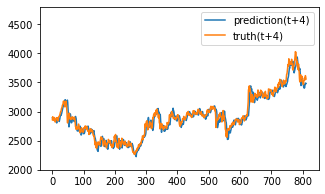

Test epoch:85 	Loss: 0.186916

Epoch: 86


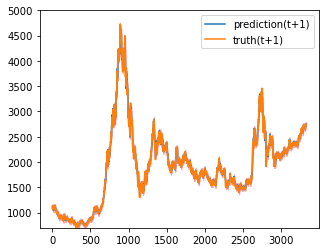

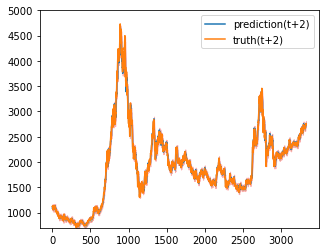

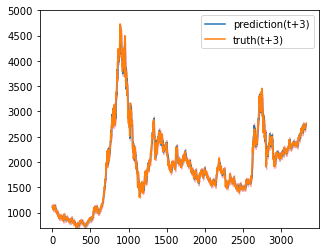

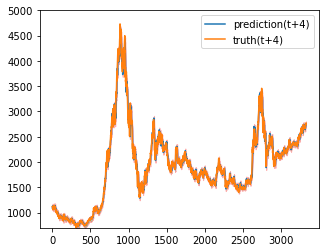

Train epoch:86 	Loss: -17.800066| Loss_in: 0.010651| Loss_out: 0.009633


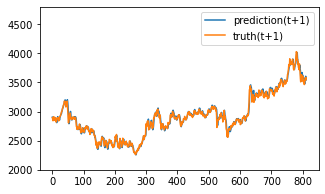

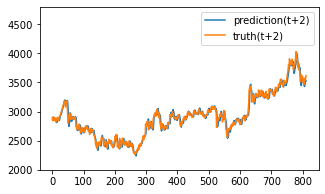

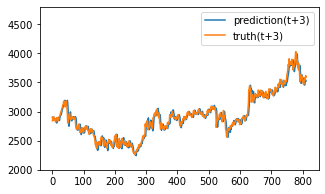

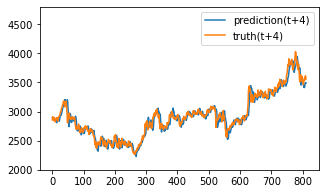

Test epoch:86 	Loss: 0.180222

Epoch: 87


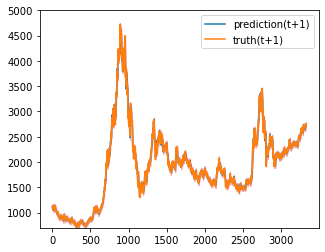

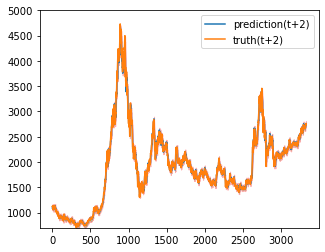

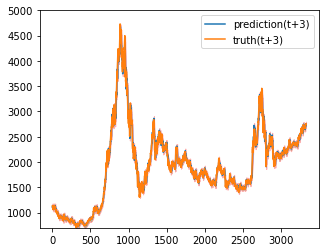

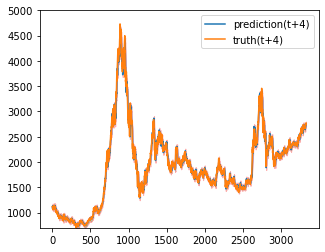

Train epoch:87 	Loss: -17.951726| Loss_in: 0.010568| Loss_out: 0.009545


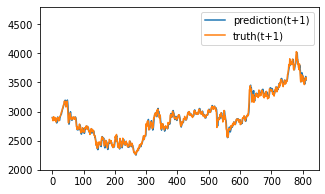

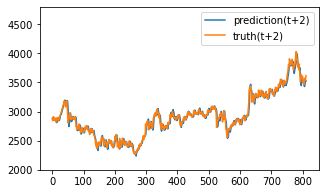

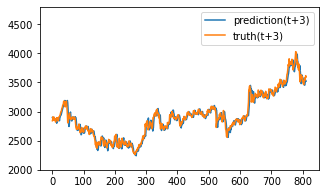

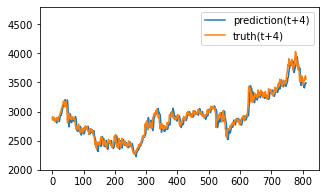

Test epoch:87 	Loss: 0.181001

Epoch: 88


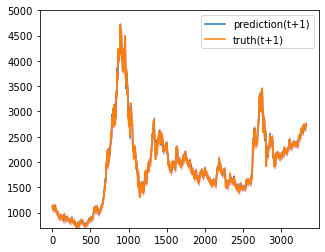

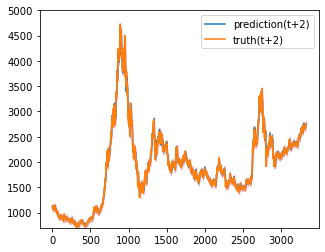

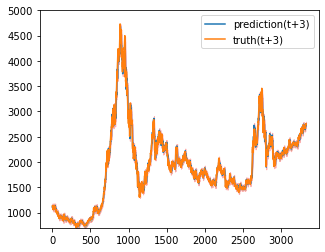

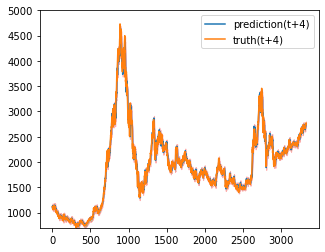

Train epoch:88 	Loss: -18.051635| Loss_in: 0.010531| Loss_out: 0.009505


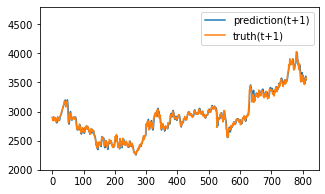

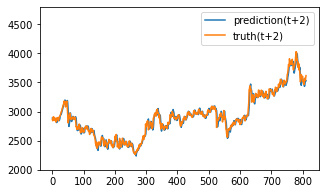

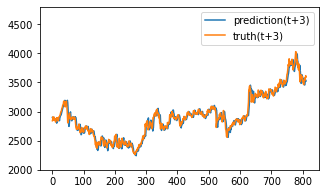

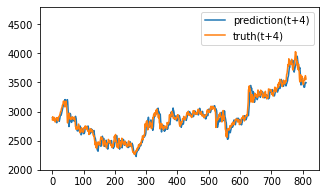

Test epoch:88 	Loss: 0.180141

Epoch: 89


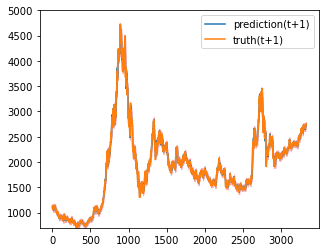

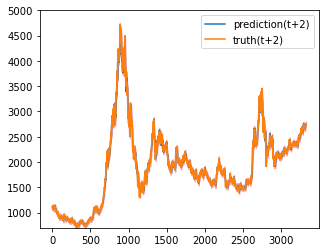

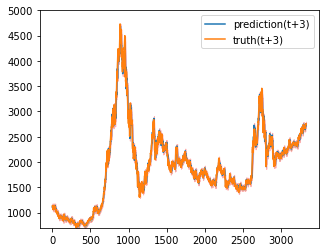

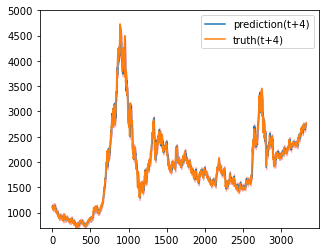

Train epoch:89 	Loss: -18.118860| Loss_in: 0.010498| Loss_out: 0.009811


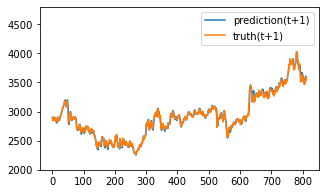

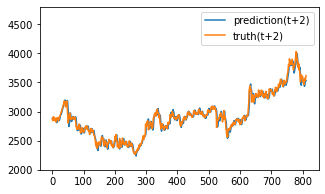

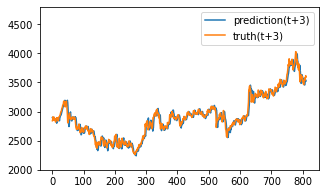

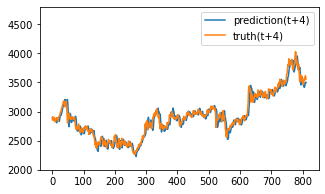

Test epoch:89 	Loss: 0.180125

Epoch: 90


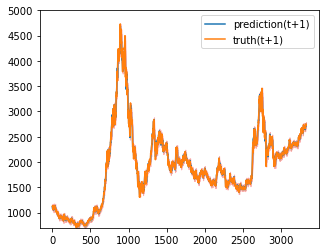

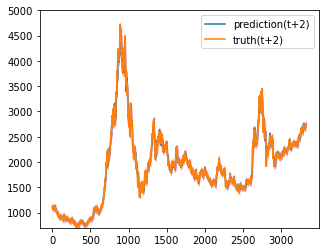

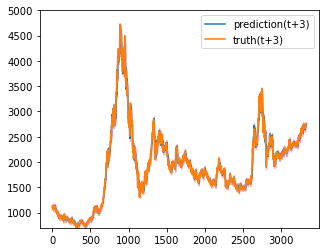

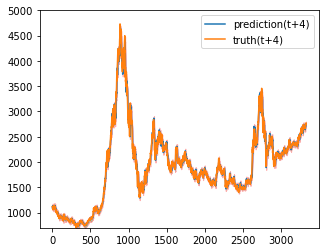

Train epoch:90 	Loss: -18.168133| Loss_in: 0.010484| Loss_out: 0.009297


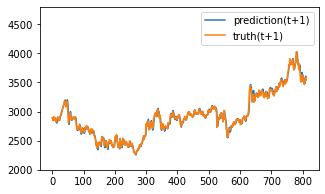

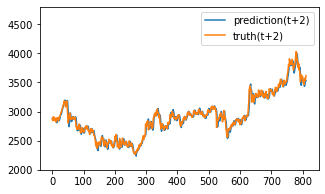

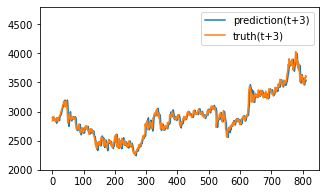

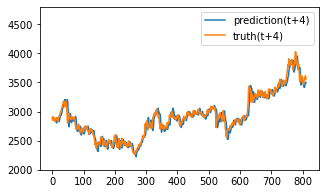

Test epoch:90 	Loss: 0.180262

Epoch: 91


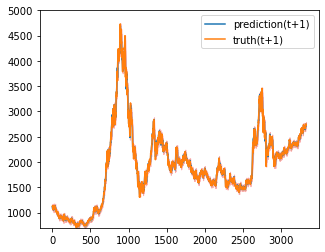

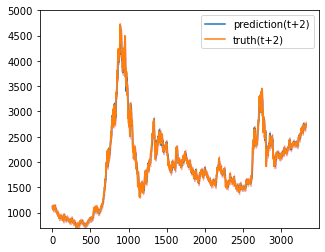

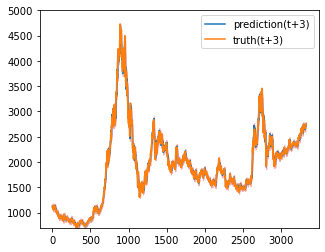

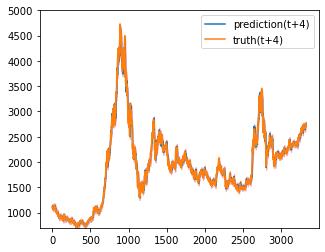

Train epoch:91 	Loss: -18.201171| Loss_in: 0.010420| Loss_out: 0.009427


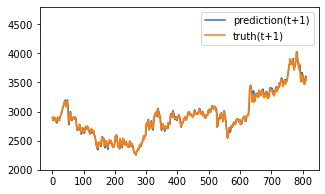

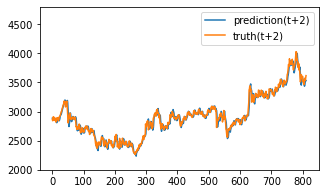

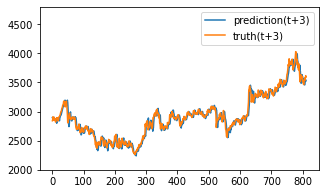

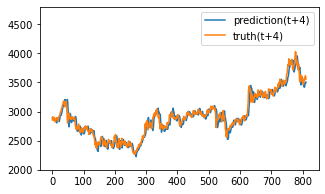

Test epoch:91 	Loss: 0.180190

Epoch: 92


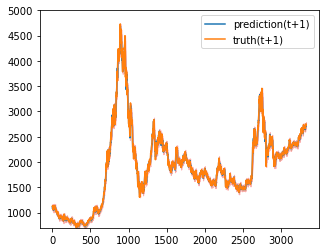

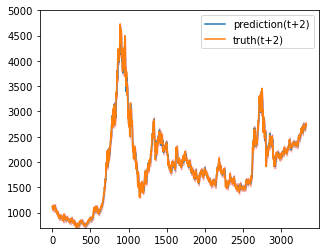

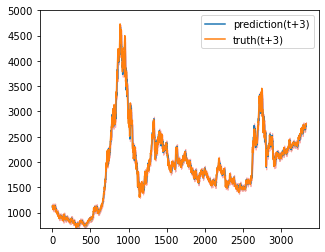

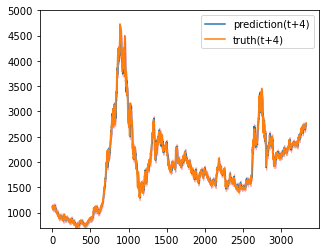

Train epoch:92 	Loss: -18.202604| Loss_in: 0.010374| Loss_out: 0.009192


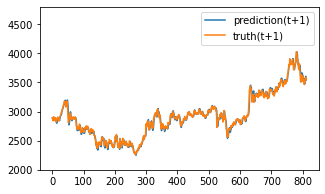

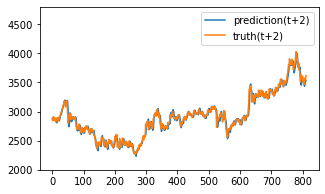

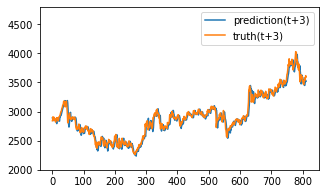

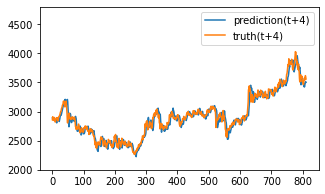

Test epoch:92 	Loss: 0.180866

Epoch: 93


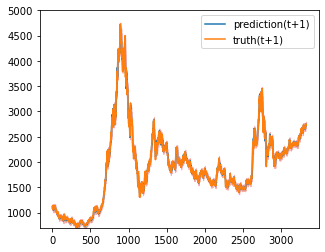

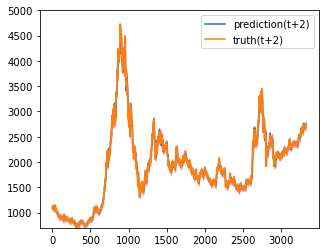

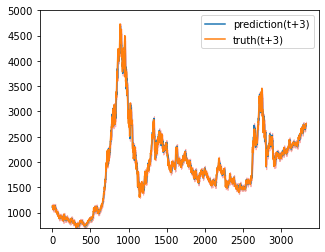

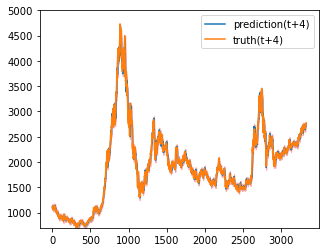

Train epoch:93 	Loss: -18.225937| Loss_in: 0.010322| Loss_out: 0.009369


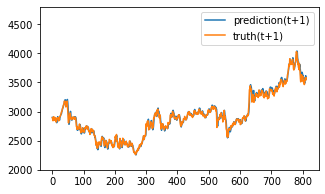

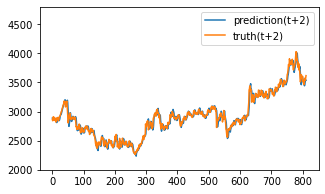

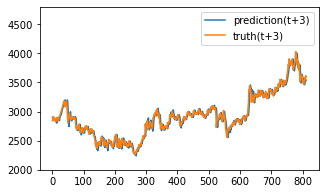

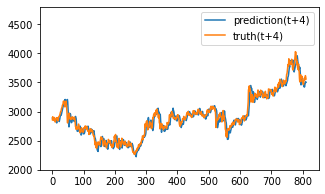

Test epoch:93 	Loss: 0.180124

Epoch: 94


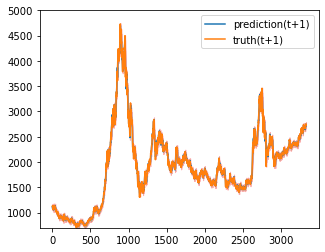

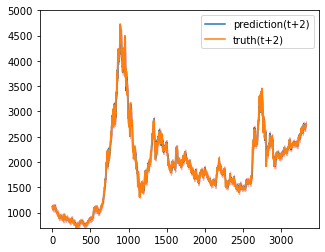

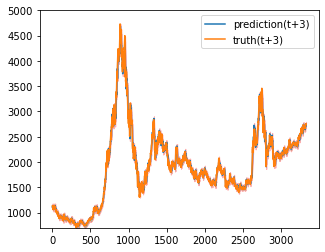

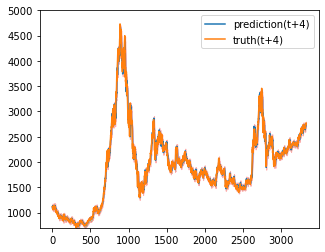

Train epoch:94 	Loss: -18.258674| Loss_in: 0.010257| Loss_out: 0.009081


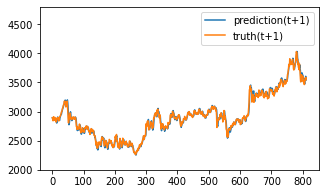

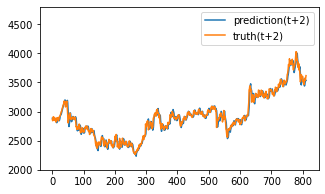

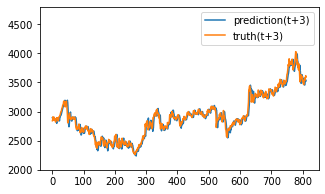

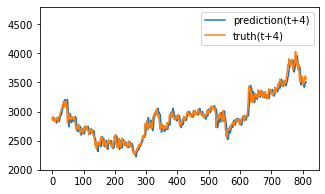

Test epoch:94 	Loss: 0.180200

Epoch: 95


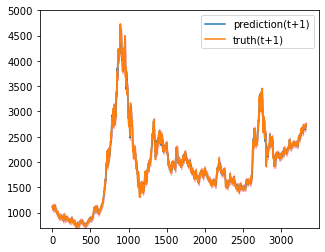

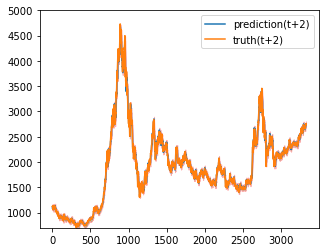

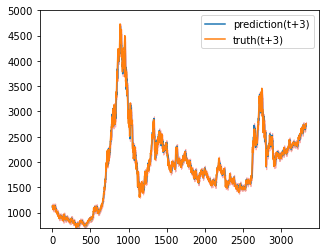

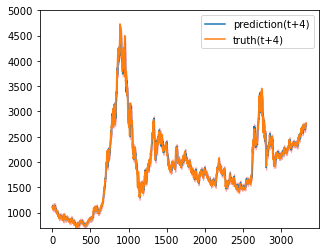

Train epoch:95 	Loss: -18.291509| Loss_in: 0.010209| Loss_out: 0.008997


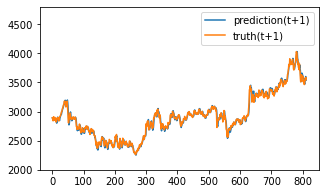

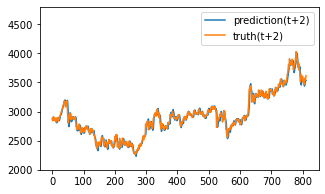

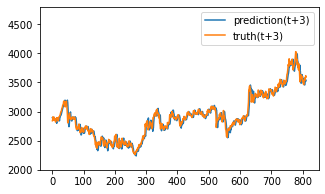

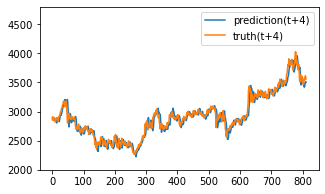

Test epoch:95 	Loss: 0.180003

Epoch: 96


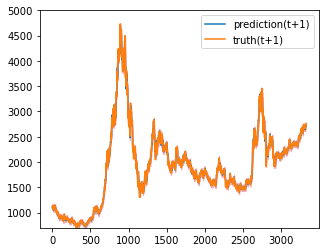

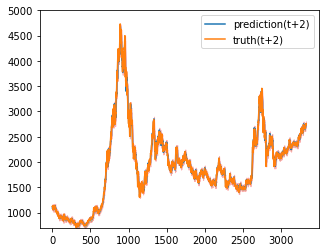

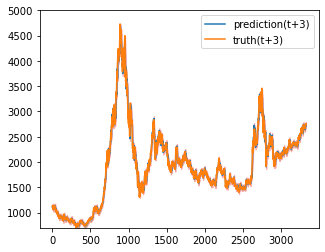

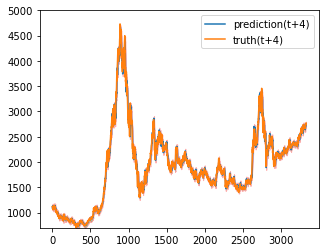

Train epoch:96 	Loss: -18.307624| Loss_in: 0.010216| Loss_out: 0.009158


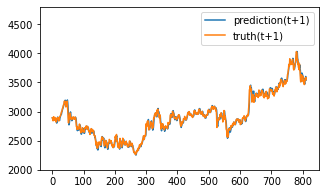

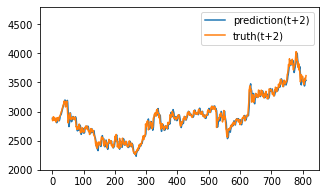

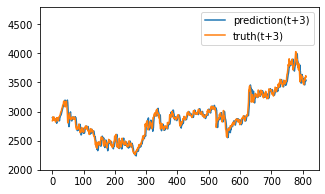

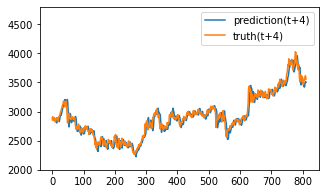

Test epoch:96 	Loss: 0.179881

Epoch: 97


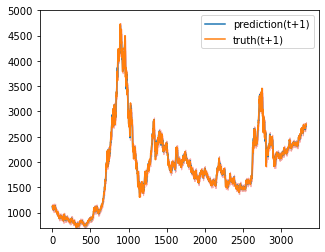

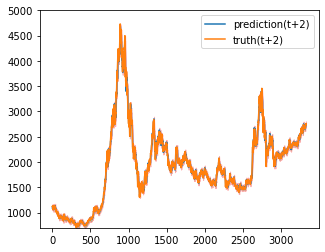

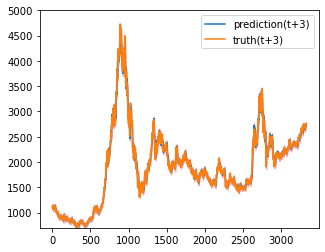

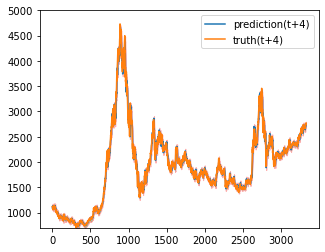

Train epoch:97 	Loss: -18.312618| Loss_in: 0.010192| Loss_out: 0.009046


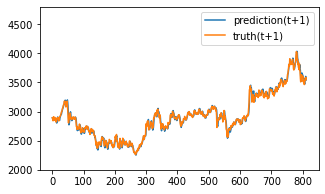

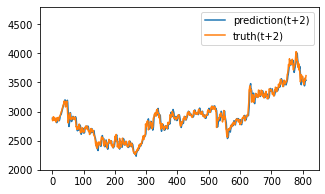

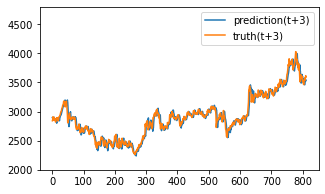

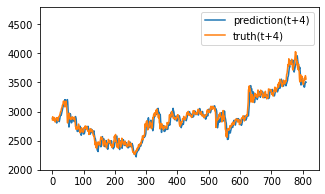

Test epoch:97 	Loss: 0.179914

Epoch: 98


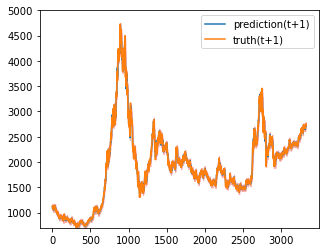

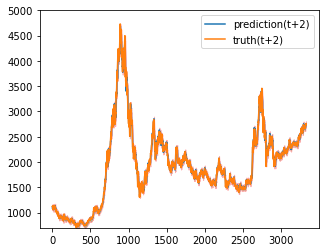

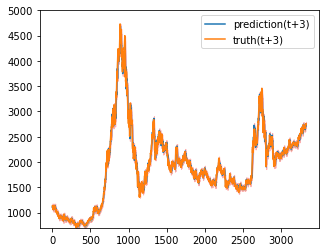

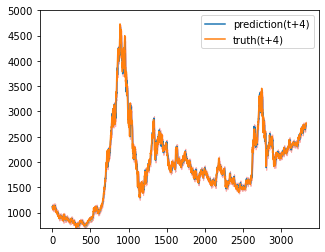

Train epoch:98 	Loss: -18.327120| Loss_in: 0.010182| Loss_out: 0.009033


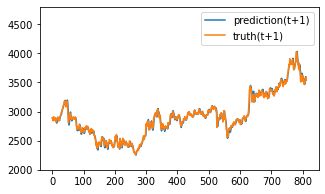

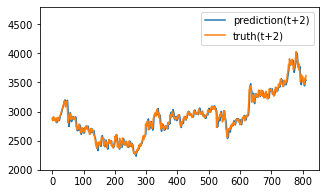

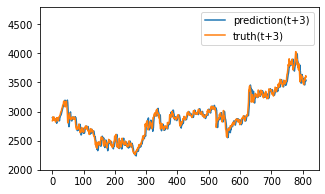

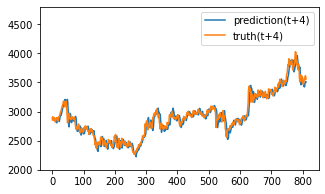

Test epoch:98 	Loss: 0.179425

Epoch: 99


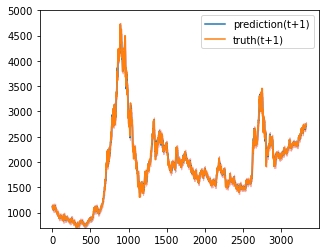

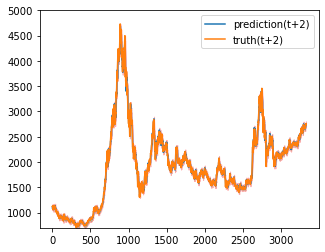

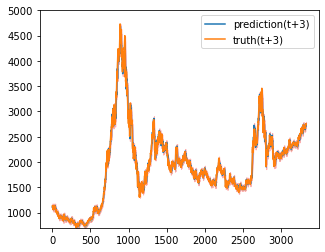

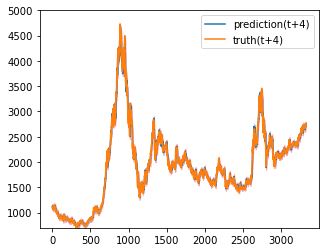

Train epoch:99 	Loss: -18.348630| Loss_in: 0.010174| Loss_out: 0.008927


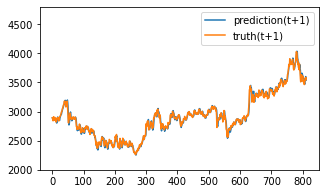

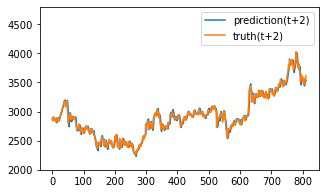

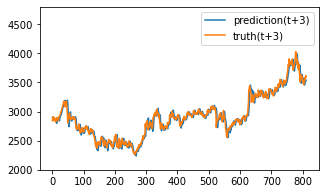

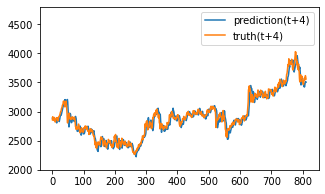

Test epoch:99 	Loss: 0.179575

Epoch: 100


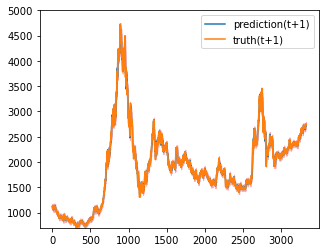

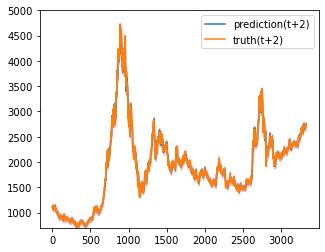

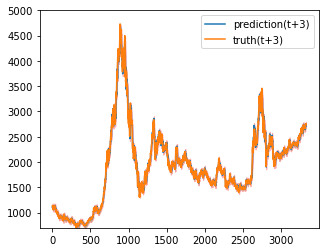

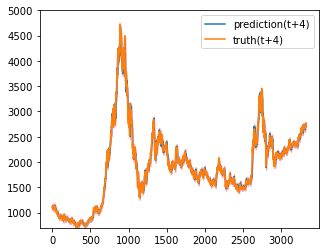

Train epoch:100 	Loss: -18.356251| Loss_in: 0.010120| Loss_out: 0.009004


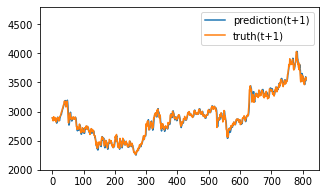

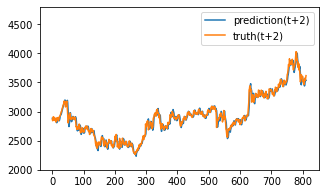

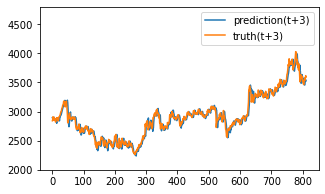

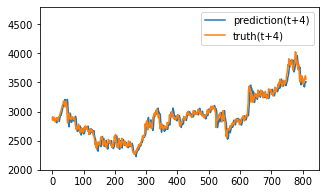

Test epoch:100 	Loss: 0.179397


In [49]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

In [50]:
train_losses

[(0.091438964, 0.06090987, 0.2461825, 0.20016755),
 (0.035632364, 0.029388538, 0.025194515, 0.048473805),
 (0.027208945, 0.024391944, 0.02083282, 0.041512147),
 (0.019561501, 0.02013741, 0.019787747, 0.034415543),
 (0.013785992, 0.015906509, 0.016151339, 0.02919689),
 (0.11686732, 0.013290418, 0.016806029, 0.024350947),
 (0.071598314, 0.011954262, 0.014050277, 0.021154929),
 (0.014288712, 0.0109484345, 0.012854271, 0.017193774),
 (0.01468562, 0.027763646, 0.018541504, 0.029152973),
 (0.0062680906, 0.0096816365, 0.011818561, 0.015113253),
 (0.0059714047, 0.0099599315, 0.011405865, 0.01464861),
 (0.007974665, 0.009172007, 0.01181577, 0.014497836),
 (0.0042565838, 0.0077583836, 0.01018469, 0.013285005),
 (0.004087205, 0.008446271, 0.010342146, 0.01608862),
 (0.004111408, 0.0076611, 0.009978776, 0.0132738855),
 (0.0041461284, 0.006728921, 0.009710533, 0.013701056),
 (0.00438542, 0.009376823, 0.0096342005, 0.013364961),
 (0.14212215, 0.0070486325, 0.012268046, 0.015991453),
 (0.11662244, 0.

In [51]:
test_losses

[(0.10670033, 0.07008061, 0.39964542, 0.03810899),
 (0.03812284, 0.018756963, 0.03879783, 0.04022895),
 (0.018186327, 0.016161269, 0.015969118, 0.027564446),
 (0.012289701, 0.014921693, 0.015486966, 0.023923172),
 (0.009219519, 0.013169618, 0.01436956, 0.021251814),
 (0.007736461, 0.012159761, 0.015123795, 0.01980255),
 (0.0066648806, 0.011479566, 0.013502282, 0.018031633),
 (0.006551679, 0.011163231, 0.012897509, 0.015535646),
 (0.006299126, 0.010906716, 0.012210059, 0.015209766),
 (0.005761828, 0.009376496, 0.011350095, 0.015453726),
 (0.005935545, 0.009114959, 0.011278802, 0.015139405),
 (0.004480404, 0.008901335, 0.010719025, 0.014209261),
 (0.0047381255, 0.0077429265, 0.010208283, 0.0137908235),
 (0.0040343544, 0.0073913126, 0.012270176, 0.017958563),
 (0.006160722, 0.010030164, 0.010009512, 0.016003512),
 (0.0034862456, 0.0073991693, 0.010105885, 0.013958946),
 (0.005100302, 0.007380547, 0.009778707, 0.015125863),
 (0.29890087, 0.0070568165, 0.009939249, 0.016802873),
 (0.2843444

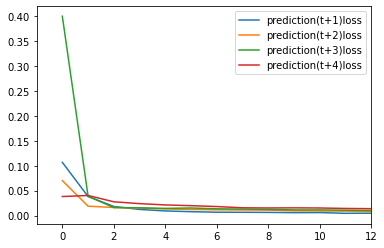

In [52]:
plt.plot(test_losses)
plt.xlim(-1,12)
plt.legend(('prediction(t+1)loss','prediction(t+2)loss','prediction(t+3)loss','prediction(t+4)loss'))
plt.show()

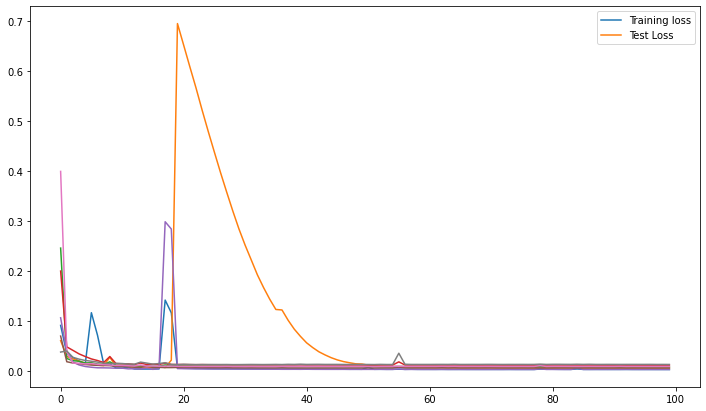

(0.0032909152, 0.006250449, 0.009332708, 0.013309147)


In [53]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

In [54]:
type(np.array(range(10)))

numpy.ndarray